<a href="https://colab.research.google.com/github/leiderTic/Proyecto-Almacen/blob/main/Desarrollo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [423]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import copy

color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

In [424]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [425]:
dataframe=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/DATASETS/ALMACEN/Historial_Demanda2.csv') #importamos el archivo csv

In [426]:
dataframe.dtypes

subarticle_id       int64
subarticle         object
material_id         int64
material           object
department         object
unit               object
total_delivered     int64
date               object
dtype: object

# COMPRENSIÓN DE LOS DATOS

In [427]:
dataframe.shape

(17863, 8)

In [428]:
dataframe.columns

Index(['subarticle_id', 'subarticle', 'material_id', 'material', 'department',
       'unit', 'total_delivered', 'date'],
      dtype='object')

In [429]:
dataframe.subarticle.nunique()

800

In [430]:
dataframe.unit.unique()

array(['CAJA', 'FRASCO ', 'PAQUETE ', 'PIEZA', 'METROS', 'ROLLO', 'TUBO',
       'JUEGO', 'BOLSA', 'HOJA', 'OVILLO', 'PAQUETE', 'HOJAS', 'FRASCO',
       'BIDÓN ', 'PAR', 'METRO', 'LITRO', 'BLOCK', 'BIDON', 'PIEZAS',
       'UNIDAD', 'GLOBAL', 'BOTE', 'Pieza', 'PÍEZA', 'KILO', 'pieza',
       'METRO LINEAL', 'LATA', 'GALON', 'BALDE', 'KILOGRAMOS', 'DOCENA',
       'METRO CUADRADO', 'paquete', 'frasco', 'bolsa', 'caja', 'Rollo',
       'juego', 'JUEGO ', 'PIEZA ', 'Metro'], dtype=object)

In [431]:
dataframe.unit.nunique()

44

In [432]:
unique_subarticles = dataframe['subarticle'].nunique()
print(f"Número de subartículos únicos: {unique_subarticles}")

Número de subartículos únicos: 800


# LIMPIEZA DE DATOS

In [433]:
dataframe.dtypes

subarticle_id       int64
subarticle         object
material_id         int64
material           object
department         object
unit               object
total_delivered     int64
date               object
dtype: object

In [434]:
dataframe.isna().sum() # Comprobar si faltan datos

subarticle_id      0
subarticle         0
material_id        0
material           0
department         0
unit               0
total_delivered    0
date               0
dtype: int64

In [435]:
dataframe.date.min(), dataframe.date.max()# Verifique la cantidad de tiempo que se recopilaron los datos

('2019/01/04', '2023/12/11')

 Obtenemos las primeras 10 fechas únicas después de ordenar la columna "date" en orden ascendente. Esto es útil para explorar rápidamente cómo están distribuidas las fechas únicas en el conjunto de datos.

In [436]:
dataframe.date.sort_values().unique()[:10]

array(['2019/01/04', '2019/01/21', '2019/01/28', '2019/01/29',
       '2019/01/31', '2019/02/04', '2019/02/05', '2019/02/06',
       '2019/02/07', '2019/02/08'], dtype=object)

In [437]:
dataframe['unit'] = dataframe['unit'].str.upper()
dataframe['unit'] = dataframe['unit'].str.replace(' ', '')

In [438]:
dataframe.unit.unique()

array(['CAJA', 'FRASCO', 'PAQUETE', 'PIEZA', 'METROS', 'ROLLO', 'TUBO',
       'JUEGO', 'BOLSA', 'HOJA', 'OVILLO', 'HOJAS', 'BIDÓN', 'PAR',
       'METRO', 'LITRO', 'BLOCK', 'BIDON', 'PIEZAS', 'UNIDAD', 'GLOBAL',
       'BOTE', 'PÍEZA', 'KILO', 'METROLINEAL', 'LATA', 'GALON', 'BALDE',
       'KILOGRAMOS', 'DOCENA', 'METROCUADRADO'], dtype=object)

In [439]:
dataframe.unit.nunique()

31

In [440]:
# Contar cuántos tienen el valor 0
count_zeros = (dataframe['total_delivered'] == 0).sum()

In [441]:
print(f'Número de valores 0 en la columna: {count_zeros}')

Número de valores 0 en la columna: 86


In [442]:
# Eliminar las filas con el valor 0
dataframe = dataframe[dataframe['total_delivered']!= 0]

In [443]:
dataframe['date'] = pd.to_datetime(dataframe['date'])
dataframe['total'] = dataframe.groupby(['subarticle_id', 'date'])['total_delivered'].transform('sum')
print(dataframe[['subarticle_id', 'date', 'total']])

       subarticle_id       date  total
0                866 2019-01-04      4
1                862 2019-01-04      2
2                822 2019-01-04     11
3                880 2019-01-04      1
4                893 2019-01-04      2
...              ...        ...    ...
17858           1631 2023-12-08     10
17859           1655 2023-12-08     20
17860           1631 2023-12-11     50
17861           1641 2023-12-11     30
17862           1655 2023-12-11     50

[17777 rows x 3 columns]


In [444]:
dataframe.head(10)

,subarticle_id,subarticle,material_id,material,department,unit,total_delivered,date,total
0,866,PAÑUELOS DESECHABLES DE DOBLE HOJA DE 90 UNIDADES,23,MATERIAL DE LIMPIEZA E HIGIENE,DIRECCIÓN GENERAL EJECUTIVA,CAJA,1,2019-01-04,4
1,862,AMBIENTADOR EN SPRAY 360 ML CON BOTÓN DE PLÁSTICO,23,MATERIAL DE LIMPIEZA E HIGIENE,DIRECCIÓN GENERAL EJECUTIVA,FRASCO,2,2019-01-04,2
2,822,PAPEL BOND TAMAÑO CARTA DE 75 GR (PAQUETE DE 5...,5,PAPEL,ACTIVOS FIJOS,PAQUETE,8,2019-01-04,11
3,880,CABLE HDMI DE 10 M; TIPO PLANO,29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,1,2019-01-04,1
4,893,TOMA CORRIENTE DOBLE CON TIERRA PARA SOBREPONER,29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,2,2019-01-04,2
5,886,ENCHUFE MACHO PLANO,29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,2,2019-01-04,2
6,850,"CABLE DUCTO DE 1,8 CM",18,PRODUCTOS DE MINERALES NO METÁLICOS Y PLÁSTICOS,ACTIVOS FIJOS,METROS,1,2019-01-04,1
7,851,CABLE DUCTO DE 2 METROS (10 X 20 MM),29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,6,2019-01-04,6
8,935,CUADERNO DE 100 HOJAS CON ESPIRAL TAMAÑO OFICIO,27,ÚTILES DE ESCRITORIO Y OFICINA,DIRECCIÓN GENERAL EJECUTIVA,PIEZA,3,2019-01-04,3
9,822,PAPEL BOND TAMAÑO CARTA DE 75 GR (PAQUETE DE 5...,5,PAPEL,DIRECCIÓN GENERAL EJECUTIVA,PAQUETE,3,2019-01-04,11


In [445]:
#dataframe.to_csv('e1.csv', index=False)

In [446]:
# Eliminar duplicados, manteniendo la primera aparición
df_back = dataframe.copy()
dataframe = dataframe.drop_duplicates(subset=['subarticle_id', 'date'], keep='first')

In [447]:
dataframe.nunique()

subarticle_id      801
subarticle         799
material_id         26
material            23
department          18
unit                31
total_delivered    131
date               636
total              158
dtype: int64

# ANÁLISIS UNIVARIADO

In [448]:
dataframe.head()

,subarticle_id,subarticle,material_id,material,department,unit,total_delivered,date,total
0,866,PAÑUELOS DESECHABLES DE DOBLE HOJA DE 90 UNIDADES,23,MATERIAL DE LIMPIEZA E HIGIENE,DIRECCIÓN GENERAL EJECUTIVA,CAJA,1,2019-01-04,4
1,862,AMBIENTADOR EN SPRAY 360 ML CON BOTÓN DE PLÁSTICO,23,MATERIAL DE LIMPIEZA E HIGIENE,DIRECCIÓN GENERAL EJECUTIVA,FRASCO,2,2019-01-04,2
2,822,PAPEL BOND TAMAÑO CARTA DE 75 GR (PAQUETE DE 5...,5,PAPEL,ACTIVOS FIJOS,PAQUETE,8,2019-01-04,11
3,880,CABLE HDMI DE 10 M; TIPO PLANO,29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,1,2019-01-04,1
4,893,TOMA CORRIENTE DOBLE CON TIERRA PARA SOBREPONER,29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,2,2019-01-04,2


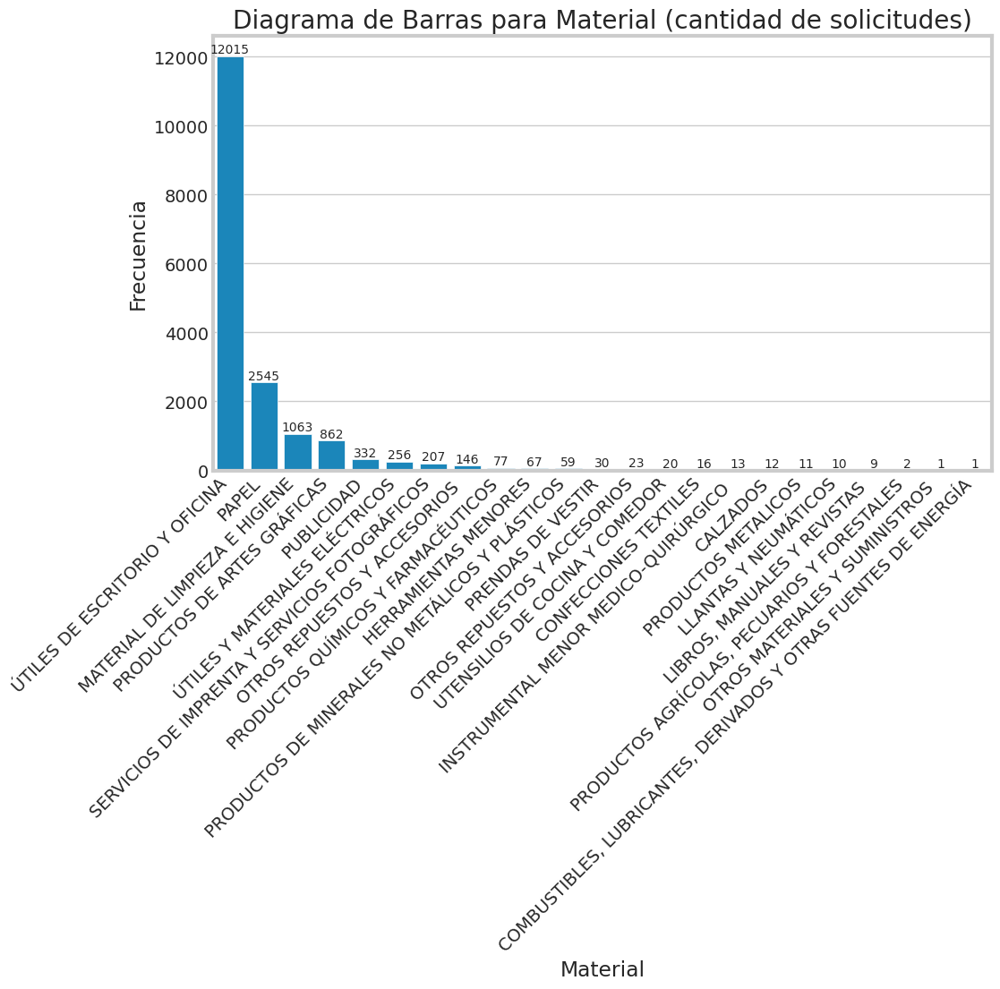

In [449]:
# Establece el estilo de fondo a 'whitegrid'
sns.set_style('whitegrid')

plt.figure(figsize=(10, 6))

# Crea el diagrama de barras vertical
sns.countplot(x='material', data=df_back, order=df_back['material'].value_counts().index)

# Anota cada barra con su valor
for index, value in enumerate(df_back['material'].value_counts()):
    plt.text(index, value, str(value), ha='center', va='bottom', fontsize=10)

plt.xlabel('Material')
plt.ylabel('Frecuencia')
plt.title('Diagrama de Barras para Material (cantidad de solicitudes)')
plt.xticks(rotation=45, ha='right')
plt.show()

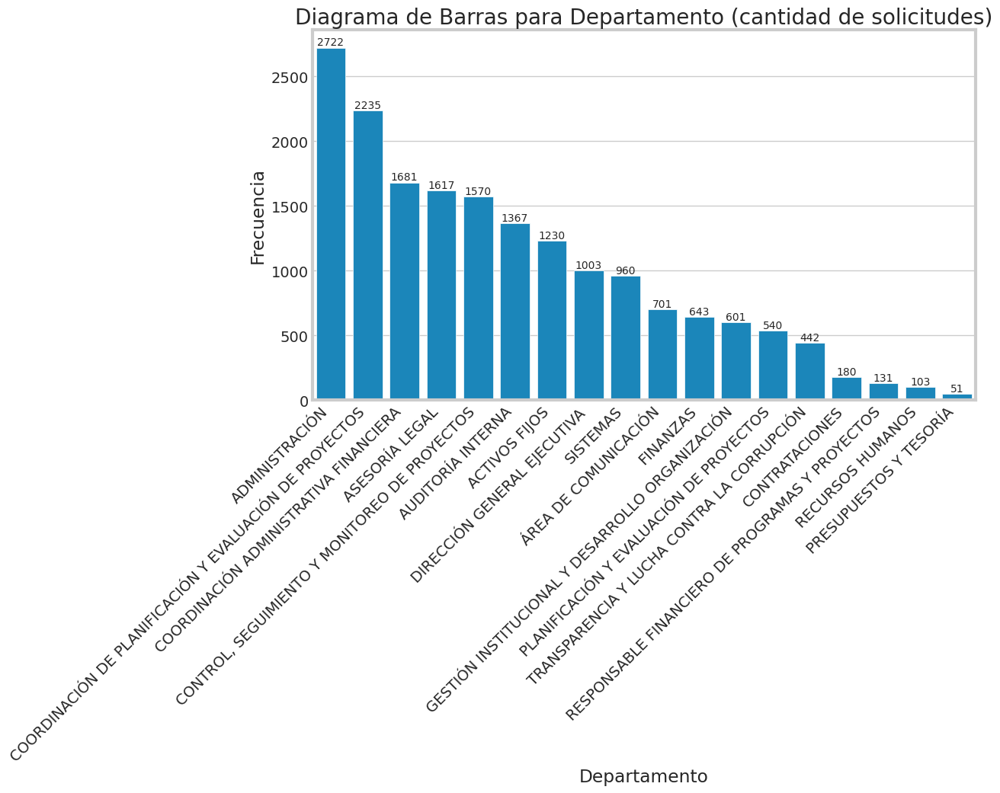

In [450]:
# Establece el estilo de fondo a 'whitegrid'
sns.set_style('whitegrid')
plt.figure(figsize=(10, 6))
# Crea el diagrama de barras vertical
sns.countplot(x='department', data=df_back, order=df_back['department'].value_counts().index)
# Anota cada barra con su valor
for index, value in enumerate(df_back['department'].value_counts()):
    plt.text(index, value, str(value), ha='center', va='bottom', fontsize=10)
plt.xlabel('Departamento')
plt.ylabel('Frecuencia')
plt.title('Diagrama de Barras para Departamento (cantidad de solicitudes)')
plt.xticks(rotation=45, ha='right')
plt.show()

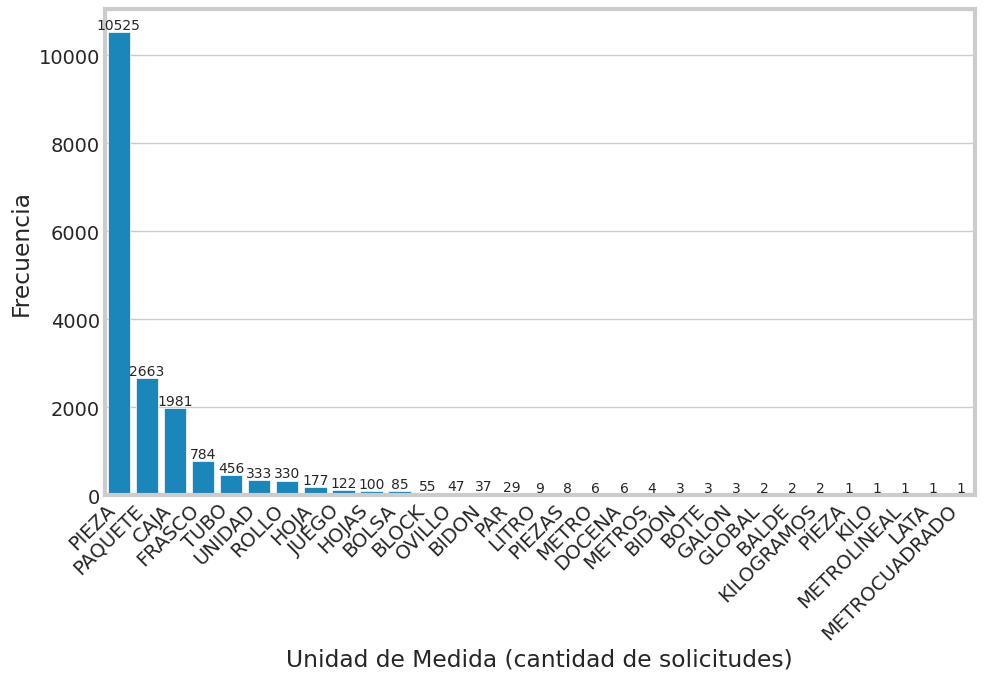

In [451]:
# Establece el estilo de fondo a 'whitegrid'
sns.set_style('whitegrid')
plt.figure(figsize=(10, 6))
# Crea el diagrama de barras vertical
sns.countplot(x='unit', data=df_back, order=df_back['unit'].value_counts().index)
# Anota cada barra con su valor
for index, value in enumerate(df_back['unit'].value_counts()):
    plt.text(index, value, str(value), ha='center', va='bottom', fontsize=10)
plt.xlabel('Unidad de Medida (cantidad de solicitudes)')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45, ha='right')
plt.show()

# ANÁLISIS BIVARIADO/ANÁLISIS MULTIVARIADO

<ipython-input-452-8e643fdf24d5>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='department', y='total_delivered', data=df_back, palette='viridis')


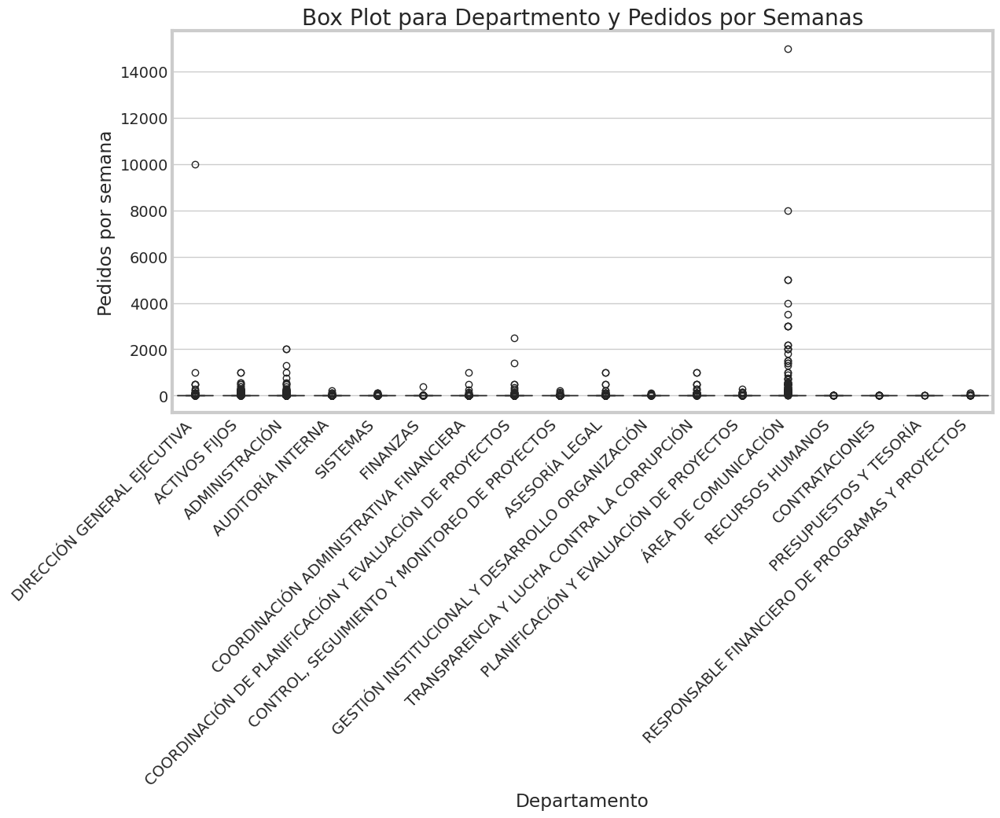

In [452]:

plt.figure(figsize=(12, 6))

# Crea un Box Plot para department y requests_per_month
sns.boxplot(x='department', y='total_delivered', data=df_back, palette='viridis')

plt.xlabel('Departamento')
plt.ylabel('Pedidos por semana')
plt.title('Box Plot para Departmento y Pedidos por Semanas')

plt.xticks(rotation=45, ha='right')
plt.show()

<ipython-input-453-968cbf972b92>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='unit', y='total_delivered', data=df_back,palette='viridis')


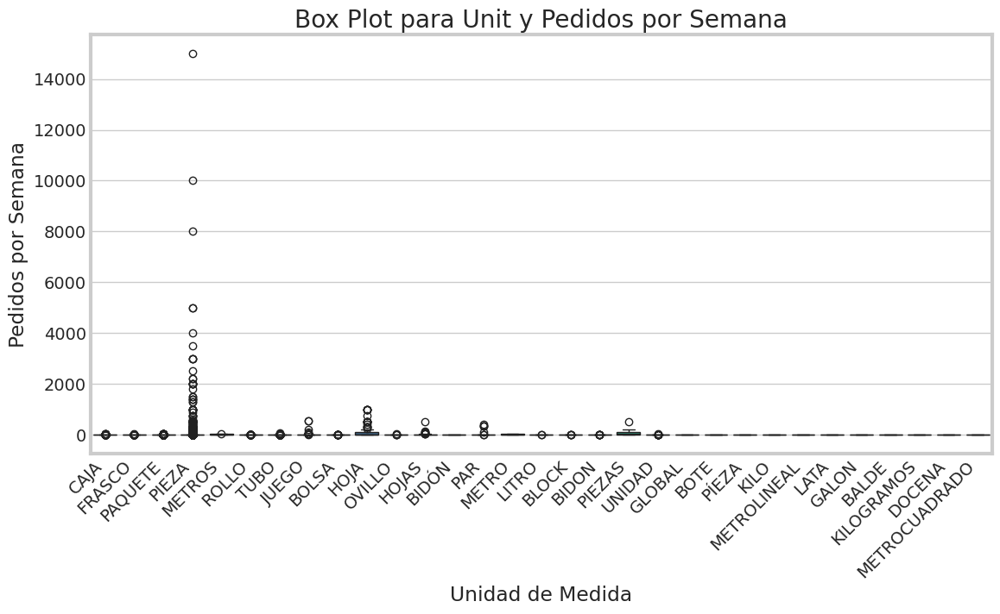

In [453]:
# Ajusta el tamaño de la figura según tus preferencias
plt.figure(figsize=(12, 6))

# Crea un Box Plot para unit y requests_per_week
sns.boxplot(x='unit', y='total_delivered', data=df_back,palette='viridis')

plt.xlabel('Unidad de Medida')
plt.ylabel('Pedidos por Semana')
plt.title('Box Plot para Unit y Pedidos por Semana')

plt.xticks(rotation=45, ha='right')
plt.show()

In [454]:
dataframe.dtypes

subarticle_id               int64
subarticle                 object
material_id                 int64
material                   object
department                 object
unit                       object
total_delivered             int64
date               datetime64[ns]
total                       int64
dtype: object

In [455]:
dataframe.describe()

,subarticle_id,material_id,total_delivered,total
count,11612.000000,11612.000000,11612.000000,11612.000000
mean,1042.074664,24.334912,15.805115,17.764037
std,188.291492,8.082143,221.962366,223.506299
min,810.000000,4.000000,1.000000,1.000000
25%,932.000000,27.000000,1.000000,1.000000
50%,984.000000,27.000000,1.000000,2.000000
75%,1056.000000,27.000000,2.000000,4.000000
max,1673.000000,38.000000,15000.000000,15000.000000


In [456]:
#dataframe.to_csv('ekkkkkk8.csv', index=False)

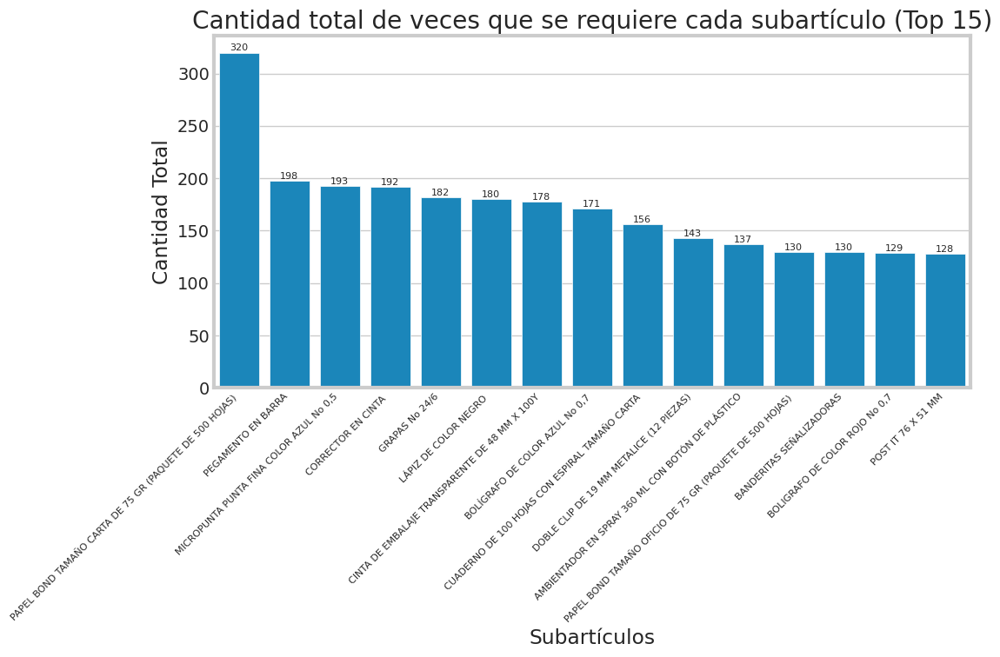

In [457]:
# Obtener los primeros 15 subartículos con mayor frecuencia
top_15_subarticles = dataframe['subarticle'].value_counts().nlargest(15).index
# Contar la cantidad total de veces que se requiere cada subartículo en el DataFrame
subarticle_counts = dataframe['subarticle'].value_counts().loc[top_15_subarticles]
# Graficar la cantidad total de veces que se requiere cada subartículo en una gráfica de barras
plt.figure(figsize=(10, 5))
sns.barplot(x=subarticle_counts.index, y=subarticle_counts.values, order=top_15_subarticles)
plt.title('Cantidad total de veces que se requiere cada subartículo (Top 15)')
plt.xlabel('Subartículos')
plt.ylabel('Cantidad Total')
plt.xticks(rotation=45, ha='right', fontsize=8)
# Agregar el valor numérico en cada barra
for i, v in enumerate(subarticle_counts.values):
    plt.text(i, v + 0.1, str(v), ha='center', va='bottom', fontsize=8)
plt.show()

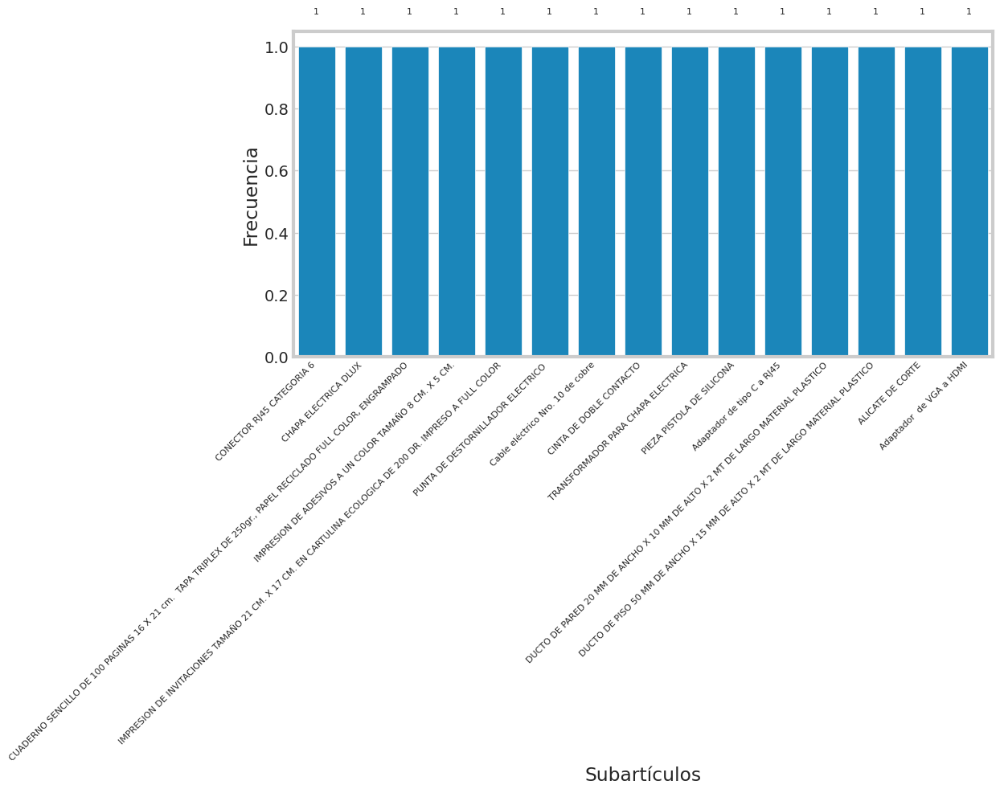

In [458]:
# Obtener los últimos 15 subartículos con menor frecuencia
bottom_15_subarticles = dataframe['subarticle'].value_counts().nsmallest(15).index
# Filtrar el DataFrame para incluir solo las filas con los 15 últimos subartículos
df_bottom_15 = dataframe[dataframe['subarticle'].isin(bottom_15_subarticles)]
# Contar la frecuencia de cada subartículo
subarticle_counts = df_bottom_15['subarticle'].value_counts()
# Graficar la frecuencia de los últimos 15 subartículos en una gráfica de barras
plt.figure(figsize=(10, 5))
sns.barplot(x=subarticle_counts.index, y=subarticle_counts.values, order=bottom_15_subarticles)
plt.title('')
plt.xlabel('Subartículos')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45, ha='right', fontsize=8)
# Agregar el valor numérico en cada barra
for i, v in enumerate(subarticle_counts.values):
    plt.text(i, v + 0.1, str(v), ha='center', va='bottom', fontsize=8)
plt.show()

In [459]:
dataframe.head()

,subarticle_id,subarticle,material_id,material,department,unit,total_delivered,date,total
0,866,PAÑUELOS DESECHABLES DE DOBLE HOJA DE 90 UNIDADES,23,MATERIAL DE LIMPIEZA E HIGIENE,DIRECCIÓN GENERAL EJECUTIVA,CAJA,1,2019-01-04,4
1,862,AMBIENTADOR EN SPRAY 360 ML CON BOTÓN DE PLÁSTICO,23,MATERIAL DE LIMPIEZA E HIGIENE,DIRECCIÓN GENERAL EJECUTIVA,FRASCO,2,2019-01-04,2
2,822,PAPEL BOND TAMAÑO CARTA DE 75 GR (PAQUETE DE 5...,5,PAPEL,ACTIVOS FIJOS,PAQUETE,8,2019-01-04,11
3,880,CABLE HDMI DE 10 M; TIPO PLANO,29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,1,2019-01-04,1
4,893,TOMA CORRIENTE DOBLE CON TIERRA PARA SOBREPONER,29,ÚTILES Y MATERIALES ELÉCTRICOS,ACTIVOS FIJOS,PIEZA,2,2019-01-04,2


<ipython-input-460-c7f9107406b4>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_monthly = dataframe.resample('M', on='date').sum()
<ipython-input-460-c7f9107406b4>:7: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x=df_monthly.index, y='log_total', data=df_monthly, palette='viridis')


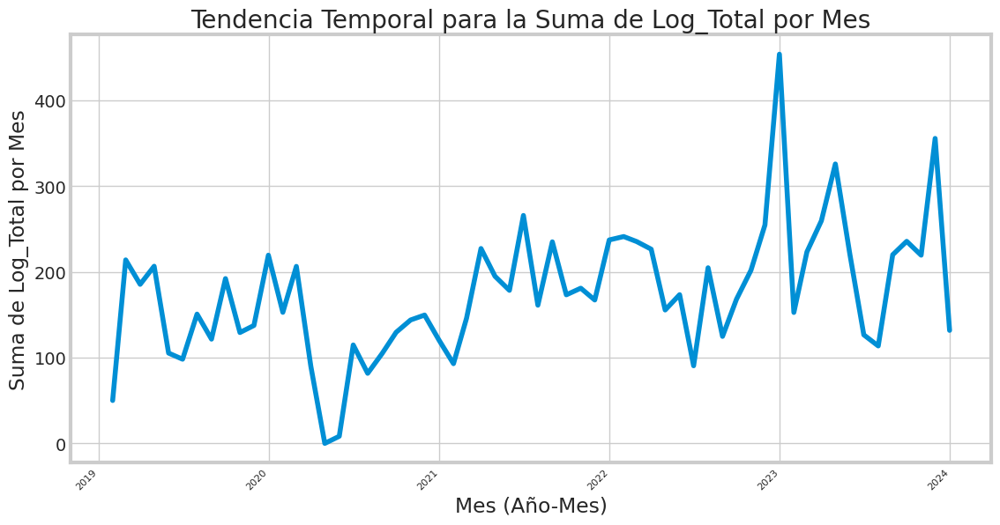

In [460]:
dataframe['log_total'] = np.log(dataframe['total'])
# Agrupa por mes y calcula la suma de 'log_total' para cada mes
df_monthly = dataframe.resample('M', on='date').sum()
# Ajusta el tamaño de la figura según tus preferencias
plt.figure(figsize=(12, 6))
# Crea un Line Plot para 'date' y 'log_total'
sns.lineplot(x=df_monthly.index, y='log_total', data=df_monthly, palette='viridis')
plt.xlabel('Mes (Año-Mes)')
plt.ylabel('Suma de Log_Total por Mes')
plt.title('Tendencia Temporal para la Suma de Log_Total por Mes')
# Ajusta el tamaño de la fuente en el eje x
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.show()
dataframe = dataframe.drop('log_total', axis=1)

In [461]:
dataframe = dataframe.rename(columns={'date': 'Date', 'total': 'Total'})

In [462]:
dataframe.to_csv('dataframe.csv', index=False)

# CLASES RNR-LSTM Y ARIMA

In [463]:
%run "/content/drive/MyDrive/Colab Notebooks/PROYECTO_ALMACEN/Rnr_lstm.ipynb"

In [464]:
%run "/content/drive/MyDrive/Colab Notebooks/PROYECTO_ALMACEN/Arima.ipynb"

# FUNCIONES DE APOYO

In [465]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

def graficar_comparacion(df_result):
    """
    Función para graficar y comparar los valores reales con las predicciones.

    Parámetros:
    - df_result: pandas DataFrame, DataFrame que contiene las columnas 'Date', 'Valor_real', 'RNR LSTM' y 'ARIMA'.
    """
    # Graficar los valores reales y las predicciones
    plt.figure(figsize=(15, 6))
    plt.plot(df_result['Date'], df_result['Valor_real'], label='Valor Real', marker='o')
    plt.plot(df_result['Date'], df_result['RNR LSTM'], label='RNR LSTM', marker='o')
    plt.plot(df_result['Date'], df_result['ARIMA'], label='ARIMA', marker='o')

    # Configuración del gráfico
    plt.xlabel('Fecha')
    plt.ylabel('Valores')
    plt.title('Comparación entre Valor Real, RNR LSTM y ARIMA')
    plt.legend()
    plt.show()

    # Calcular el MAE, MSE y RMSE para RNR LSTM
    mae_rnr_lstm = mean_absolute_error(df_result['Valor_real'], df_result['RNR LSTM'])
    mse_rnr_lstm = mean_squared_error(df_result['Valor_real'], df_result['RNR LSTM'])
    rmse_rnr_lstm = mean_squared_error(df_result['Valor_real'], df_result['RNR LSTM'], squared=False)

    print(f'MAE (RNR LSTM): {mae_rnr_lstm}')
    print(f'MSE (RNR LSTM): {mse_rnr_lstm}')
    print(f'RMSE (RNR LSTM): {rmse_rnr_lstm}')

    # Calcular el MAE, MSE y RMSE para ARIMA
    mae_arima = mean_absolute_error(df_result['Valor_real'], df_result['ARIMA'])
    mse_arima = mean_squared_error(df_result['Valor_real'], df_result['ARIMA'])
    rmse_arima = mean_squared_error(df_result['Valor_real'], df_result['ARIMA'], squared=False)

    print(f'MAE (ARIMA): {mae_arima}')
    print(f'MSE (ARIMA): {mse_arima}')
    print(f'RMSE (ARIMA): {rmse_arima}')

# SUB-ART 1 :PAPEL BOND TAMAÑO CARTA DE 75 GR (PAQUETE DE 500 HOJAS) (RNR LSTM)

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_75 (LSTM)              (None, 1, 50)             10400     
                                                                 
 dropout_75 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_76 (LSTM)              (None, 1, 50)             20200     
                                                                 
 dropout_76 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_77 (LSTM)              (None, 1, 50)             20200     
                                                                 
 dropout_77 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_78 (LSTM)              (None, 1, 50)           

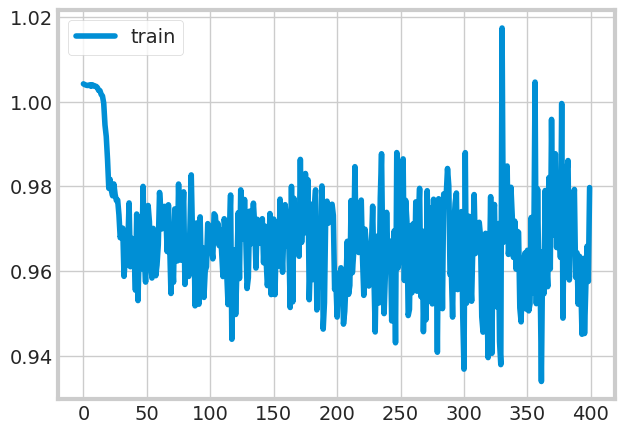

2/2 [==============================] - 2s 9ms/step


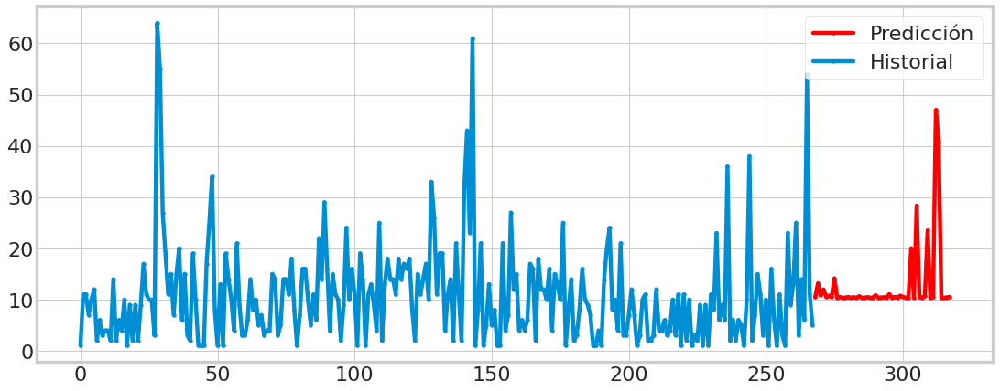

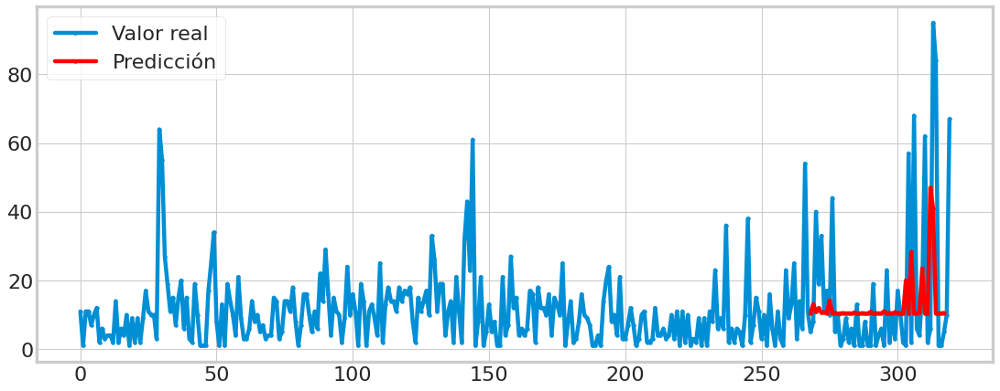

[[-0.02286123]
 [ 0.253933  ]
 [ 0.01410108]
 [ 0.13107657]
 [-0.0154101 ]
 [ 0.00510197]
 [-0.01806847]
 [ 0.35832018]
 [-0.02890846]
 [-0.01806847]
 [-0.03522984]
 [-0.03229091]
 [-0.02054815]
 [-0.0338122 ]
 [-0.02703142]
 [-0.03522984]
 [-0.00950414]
 [-0.03522984]
 [-0.03522984]
 [-0.02286123]
 [-0.03522984]
 [-0.03522984]
 [ 0.01410108]
 [-0.03522984]
 [-0.03065887]
 [-0.02703142]
 [-0.03522984]
 [ 0.03644259]
 [-0.0338122 ]
 [-0.01806847]
 [-0.0322909 ]
 [ 0.00510197]
 [-0.01806847]
 [-0.0338122 ]
 [-0.03522984]
 [ 0.9673099 ]
 [-0.0338122 ]
 [ 1.8324201 ]
 [-0.02703142]
 [-0.03065887]
 [ 0.00510197]
 [ 1.3297215 ]
 [-0.0338122 ]
 [-0.02703142]
 [ 3.772179  ]
 [ 3.1380768 ]
 [-0.03522984]
 [-0.03522984]
 [-0.02890846]
 [-0.01806847]]
50
RMSE:  23.276856527457284
MAPE:  389.8615358972495


In [466]:
df=dataframe[dataframe['subarticle_id'] == 822]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()
df_result_total = pd.DataFrame()
timestep = 1
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 51, 1, 0.2, 'adam', 'mean_squared_error', 400, 50, False,50,5)

In [467]:
df_result=df.getdf_resultado()

In [468]:
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-04-03,40.0,10.490055
1,2023-04-04,19.0,13.153507
2,2023-04-10,33.0,10.845725
3,2023-04-11,11.0,11.971321
4,2023-04-13,17.0,10.561753
5,2023-04-17,10.0,10.759130
6,2023-04-18,44.0,10.536174
7,2023-04-24,5.0,14.157973
8,2023-04-25,10.0,10.431866
9,2023-04-26,1.0,10.536174


# SUB-ART 1 :PAPEL BOND TAMAÑO CARTA DE 75 GR (PAQUETE DE 500 HOJAS) (ARIMA)

In [469]:
df=dataframe[dataframe['subarticle_id'] == 822]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]

In [470]:
df = datasetIngestadoArima(df)

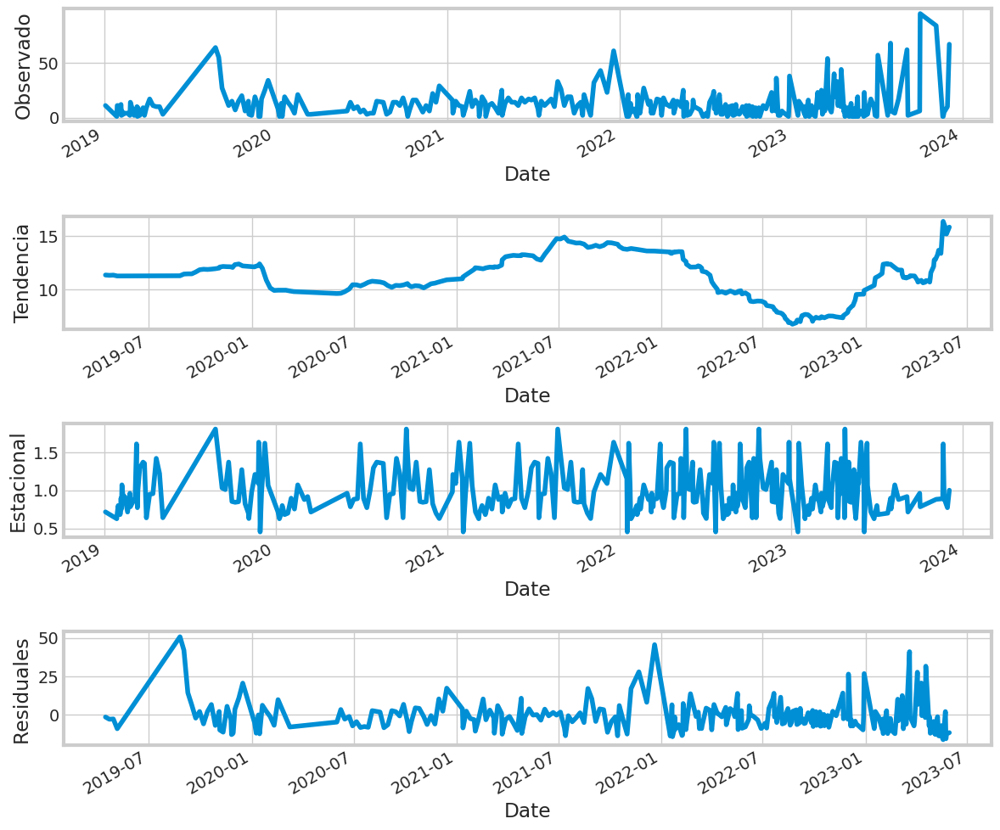

In [471]:
df.seasonal_decompose_plot(50)

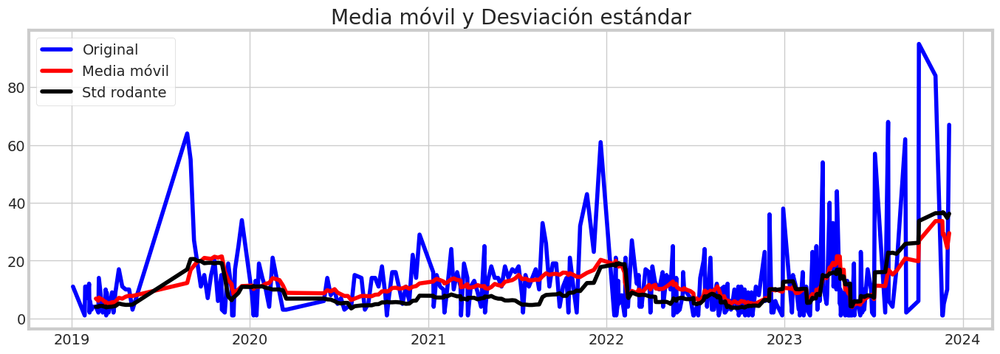

Results of Dickey-Fuller Test:
Test Statistic                  -4.459377
p-value                          0.000233
#Lags Used                       5.000000
Number of Observations Used    314.000000
Critical Value (1%)             -3.451349
Critical Value (5%)             -2.870789
Critical Value (10%)            -2.571698
dtype: float64


In [472]:
df.test_stationarity(0)

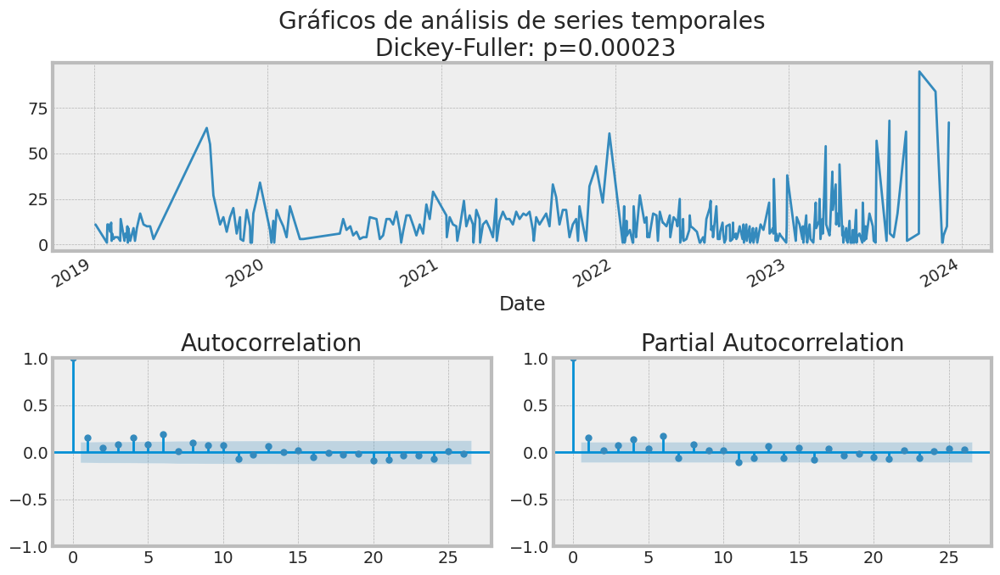

In [473]:
df.tsplot(0)

In [474]:
df.fit_arima((3,0,3))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  320
Model:                 ARIMA(3, 0, 3)   Log Likelihood               -1256.160
Date:                Wed, 14 Feb 2024   AIC                           2528.319
Time:                        21:41:11   BIC                           2558.466
Sample:                             0   HQIC                          2540.357
                                - 320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.8668      2.398      4.949      0.000       7.167      16.566
ar.L1         -0.7086      0.144     -4.928      0.000      -0.990      -0.427
ar.L2          0.7812      0.137      5.698      0.0

predicted = 9.818709, expected = 40.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 13.563841, expected = 19.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 15.627460, expected = 33.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 12.644253, expected = 11.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 18.968361, expected = 17.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.256530, expected = 10.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 17.982386, expected = 44.000000
predicted = 12.994136, expected = 5.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 14.361279, expected = 10.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 8.873548, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 13.077510, expected = 3.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 10.493355, expected = 9.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.050354, expected = 2.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 8.892208, expected = 6.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.940106, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 6.814428, expected = 13.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 10.222368, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 8.505728, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 7.549654, expected = 8.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.106633, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 7.276044, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 7.833211, expected = 19.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.276444, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 8.256112, expected = 4.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.731259, expected = 6.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 7.130928, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 8.443163, expected = 23.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 11.446979, expected = 2.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 7.339594, expected = 10.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 11.880745, expected = 3.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 7.578844, expected = 17.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 10.834312, expected = 10.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 10.800149, expected = 2.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 8.564098, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.653928, expected = 57.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 15.586910, expected = 2.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 10.186667, expected = 68.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 16.622011, expected = 6.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 18.342170, expected = 4.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 14.159988, expected = 17.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 10.334022, expected = 62.000000
predicted = 13.214150, expected = 2.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 25.252661, expected = 6.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 9.178844, expected = 95.000000
predicted = 14.511157, expected = 84.000000
predicted = 27.057695, expected = 1.000000
predicted = 29.459649, expected = 1.000000
predicted = 13.901652, expected = 5.000000
predicted = 19.027627, expected = 10.000000
predicted = 13.240715, expected = 67.000000


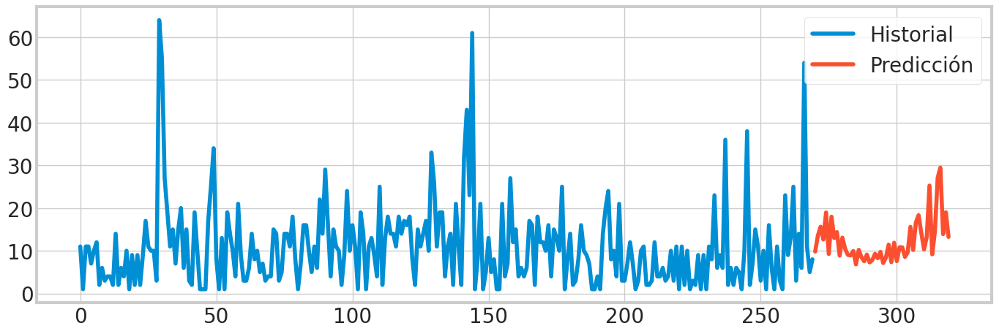

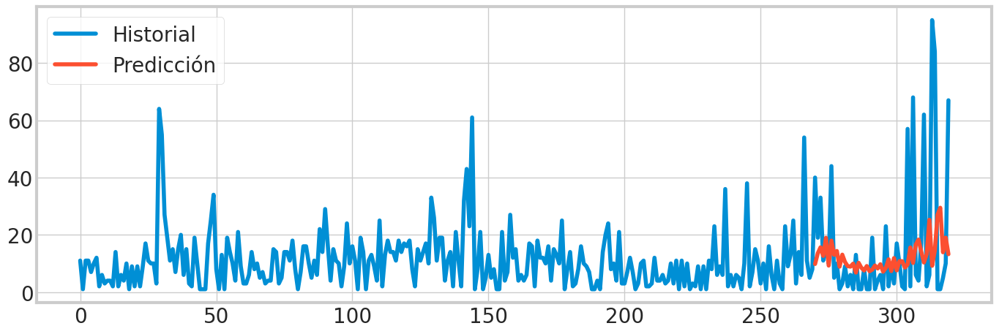

In [475]:
predictions=df.predict_arima((3,0,3), 50)

In [476]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 822
df_result_total = df_result_total.append(df_result)

<ipython-input-476-a03ef3cdd486>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 1

In [477]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-04-03,40.0,10.490055,9.818709,822
1,2023-04-04,19.0,13.153507,13.563841,822
2,2023-04-10,33.0,10.845725,15.627460,822
3,2023-04-11,11.0,11.971321,12.644253,822
4,2023-04-13,17.0,10.561753,18.968361,822
5,2023-04-17,10.0,10.759130,9.256530,822
6,2023-04-18,44.0,10.536174,17.982386,822
7,2023-04-24,5.0,14.157973,12.994136,822
8,2023-04-25,10.0,10.431866,14.361279,822
9,2023-04-26,1.0,10.536174,8.873548,822


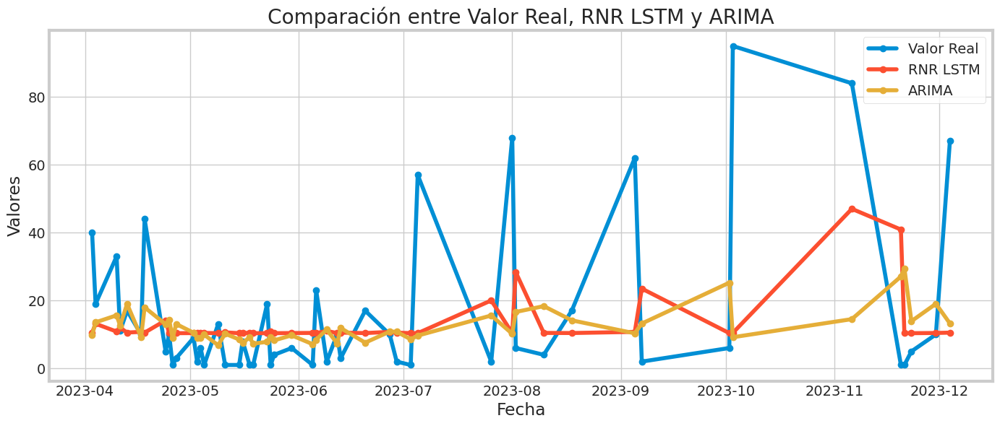

MAE (RNR LSTM): 15.073915786743164
MSE (RNR LSTM): 541.8120497998307
RMSE (RNR LSTM): 23.276856527457284
MAE (ARIMA): 15.554365855121361
MSE (ARIMA): 589.3349706332461
RMSE (ARIMA): 24.276222330363638


In [478]:
graficar_comparacion(df_result)

# SUB-ART 2 :PEGAMENTO EN BARRA (RNR LSTM)

In [479]:
df=dataframe[dataframe['subarticle_id'] == 992]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_80 (LSTM)              (None, 1, 100)            40800     
                                                                 
 dropout_80 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_81 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_81 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_82 (LSTM)              (None, 100)               80400     
                                                                 
 dropout_82 (Dropout)        (None, 100)               0         
                                                                 
 dense_22 (Dense)            (None, 1)               

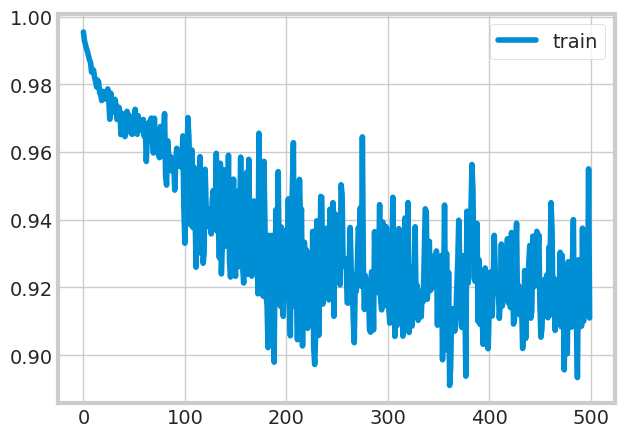

1/1 [==============================] - 2s 2s/step


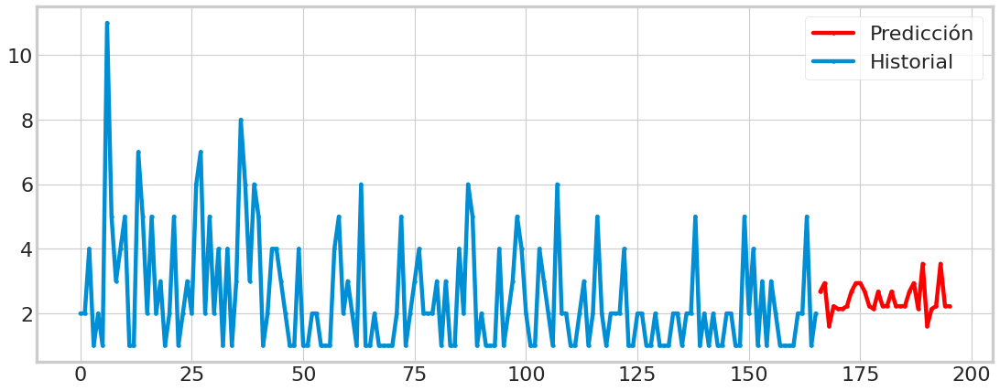

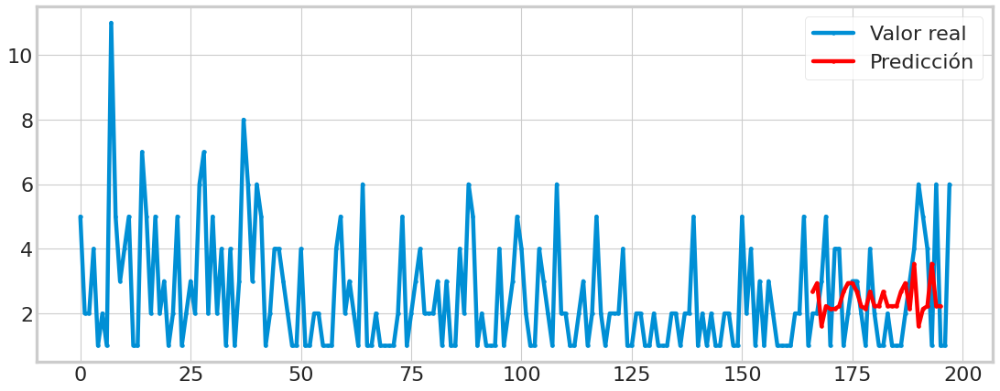

[[ 0.1060507 ]
 [ 0.2590358 ]
 [-0.50756305]
 [-0.15278801]
 [-0.2030822 ]
 [-0.2030822 ]
 [-0.15278801]
 [ 0.1060507 ]
 [ 0.2590358 ]
 [ 0.2590358 ]
 [ 0.1060507 ]
 [-0.15278801]
 [-0.2030822 ]
 [ 0.1060507 ]
 [-0.15278801]
 [-0.15278801]
 [ 0.1060507 ]
 [-0.15278801]
 [-0.15278801]
 [-0.15278801]
 [ 0.1060507 ]
 [ 0.2590358 ]
 [-0.2030822 ]
 [ 0.60418844]
 [-0.50756305]
 [-0.2030822 ]
 [-0.15278801]
 [ 0.60418844]
 [-0.15278801]
 [-0.15278801]]
30
RMSE:  1.7471341735268118
MAPE:  71.3362371722857


In [480]:
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 31, 1, 0.2, 'adam', 'mean_squared_error', 500, 40, False,100,3)

In [481]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-01-31,3.0,2.674838
1,2023-02-07,5.0,2.940011
2,2023-02-14,1.0,1.611247
3,2023-02-27,4.0,2.226187
4,2023-03-06,4.0,2.139011
5,2023-03-07,1.0,2.139011
6,2023-03-13,2.0,2.226187
7,2023-04-03,3.0,2.674838
8,2023-04-04,3.0,2.940011
9,2023-04-10,2.0,2.940011


# SUB-ART 2 :PEGAMENTO EN BARRA (ARIMA)

In [482]:
df=dataframe[dataframe['subarticle_id'] == 992]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

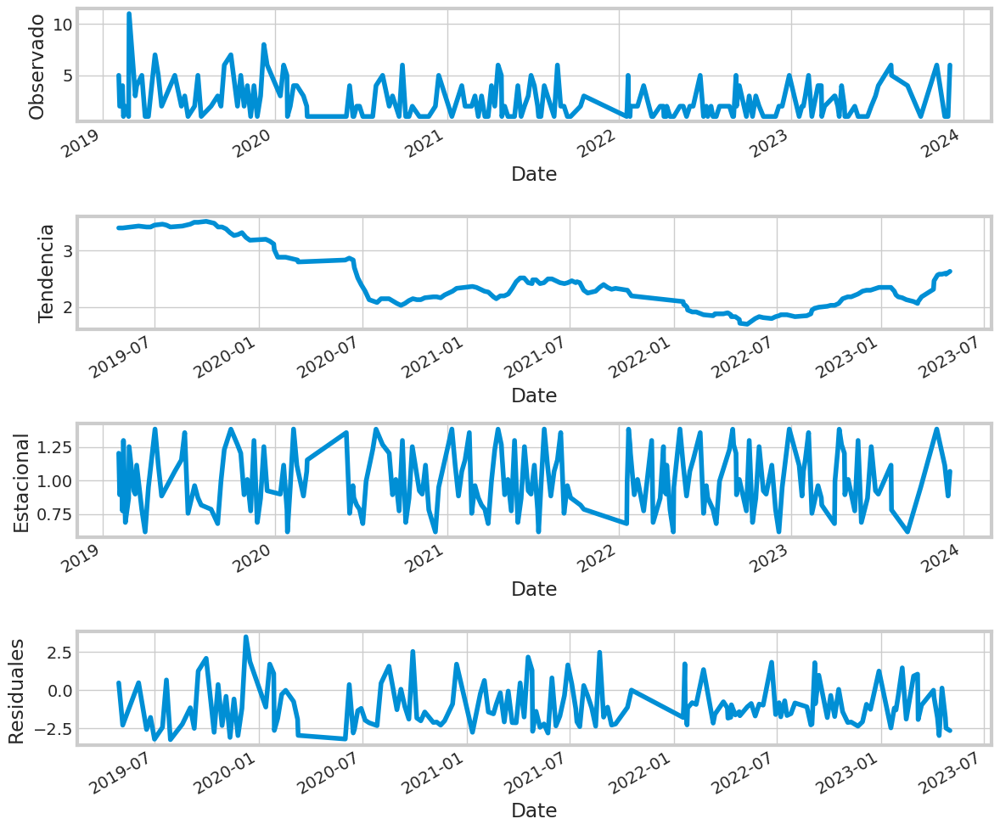

In [483]:
df.seasonal_decompose_plot(30)

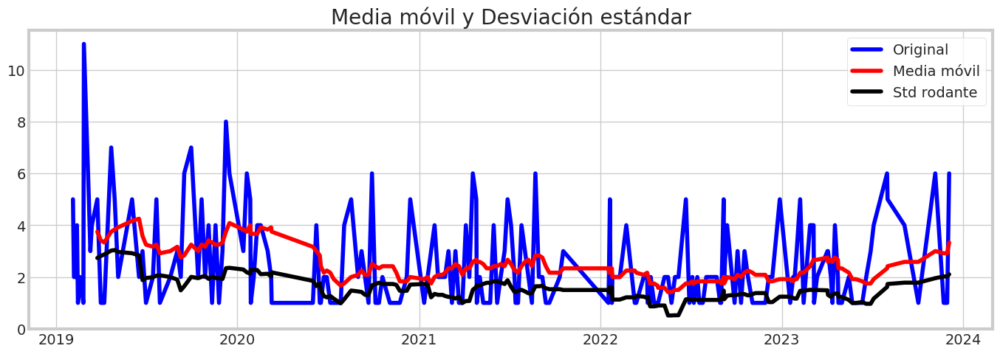

Results of Dickey-Fuller Test:
Test Statistic                -6.542260e+00
p-value                        9.283586e-09
#Lags Used                     2.000000e+00
Number of Observations Used    1.950000e+02
Critical Value (1%)           -3.464337e+00
Critical Value (5%)           -2.876479e+00
Critical Value (10%)          -2.574733e+00
dtype: float64


In [484]:
df.test_stationarity(0)

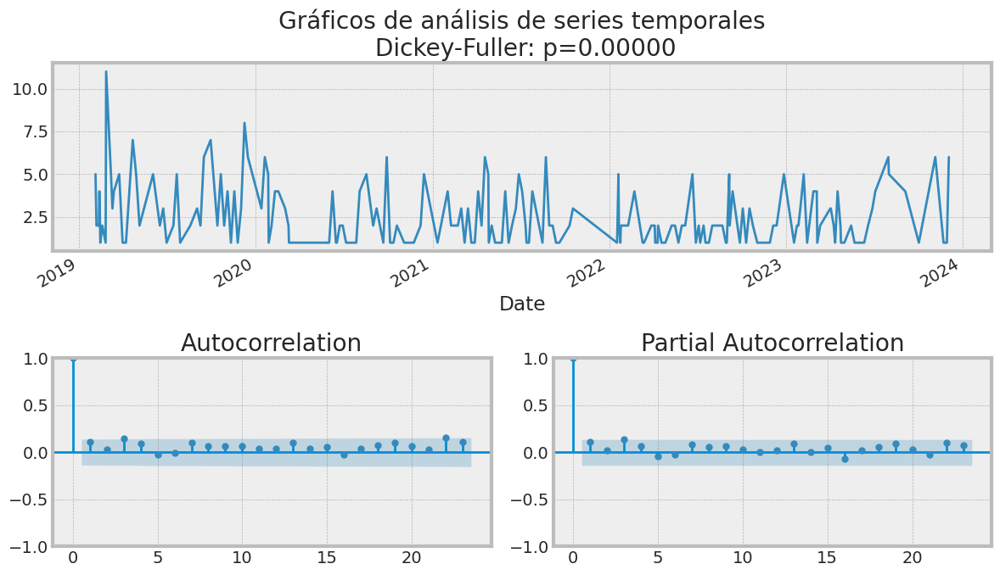

In [485]:
df.tsplot(0)

In [486]:
df.fit_arima((1,0,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  198
Model:                 ARIMA(1, 0, 2)   Log Likelihood                -385.201
Date:                Wed, 14 Feb 2024   AIC                            780.402
Time:                        21:43:11   BIC                            796.843
Sample:                             0   HQIC                           787.057
                                - 198                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.6382      0.401      6.580      0.000       1.852       3.424
ar.L1          0.9754      0.034     28.683      0.000       0.909       1.042
ma.L1         -0.8873      0.085    -10.481      0.0

predicted = 2.125539, expected = 3.000000
predicted = 2.217320, expected = 5.000000
predicted = 2.467168, expected = 1.000000
predicted = 2.221599, expected = 4.000000
predicted = 2.424846, expected = 4.000000
predicted = 2.524285, expected = 1.000000
predicted = 2.344237, expected = 2.000000
predicted = 2.361958, expected = 3.000000
predicted = 2.430516, expected = 3.000000
predicted = 2.464045, expected = 2.000000
predicted = 2.410999, expected = 1.000000
predicted = 2.307291, expected = 4.000000
predicted = 2.490248, expected = 2.000000
predicted = 2.412337, expected = 1.000000
predicted = 2.316547, expected = 1.000000
predicted = 2.251373, expected = 2.000000
predicted = 2.277361, expected = 1.000000
predicted = 2.185296, expected = 1.000000
predicted = 2.132105, expected = 1.000000
predicted = 2.080290, expected = 2.000000
predicted = 2.122622, expected = 3.000000
predicted = 2.211075, expected = 4.000000
predicted = 2.350066, expected = 6.000000
predicted = 2.667761, expected = 5

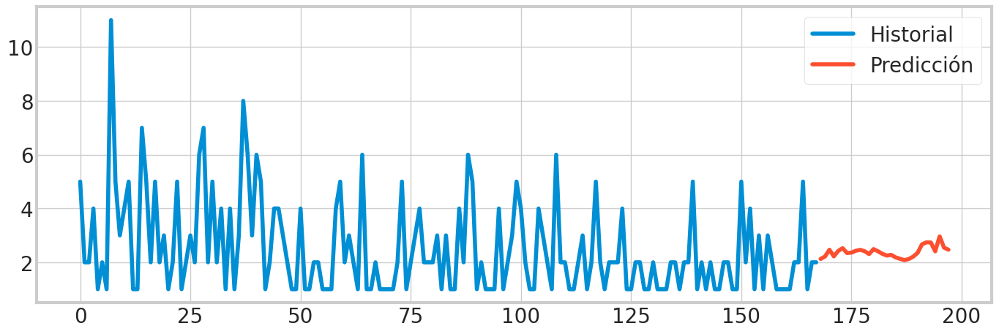

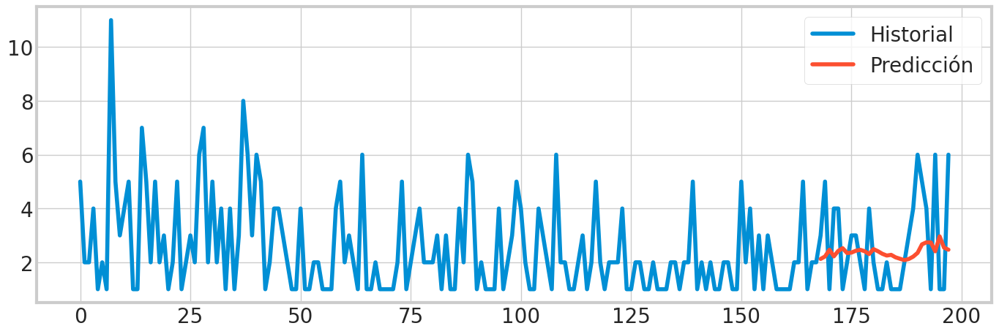

In [487]:
predictions=df.predict_arima((1,0,2), 30)

In [488]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 992
df_result_total = df_result_total.append(df_result)

<ipython-input-488-d5b10fad06f9>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 2

In [489]:
df_result.head(30)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-01-31,3.0,2.674838,2.125539,992
1,2023-02-07,5.0,2.940011,2.217320,992
2,2023-02-14,1.0,1.611247,2.467168,992
3,2023-02-27,4.0,2.226187,2.221599,992
4,2023-03-06,4.0,2.139011,2.424846,992
5,2023-03-07,1.0,2.139011,2.524285,992
6,2023-03-13,2.0,2.226187,2.344237,992
7,2023-04-03,3.0,2.674838,2.361958,992
8,2023-04-04,3.0,2.940011,2.430516,992
9,2023-04-10,2.0,2.940011,2.464045,992


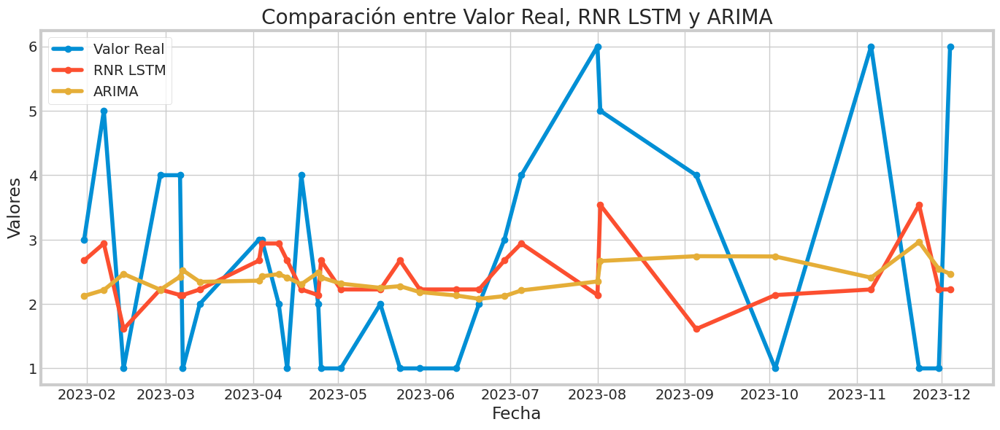

MAE (RNR LSTM): 1.3979183435440063
MSE (RNR LSTM): 3.0524778203052154
RMSE (RNR LSTM): 1.7471341735268118
MAE (ARIMA): 1.4847680498031297
MSE (ARIMA): 3.0616369203016407
RMSE (ARIMA): 1.749753388424106


In [490]:
graficar_comparacion(df_result)

# SUB-ART 3 :MICROPUNTA PUNTA FINA COLOR AZUL No 0,5 (RNR LSTM)

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_83 (LSTM)              (None, 1, 100)            40800     
                                                                 
 dropout_83 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_84 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_84 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_85 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_85 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_86 (LSTM)              (None, 1, 100)          

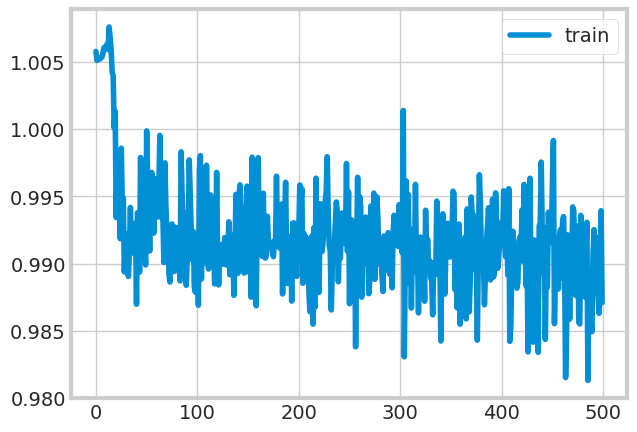

1/1 [==============================] - 2s 2s/step


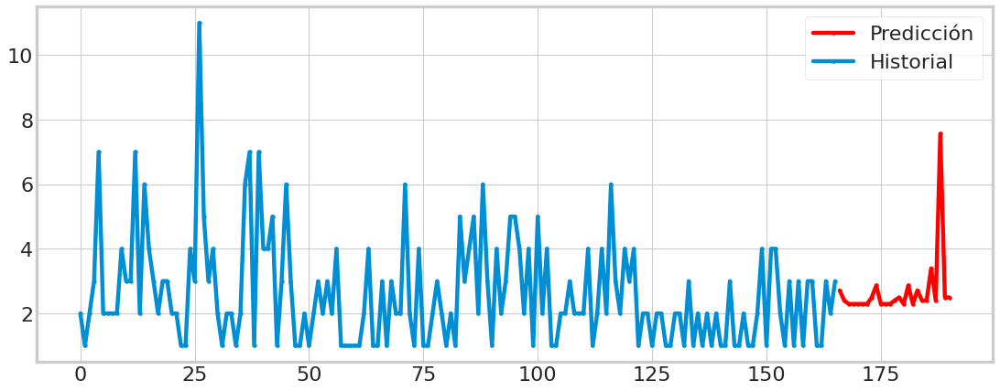

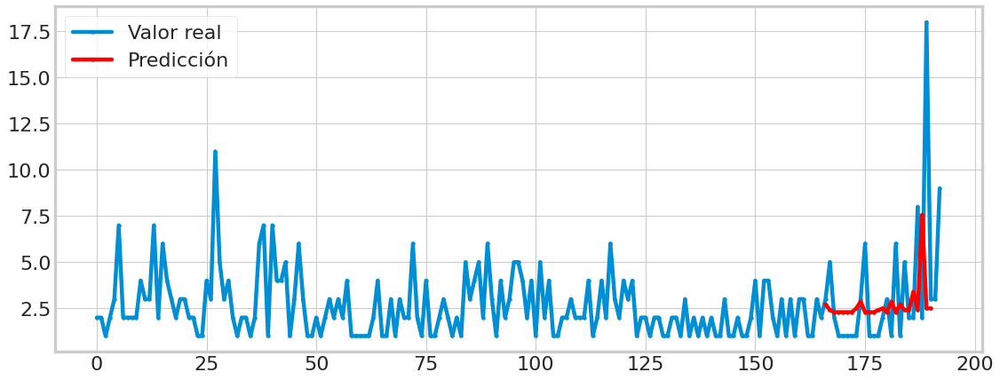

[[ 0.08116764]
 [-0.11112114]
 [-0.17669287]
 [-0.17669287]
 [-0.17669287]
 [-0.17669287]
 [-0.17669287]
 [-0.05154186]
 [ 0.17509508]
 [-0.17669287]
 [-0.17669287]
 [-0.17669287]
 [-0.11112114]
 [-0.05154186]
 [-0.17669287]
 [ 0.17509508]
 [-0.17669287]
 [ 0.08116764]
 [-0.11112114]
 [-0.11112114]
 [ 0.49940938]
 [-0.11112114]
 [ 3.0557263 ]
 [-0.05154186]
 [-0.05154186]]
25
RMSE:  3.983743499707014
MAPE:  89.20142752594418


In [491]:
df=dataframe[dataframe['subarticle_id'] == 984]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df = datasetIngestadoRnrLstm(df)
rmse_3, mape_3 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error', 500, 80, False,100,5)

In [492]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-03-06,2.0,2.713284
1,2023-03-07,1.0,2.399516
2,2023-03-28,1.0,2.292519
3,2023-04-04,1.0,2.292519
4,2023-04-10,1.0,2.292519
5,2023-04-11,1.0,2.292519
6,2023-04-13,3.0,2.292519
7,2023-04-18,6.0,2.496735
8,2023-04-19,1.0,2.866551
9,2023-04-25,1.0,2.292519


# SUB-ART 3 :MICROPUNTA PUNTA FINA COLOR AZUL No 0,5 (ARIMA)

In [493]:
df=dataframe[dataframe['subarticle_id'] == 984]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

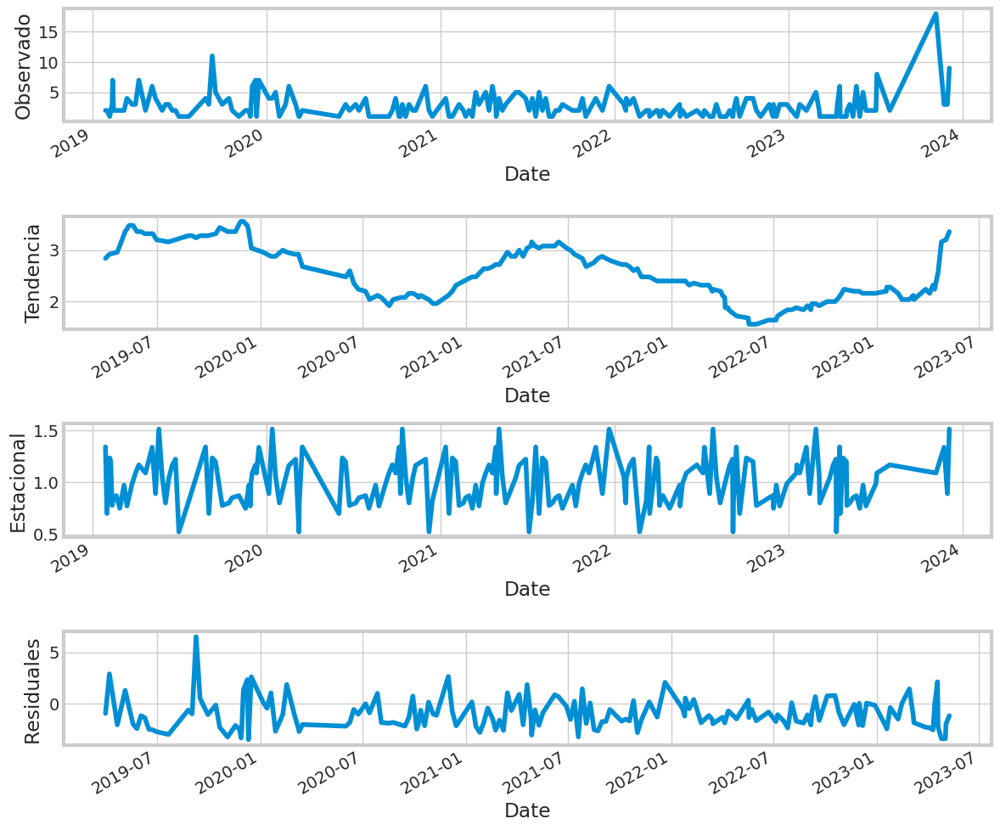

In [494]:
df.seasonal_decompose_plot(25)

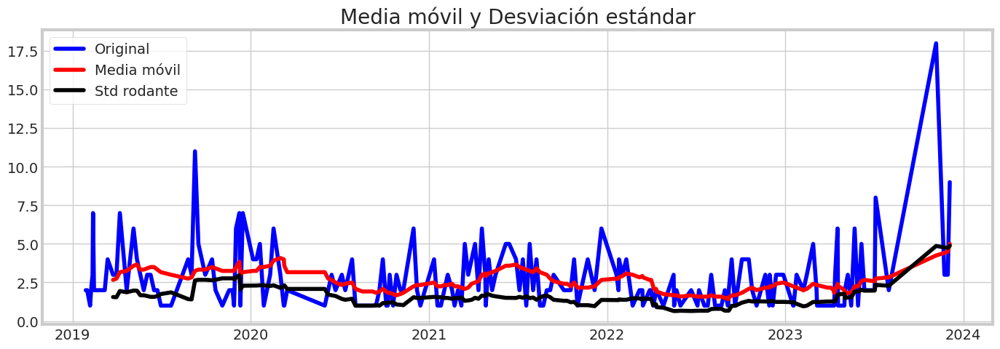

Results of Dickey-Fuller Test:
Test Statistic                  -3.239940
p-value                          0.017786
#Lags Used                       6.000000
Number of Observations Used    186.000000
Critical Value (1%)             -3.466005
Critical Value (5%)             -2.877208
Critical Value (10%)            -2.575122
dtype: float64


In [495]:
df.test_stationarity(0)

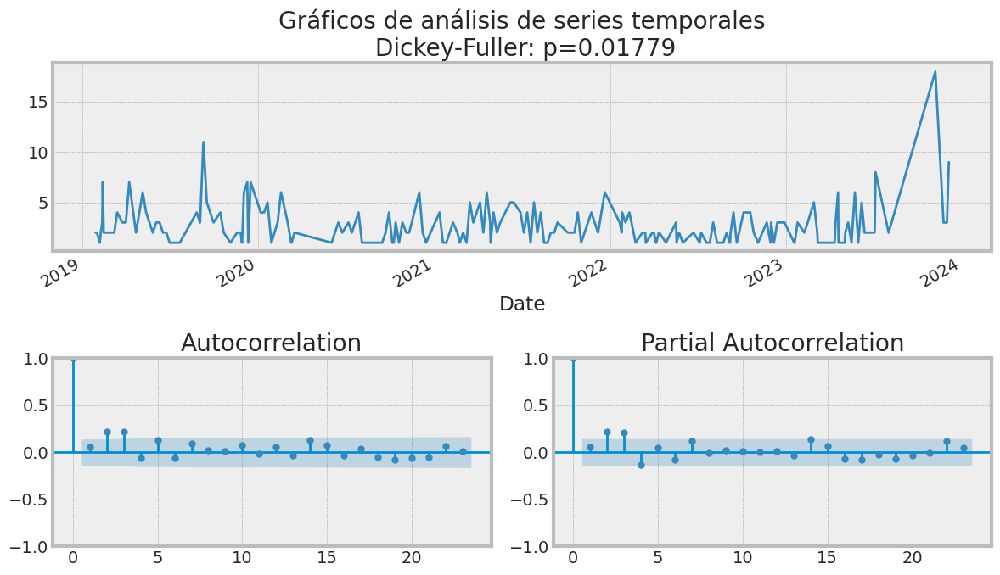

In [496]:
df.tsplot(0)

In [497]:
df.fit_arima((2,0,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  193
Model:                 ARIMA(2, 0, 2)   Log Likelihood                -404.147
Date:                Wed, 14 Feb 2024   AIC                            820.295
Time:                        21:44:20   BIC                            839.871
Sample:                             0   HQIC                           828.222
                                - 193                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.6932      0.278      9.676      0.000       2.148       3.239
ar.L1          0.5268      0.331      1.592      0.111      -0.122       1.175
ar.L2         -0.1826      0.292     -0.625      0.5

predicted = 2.975862, expected = 2.000000
predicted = 3.109160, expected = 1.000000
predicted = 2.541091, expected = 1.000000
predicted = 1.951691, expected = 1.000000
predicted = 1.833451, expected = 1.000000
predicted = 1.987361, expected = 1.000000
predicted = 2.121950, expected = 3.000000
predicted = 2.387486, expected = 6.000000
predicted = 3.363859, expected = 1.000000
predicted = 3.241579, expected = 1.000000
predicted = 2.458433, expected = 1.000000
predicted = 1.716451, expected = 2.000000
predicted = 1.727777, expected = 3.000000
predicted = 2.434995, expected = 1.000000
predicted = 2.682081, expected = 6.000000
predicted = 3.313355, expected = 1.000000
predicted = 2.936657, expected = 5.000000
predicted = 2.652988, expected = 2.000000
predicted = 2.751799, expected = 2.000000
predicted = 2.491876, expected = 8.000000
predicted = 2.671966, expected = 2.000000
predicted = 3.539688, expected = 18.000000
predicted = 3.567544, expected = 3.000000
predicted = 7.323354, expected = 

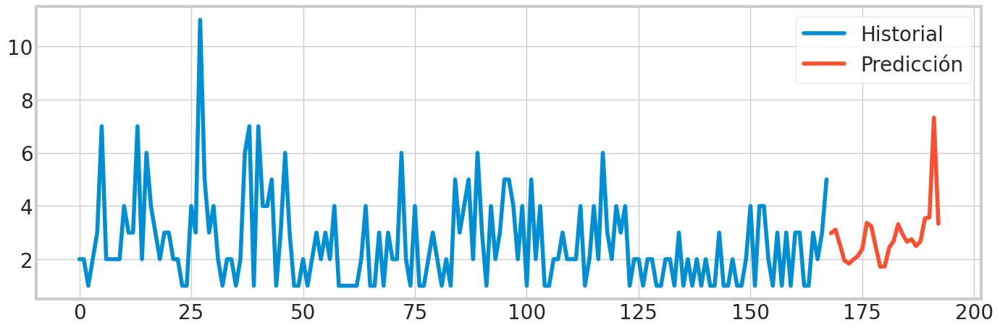

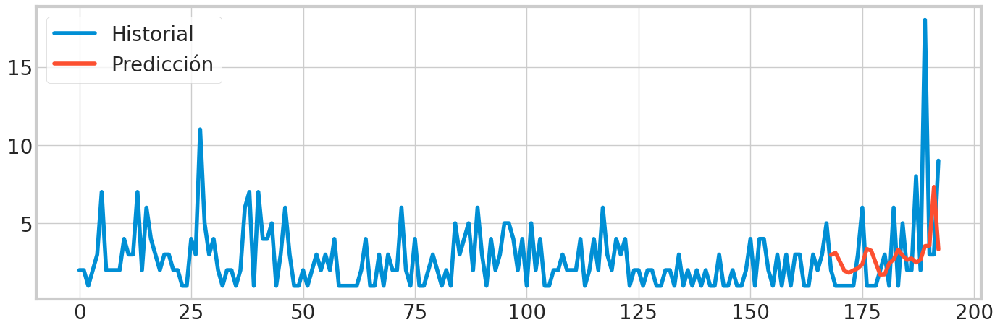

In [498]:
predictions=df.predict_arima((2,0,2), 25)

In [499]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 984
df_result_total = df_result_total.append(df_result)

<ipython-input-499-0fca603fe485>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 3



In [500]:
df_result.head(25)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-03-06,2.0,2.713284,2.975862,984
1,2023-03-07,1.0,2.399516,3.109160,984
2,2023-03-28,1.0,2.292519,2.541091,984
3,2023-04-04,1.0,2.292519,1.951691,984
4,2023-04-10,1.0,2.292519,1.833451,984
5,2023-04-11,1.0,2.292519,1.987361,984
6,2023-04-13,3.0,2.292519,2.121950,984
7,2023-04-18,6.0,2.496735,2.387486,984
8,2023-04-19,1.0,2.866551,3.363859,984
9,2023-04-25,1.0,2.292519,3.241579,984


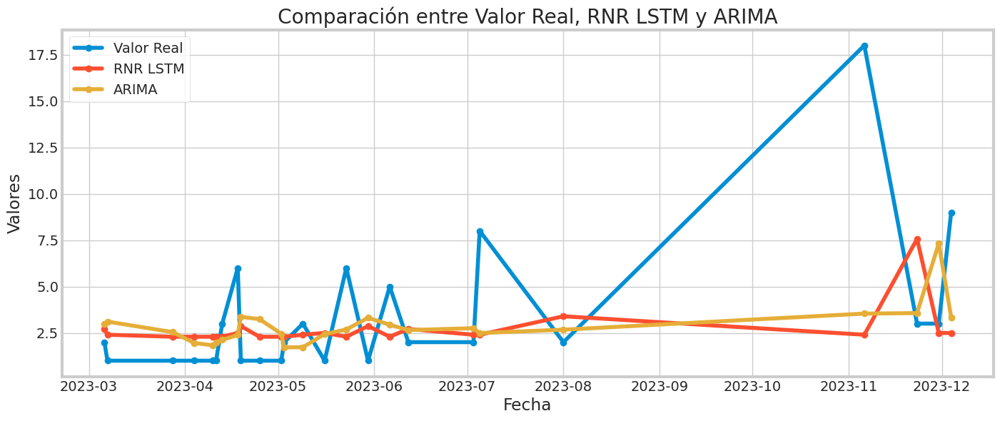

MAE (RNR LSTM): 2.4759819316864013
MSE (RNR LSTM): 15.870212271457888
RMSE (RNR LSTM): 3.983743499707014
MAE (ARIMA): 2.4496358633023667
MSE (ARIMA): 14.13168150020565
RMSE (ARIMA): 3.7592128830655027


In [501]:
graficar_comparacion(df_result)

# SUB-ART 4 :CORRECTOR EN CINTA 932 (RNR LSTM)


Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_88 (LSTM)              (None, 1, 100)            40800     
                                                                 
 dropout_88 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_89 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_89 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_90 (LSTM)              (None, 100)               80400     
                                                                 
 dropout_90 (Dropout)        (None, 100)               0         
                                                                 
 dense_24 (Dense)            (None, 1)               

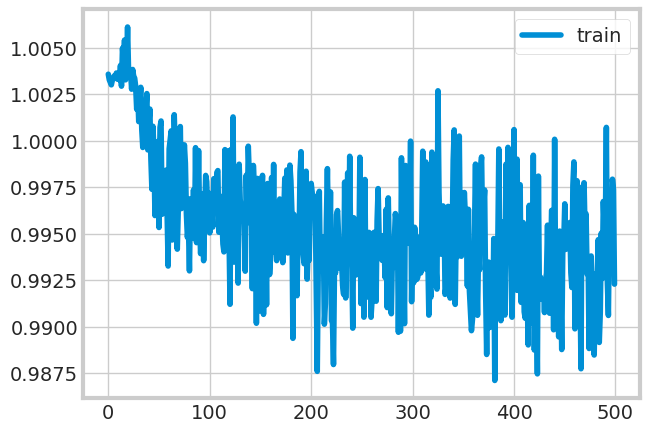

1/1 [==============================] - 1s 1s/step


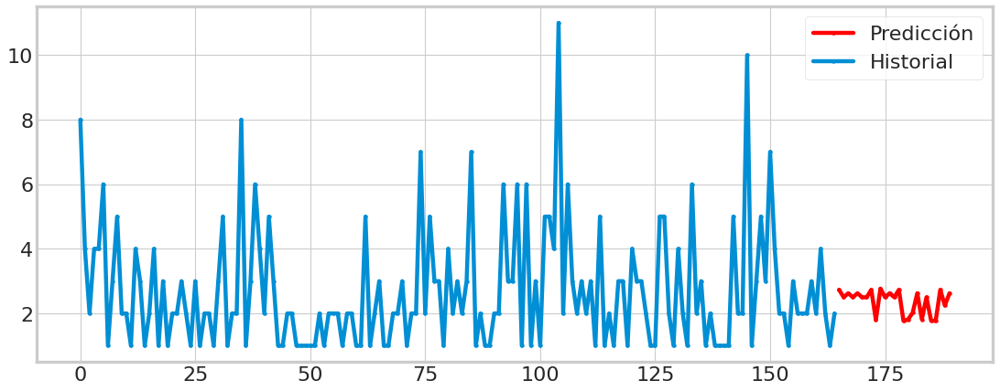

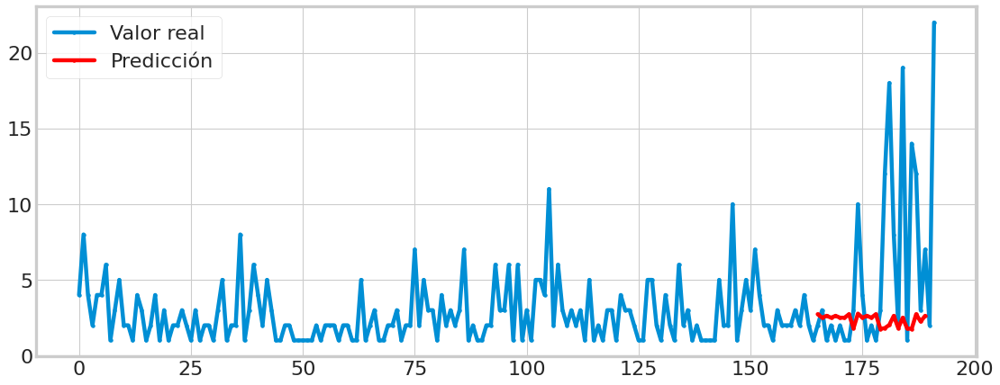

[[ 0.02131712]
 [-0.104536  ]
 [-0.03650299]
 [-0.104536  ]
 [-0.03650299]
 [-0.104536  ]
 [-0.104536  ]
 [ 0.02131712]
 [-0.48513728]
 [ 0.0419271 ]
 [-0.104536  ]
 [-0.03650299]
 [-0.104536  ]
 [ 0.02131712]
 [-0.503615  ]
 [-0.4786712 ]
 [-0.36446652]
 [-0.03650299]
 [-0.47615734]
 [-0.104536  ]
 [-0.49547774]
 [-0.503615  ]
 [ 0.02131712]
 [-0.24378681]
 [-0.03650299]]
25
RMSE:  7.385196411028741
MAPE:  80.2970149318323


In [502]:
df=dataframe[dataframe['subarticle_id'] == 932]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df.to_csv('dfsub4.csv', index=False)
df = datasetIngestadoRnrLstm(df)
rmse_4, mape_4 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error',500, 40, False,100,3)

In [503]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-04-03,1.0,2.731971
1,2023-04-04,2.0,2.500541
2,2023-04-10,1.0,2.625646
3,2023-04-18,2.0,2.500541
4,2023-04-24,1.0,2.625646
5,2023-05-02,1.0,2.500541
6,2023-05-09,3.0,2.500541
7,2023-05-16,10.0,2.731971
8,2023-05-23,4.0,1.800657
9,2023-05-30,1.0,2.769870


# SUB-ART 4 :CORRECTOR EN CINTA 932 (ARIMA)


In [504]:
df=dataframe[dataframe['subarticle_id'] == 932]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]

df = datasetIngestadoArima(df)

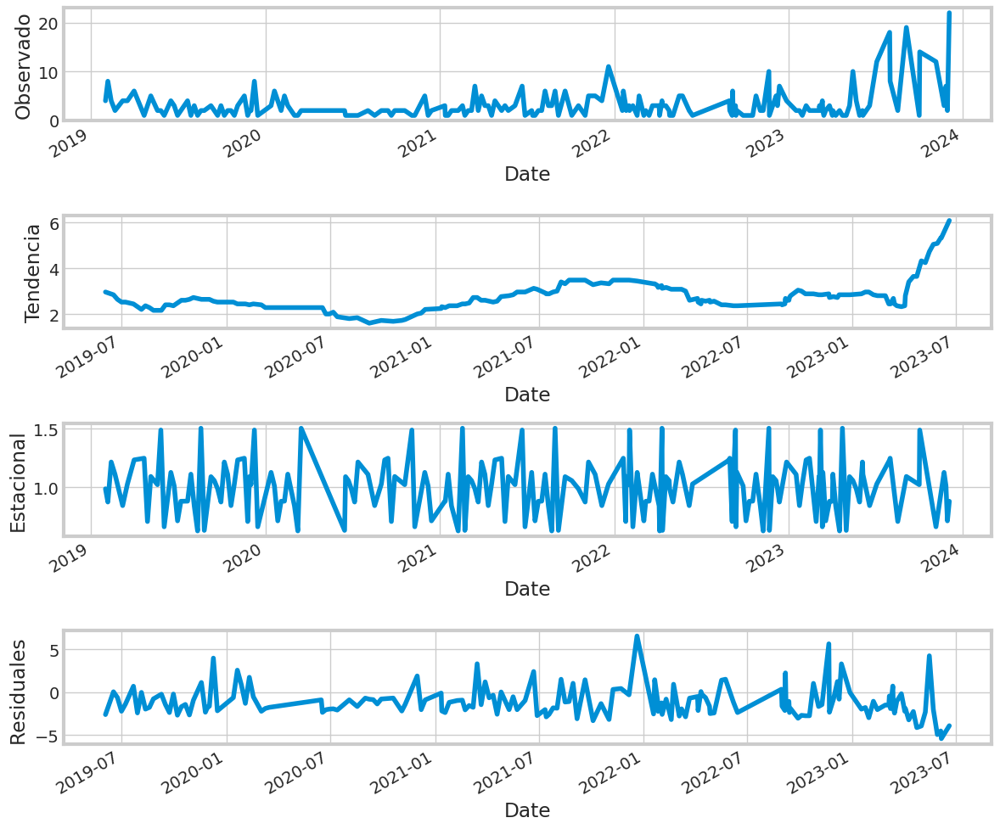

In [505]:
df.seasonal_decompose_plot(25)

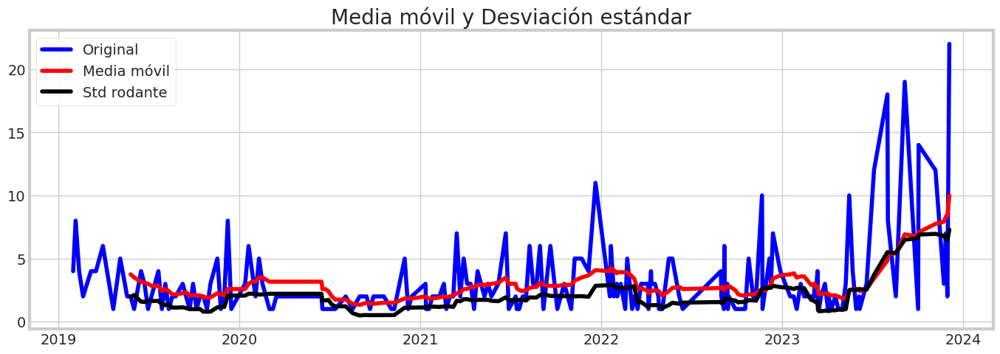

Results of Dickey-Fuller Test:
Test Statistic                  -1.526192
p-value                          0.520517
#Lags Used                      13.000000
Number of Observations Used    178.000000
Critical Value (1%)             -3.467632
Critical Value (5%)             -2.877918
Critical Value (10%)            -2.575501
dtype: float64


In [506]:
df.test_stationarity(0)

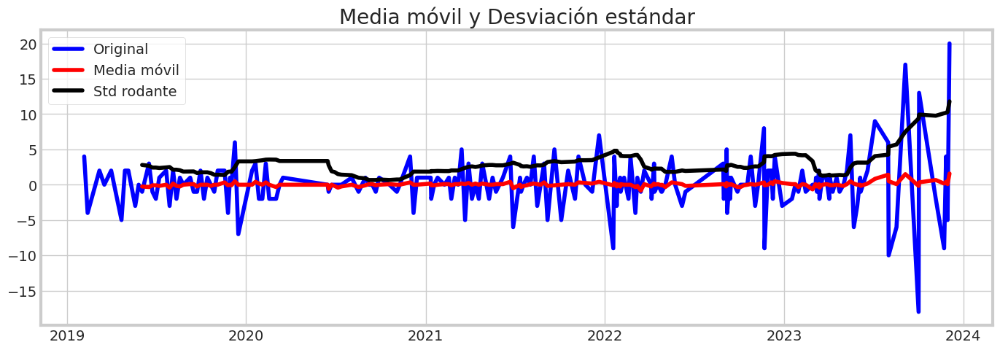

Results of Dickey-Fuller Test:
Test Statistic                -6.557450e+00
p-value                        8.545873e-09
#Lags Used                     8.000000e+00
Number of Observations Used    1.820000e+02
Critical Value (1%)           -3.466800e+00
Critical Value (5%)           -2.877555e+00
Critical Value (10%)          -2.575308e+00
dtype: float64


In [507]:
df.test_stationarity(1)

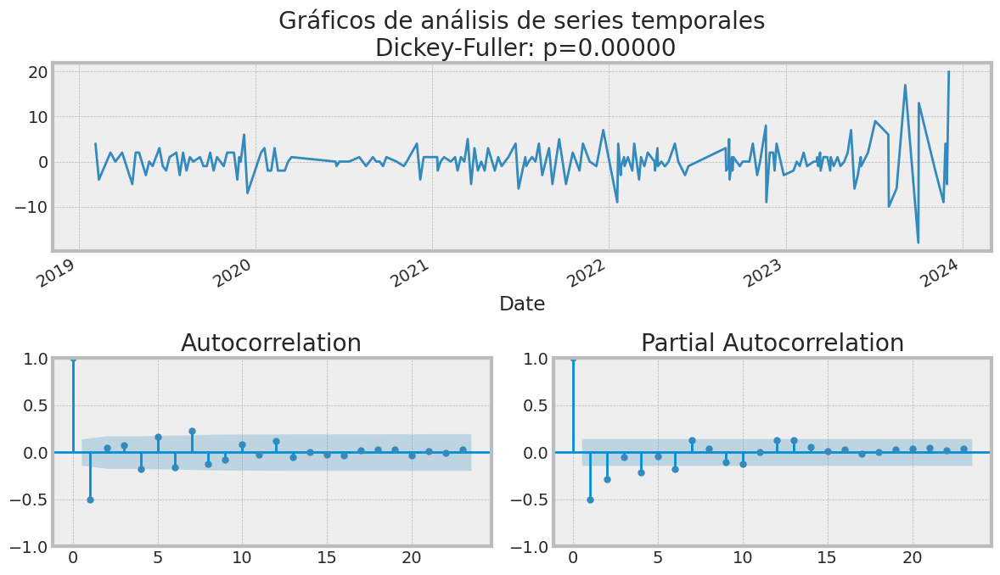

In [508]:
df.tsplot(1)

In [509]:
df.fit_arima((1,1,1))

                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  192
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -469.299
Date:                Wed, 14 Feb 2024   AIC                            944.598
Time:                        21:45:18   BIC                            954.355
Sample:                             0   HQIC                           948.550
                                - 192                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2031      0.044     -4.614      0.000      -0.289      -0.117
ma.L1         -0.7812      0.032    -24.082      0.000      -0.845      -0.718
sigma2         7.9212      0.358     22.107      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


predicted = 2.281184, expected = 1.000000
predicted = 2.391113, expected = 2.000000
predicted = 2.135943, expected = 1.000000
predicted = 2.091808, expected = 2.000000
predicted = 1.889159, expected = 1.000000
predicted = 1.892651, expected = 1.000000
predicted = 1.706623, expected = 3.000000
predicted = 1.600064, expected = 10.000000
predicted = 2.124243, expected = 4.000000
predicted = 2.956242, expected = 1.000000
predicted = 2.842129, expected = 2.000000
predicted = 2.707942, expected = 1.000000
predicted = 2.613692, expected = 3.000000
predicted = 2.570165, expected = 12.000000
predicted = 2.920303, expected = 18.000000
predicted = 7.205104, expected = 8.000000
predicted = 6.445932, expected = 2.000000
predicted = 2.898665, expected = 19.000000
predicted = 8.791964, expected = 1.000000
predicted = 8.192118, expected = 14.000000
predicted = 7.936634, expected = 12.000000
predicted = 9.485329, expected = 3.000000
predicted = 9.266329, expected = 7.000000
predicted = 8.027391, expect

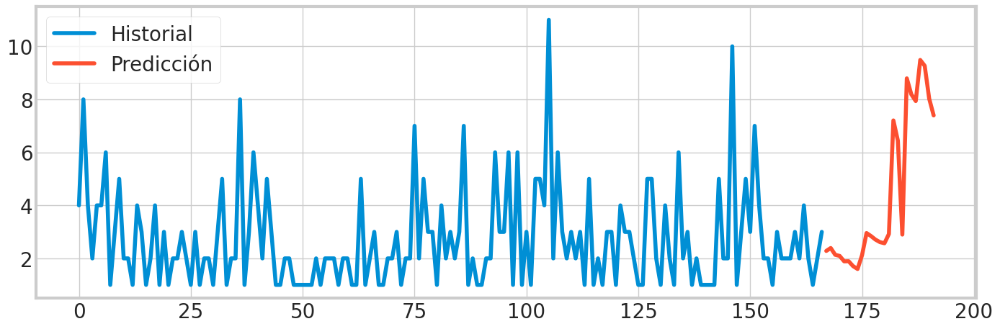

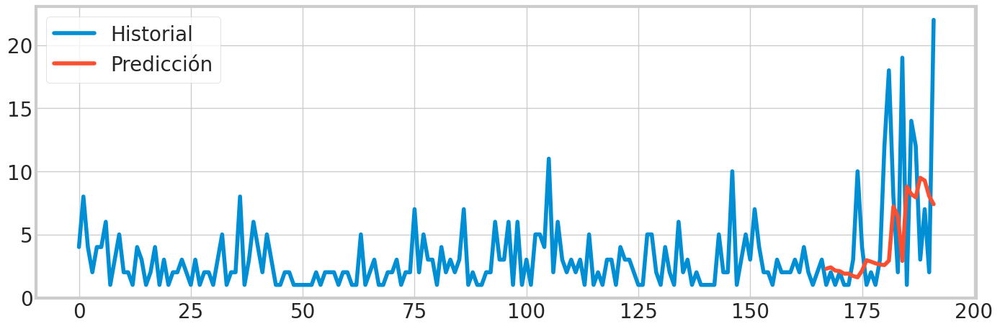

In [510]:
predictions=df.predict_arima((1,1,1), 25)

In [511]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 932
df_result_total = df_result_total.append(df_result)

<ipython-input-511-a50dd98d5c2b>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 4

In [512]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-04-03,1.0,2.731971,2.281184,932
1,2023-04-04,2.0,2.500541,2.391113,932
2,2023-04-10,1.0,2.625646,2.135943,932
3,2023-04-18,2.0,2.500541,2.091808,932
4,2023-04-24,1.0,2.625646,1.889159,932
5,2023-05-02,1.0,2.500541,1.892651,932
6,2023-05-09,3.0,2.500541,1.706623,932
7,2023-05-16,10.0,2.731971,1.600064,932
8,2023-05-23,4.0,1.800657,2.124243,932
9,2023-05-30,1.0,2.769870,2.956242,932


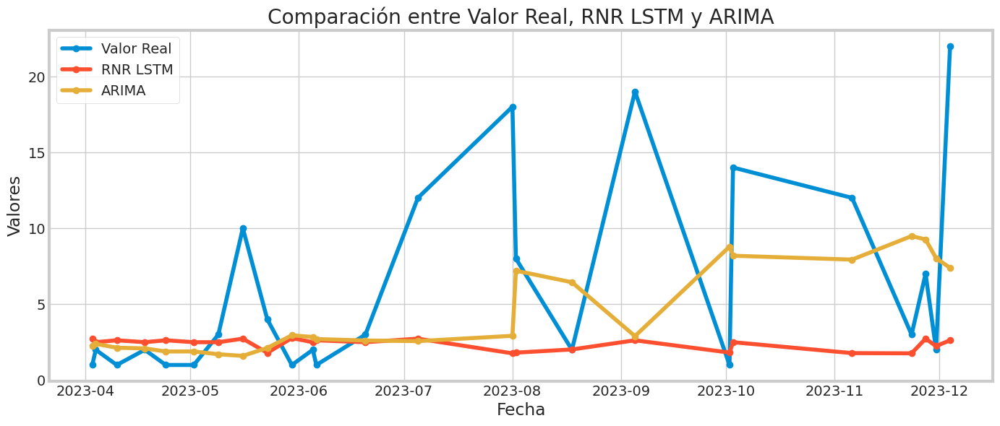

MAE (RNR LSTM): 4.703524513244629
MSE (RNR LSTM): 54.541126029471805
RMSE (RNR LSTM): 7.385196411028741
MAE (ARIMA): 4.5617670785343725
MSE (ARIMA): 43.67362628535745
RMSE (ARIMA): 6.608602445703437


In [513]:
graficar_comparacion(df_result)

# SUB-ART 5 :GRAPAS No 24/6 967 (RNR LSTM)

In [514]:
df=dataframe[dataframe['subarticle_id'] == 967]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_91 (LSTM)              (None, 1, 100)            40800     
                                                                 
 dropout_91 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_92 (LSTM)              (None, 100)               80400     
                                                                 
 dropout_92 (Dropout)        (None, 100)               0         
                                                                 
 dense_25 (Dense)            (None, 1)                 101       
                                                                 
Total params: 121301 (473.83 KB)
Trainable params: 121301 (473.83 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/400
5

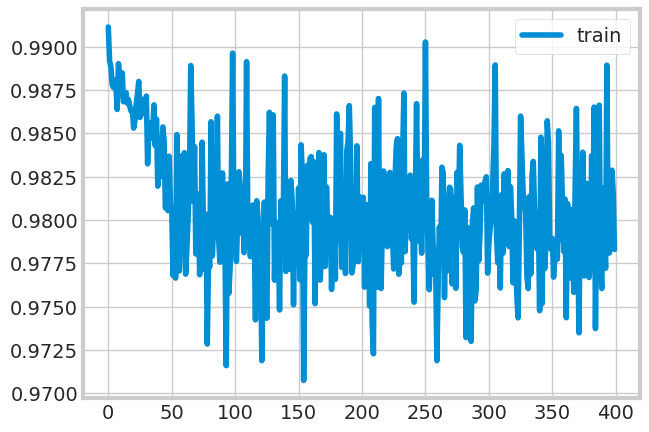

1/1 [==============================] - 1s 819ms/step


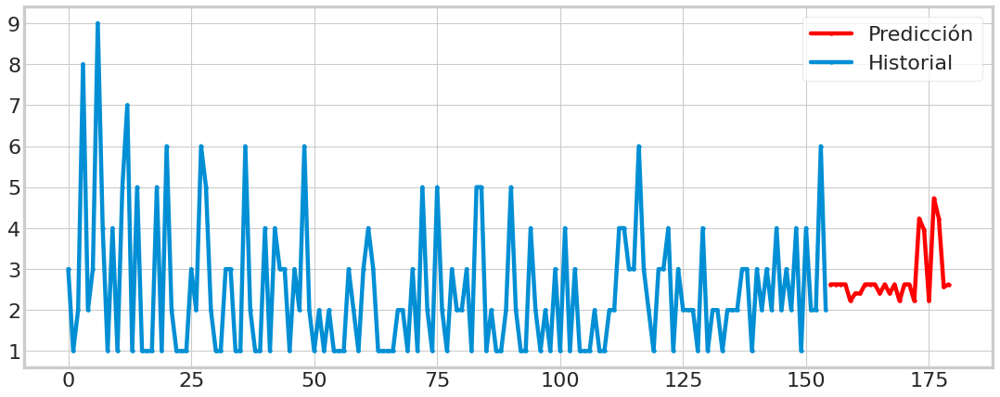

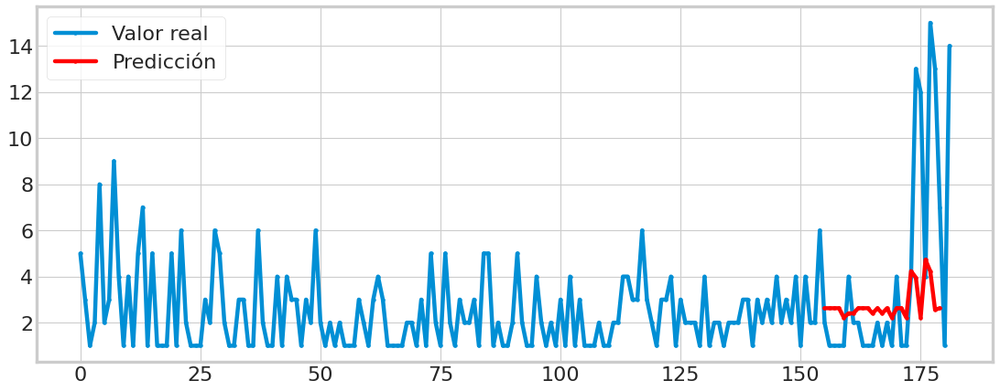

[[ 0.10328944]
 [ 0.10328944]
 [ 0.10328944]
 [ 0.10328944]
 [-0.1480792 ]
 [-0.03613155]
 [-0.03613155]
 [ 0.10328944]
 [ 0.10328944]
 [ 0.10328944]
 [-0.03613155]
 [ 0.10328944]
 [-0.03613155]
 [ 0.10328944]
 [-0.1480792 ]
 [ 0.10328944]
 [ 0.10328944]
 [-0.1480792 ]
 [ 1.1054058 ]
 [ 0.9312188 ]
 [-0.1480792 ]
 [ 1.4139407 ]
 [ 1.1054058 ]
 [ 0.06289451]
 [ 0.10328944]]
25
RMSE:  4.806155240999515
MAPE:  91.6555876943218


In [515]:
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error', 400, 32, False,100,2)

In [516]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-01-18,1.0,2.627093
1,2023-02-07,1.0,2.627093
2,2023-02-14,1.0,2.627093
3,2023-02-27,4.0,2.627093
4,2023-03-06,2.0,2.224194
5,2023-04-03,2.0,2.403626
6,2023-04-04,1.0,2.403626
7,2023-04-10,1.0,2.627093
8,2023-04-11,1.0,2.627093
9,2023-04-18,2.0,2.627093


# SUB-ART 5 :GRAPAS No 24/6 967 (ARIMA)

In [517]:
df=dataframe[dataframe['subarticle_id'] == 967]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

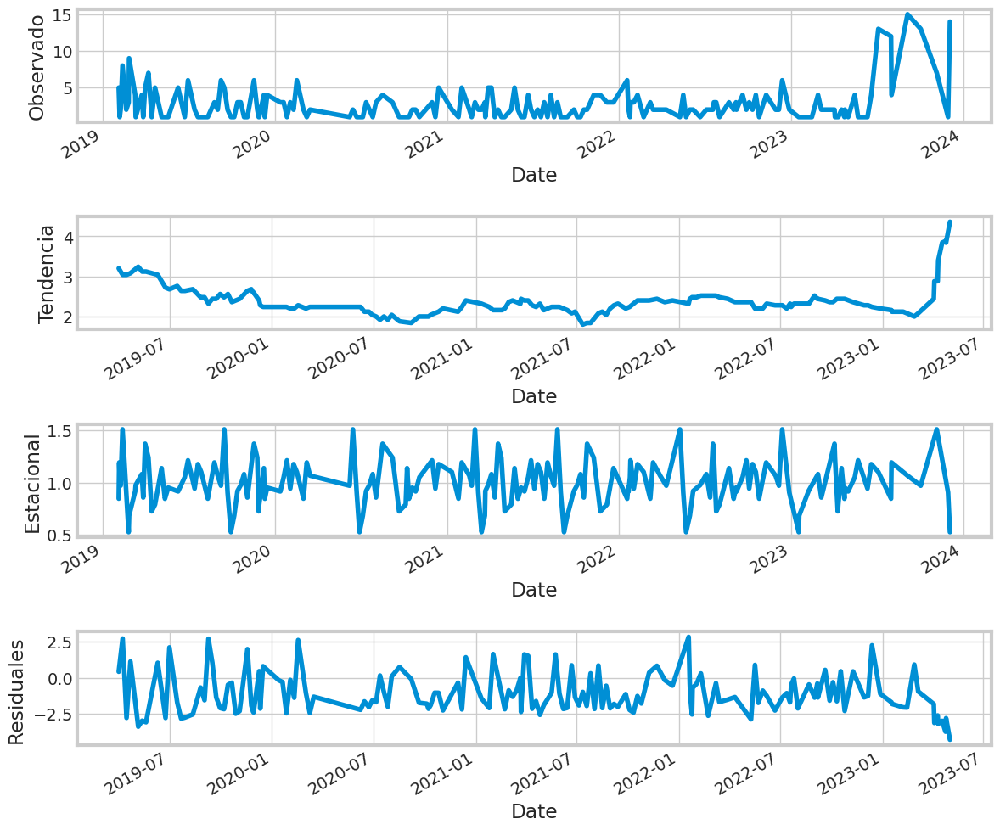

In [518]:
df.seasonal_decompose_plot(25)

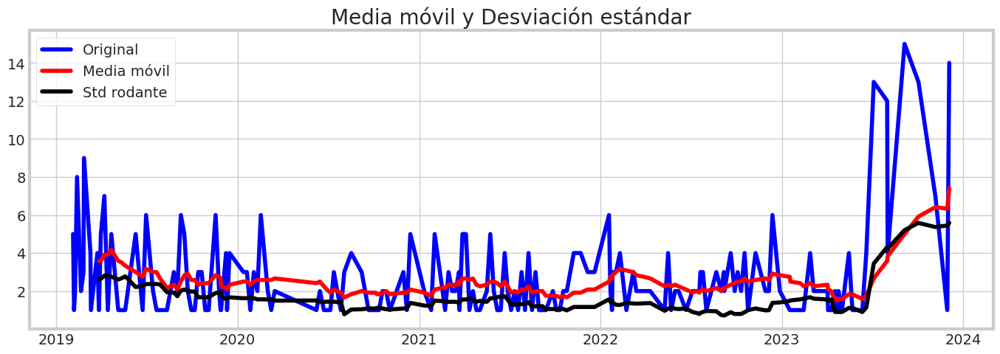

Results of Dickey-Fuller Test:
Test Statistic                  -2.442977
p-value                          0.129972
#Lags Used                      11.000000
Number of Observations Used    170.000000
Critical Value (1%)             -3.469413
Critical Value (5%)             -2.878696
Critical Value (10%)            -2.575917
dtype: float64


In [519]:
df.test_stationarity(0)

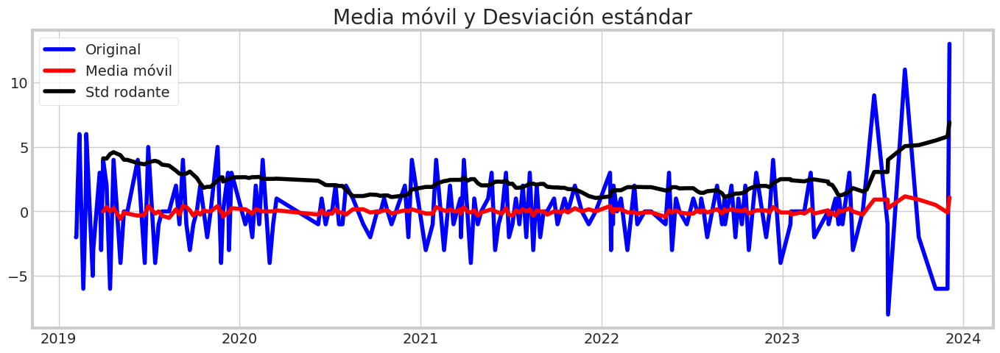

Results of Dickey-Fuller Test:
Test Statistic                  -4.516334
p-value                          0.000184
#Lags Used                       8.000000
Number of Observations Used    172.000000
Critical Value (1%)             -3.468952
Critical Value (5%)             -2.878495
Critical Value (10%)            -2.575809
dtype: float64


In [520]:
df.test_stationarity(1)

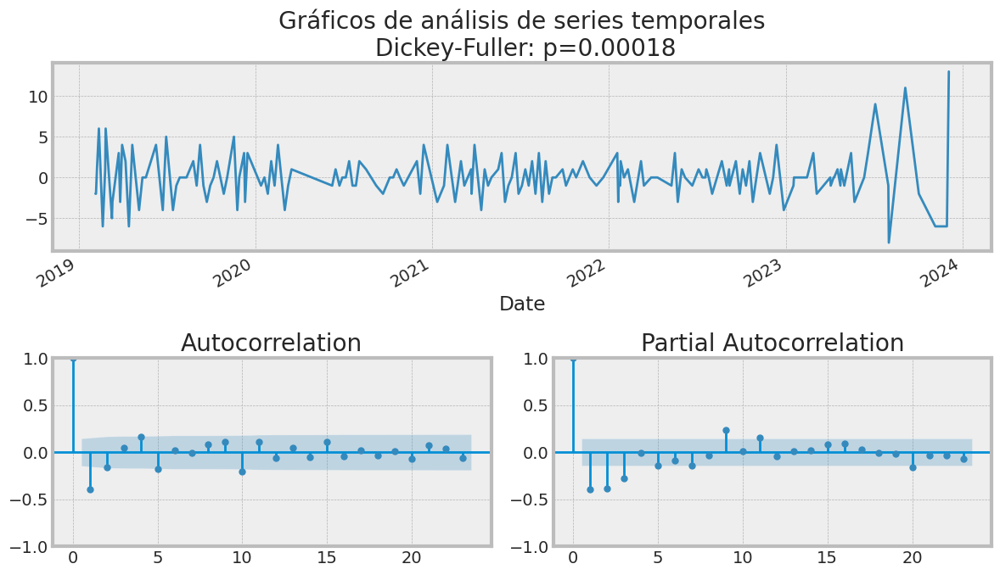

In [521]:
df.tsplot(1)

In [522]:
df.fit_arima((2,1,1))

                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  182
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -397.549
Date:                Wed, 14 Feb 2024   AIC                            803.098
Time:                        21:45:55   BIC                            815.892
Sample:                             0   HQIC                           808.285
                                - 182                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1504      0.049     -3.040      0.002      -0.247      -0.053
ar.L2         -0.2381      0.084     -2.846      0.004      -0.402      -0.074
ma.L1         -0.6188      0.053    -11.732      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


predicted = 2.722855, expected = 1.000000
predicted = 2.667197, expected = 1.000000
predicted = 2.541386, expected = 1.000000
predicted = 2.435795, expected = 4.000000
predicted = 2.300448, expected = 2.000000
predicted = 2.238773, expected = 2.000000
predicted = 2.361013, expected = 1.000000
predicted = 2.362355, expected = 1.000000
predicted = 2.344397, expected = 1.000000
predicted = 2.254086, expected = 2.000000
predicted = 2.165202, expected = 1.000000
predicted = 2.096104, expected = 2.000000
predicted = 2.077273, expected = 1.000000
predicted = 2.010740, expected = 4.000000
predicted = 1.987101, expected = 1.000000
predicted = 1.983818, expected = 1.000000
predicted = 2.086898, expected = 4.000000
predicted = 1.970041, expected = 13.000000
predicted = 2.246813, expected = 12.000000
predicted = 4.413267, expected = 4.000000
predicted = 2.861222, expected = 15.000000
predicted = 9.560092, expected = 13.000000
predicted = 9.794679, expected = 7.000000
predicted = 10.218930, expecte

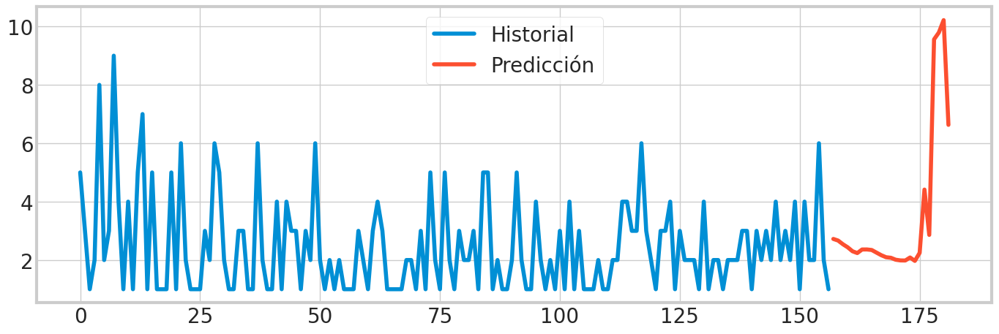

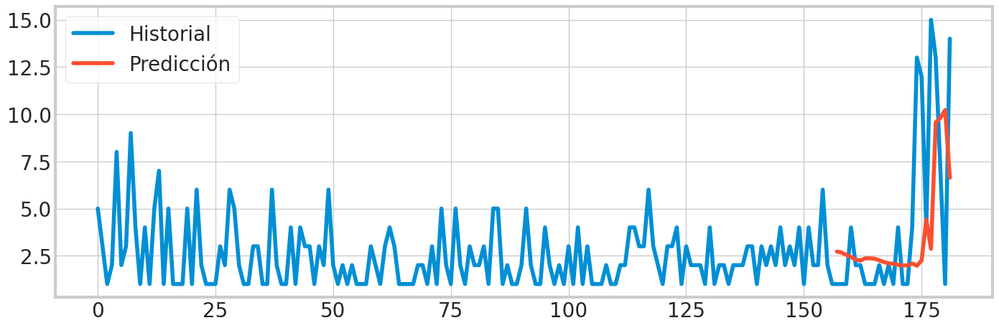

In [523]:
predictions=df.predict_arima((2,1,1), 25)

In [524]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 967
df_result_total = df_result_total.append(df_result)

<ipython-input-524-eae064274f6b>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 5




In [525]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-01-18,1.0,2.627093,2.722855,967
1,2023-02-07,1.0,2.627093,2.667197,967
2,2023-02-14,1.0,2.627093,2.541386,967
3,2023-02-27,4.0,2.627093,2.435795,967
4,2023-03-06,2.0,2.224194,2.300448,967
5,2023-04-03,2.0,2.403626,2.238773,967
6,2023-04-04,1.0,2.403626,2.361013,967
7,2023-04-10,1.0,2.627093,2.362355,967
8,2023-04-11,1.0,2.627093,2.344397,967
9,2023-04-18,2.0,2.627093,2.254086,967


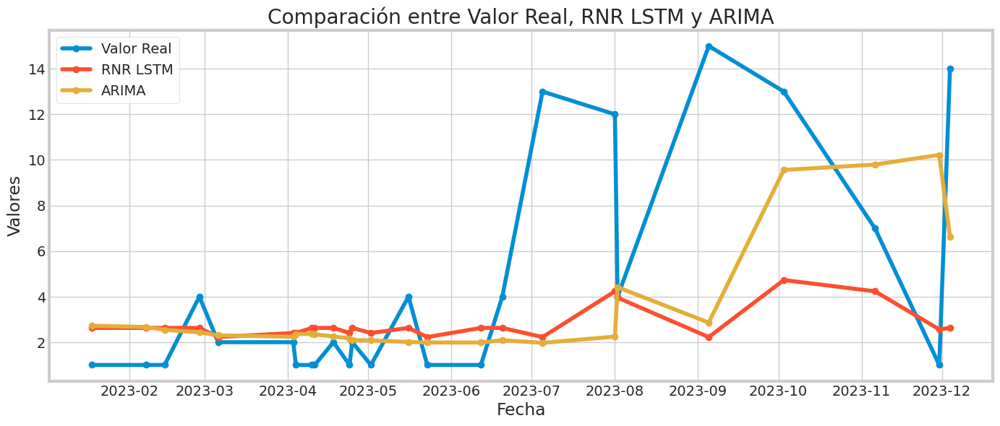

MAE (RNR LSTM): 3.061466598510742
MSE (RNR LSTM): 23.099128200587106
RMSE (RNR LSTM): 4.806155240999515
MAE (ARIMA): 3.0290257495151582
MSE (ARIMA): 22.064591857536925
RMSE (ARIMA): 4.6972962284208695


In [526]:
graficar_comparacion(df_result)

# SUB-ART 6 :LÁPIZ DE COLOR NEGRO 973 (RNR LSTM)

In [527]:
df=dataframe[dataframe['subarticle_id'] == 973]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_93 (LSTM)              (None, 1, 50)             10400     
                                                                 
 dropout_93 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_94 (LSTM)              (None, 1, 50)             20200     
                                                                 
 dropout_94 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_95 (LSTM)              (None, 50)                20200     
                                                                 
 dropout_95 (Dropout)        (None, 50)                0         
                                                                 
 dense_26 (Dense)            (None, 1)               

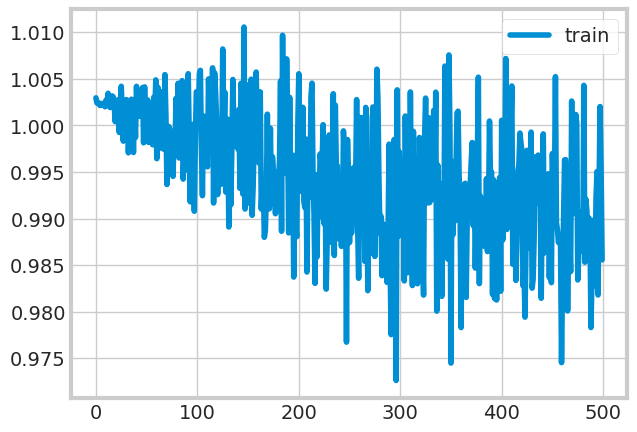

1/1 [==============================] - 1s 1s/step


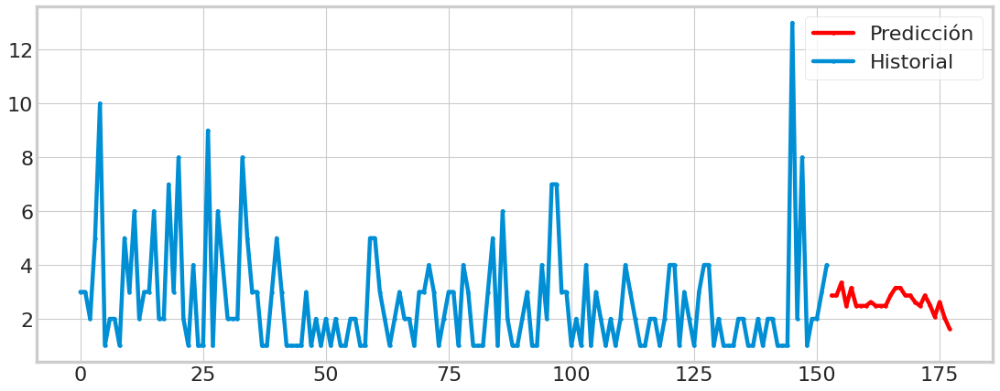

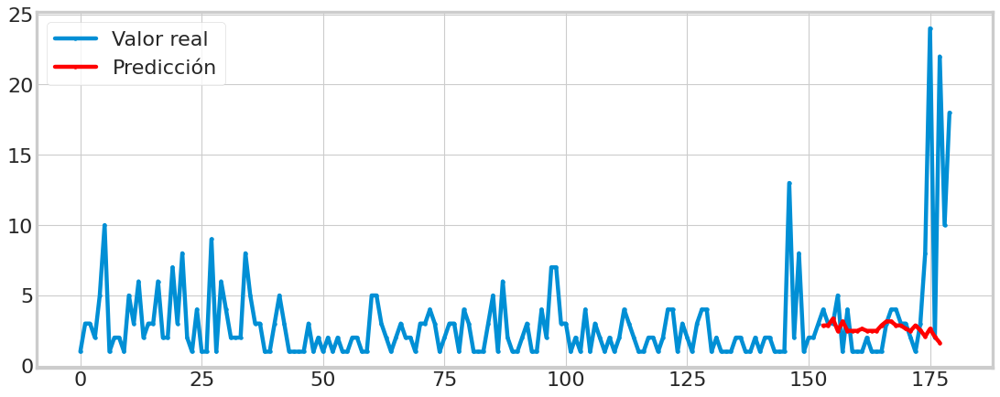

[[ 0.12459596]
 [ 0.12459596]
 [ 0.36648205]
 [-0.06730635]
 [ 0.2663419 ]
 [-0.06730635]
 [-0.06730635]
 [-0.06730635]
 [ 0.00427442]
 [-0.06730635]
 [-0.06730635]
 [-0.06730635]
 [ 0.12459596]
 [ 0.2663419 ]
 [ 0.2663419 ]
 [ 0.12459596]
 [ 0.12459596]
 [ 0.00427442]
 [-0.06730635]
 [ 0.12459596]
 [-0.04571639]
 [-0.26834497]
 [ 0.00427442]
 [-0.28401762]
 [-0.48973787]]
25
RMSE:  7.0098472079286
MAPE:  81.20356914828521


In [528]:
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error', 500, 50, False,50,3)

In [529]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-03-09,3.0,2.865750
1,2023-03-13,5.0,2.865750
2,2023-03-14,1.0,3.348892
3,2023-03-20,4.0,2.482446
4,2023-04-03,1.0,3.148873
5,2023-04-04,1.0,2.482446
6,2023-04-10,1.0,2.482446
7,2023-04-18,2.0,2.482446
8,2023-04-19,1.0,2.625421
9,2023-04-24,1.0,2.482446


# SUB-ART 6 :LÁPIZ DE COLOR NEGRO 973 (ARIMA)

In [530]:
df=dataframe[dataframe['subarticle_id'] == 973]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

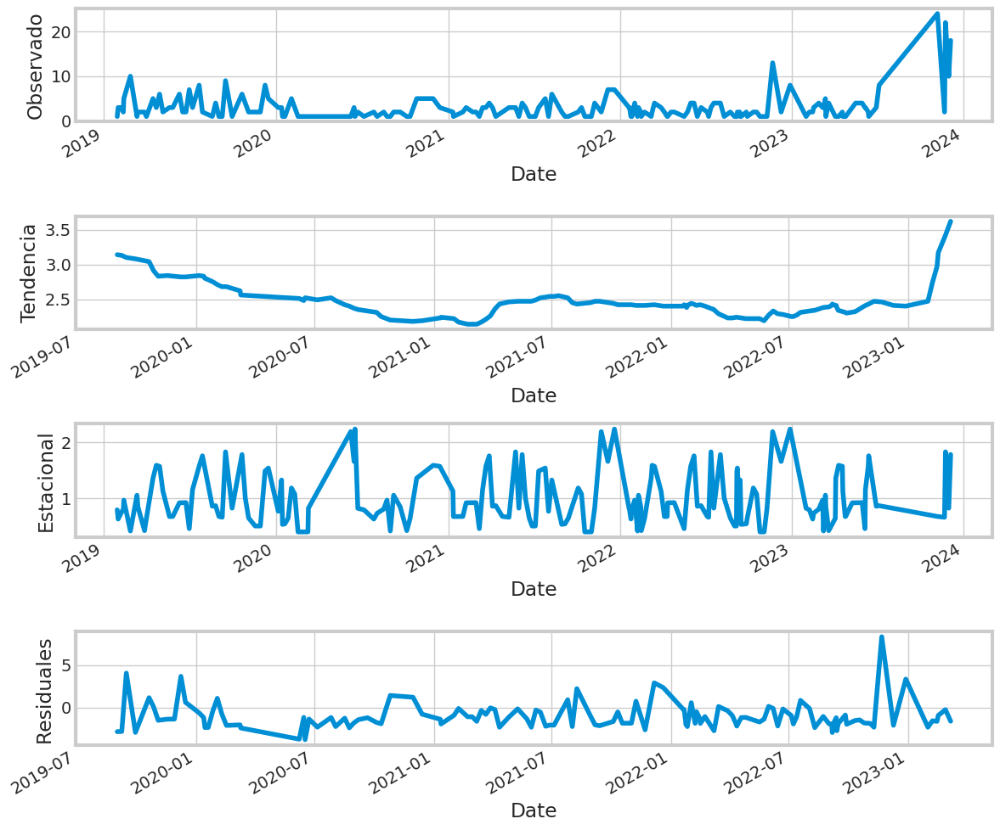

In [531]:
df.seasonal_decompose_plot(50)

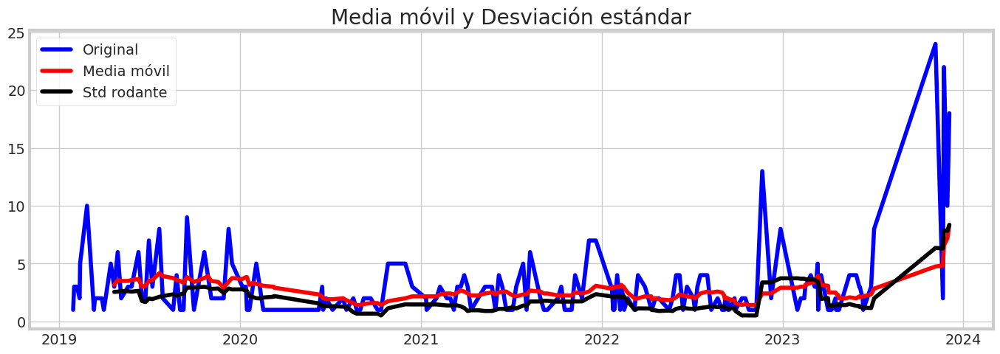

Results of Dickey-Fuller Test:
Test Statistic                  -3.841252
p-value                          0.002512
#Lags Used                       1.000000
Number of Observations Used    178.000000
Critical Value (1%)             -3.467632
Critical Value (5%)             -2.877918
Critical Value (10%)            -2.575501
dtype: float64


In [532]:
df.test_stationarity(0)

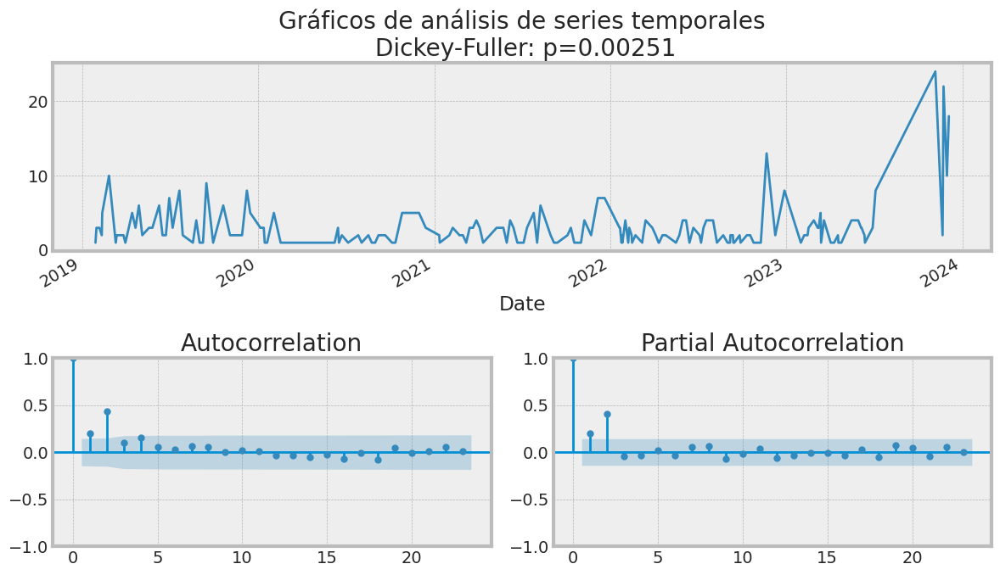

In [533]:
df.tsplot(0)

In [534]:
df.fit_arima((2,0,2))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  180
Model:                 ARIMA(2, 0, 2)   Log Likelihood                -436.491
Date:                Wed, 14 Feb 2024   AIC                            884.982
Time:                        21:46:43   BIC                            904.140
Sample:                             0   HQIC                           892.750
                                - 180                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.2068      0.933      3.438      0.001       1.379       5.035
ar.L1          0.2218      0.173      1.280      0.201      -0.118       0.562
ar.L2          0.5018      0.156      3.212      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 1.673173, expected = 3.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 2.698819, expected = 5.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.750246, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.234559, expected = 4.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 1.462056, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 1.936205, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.219856, expected = 1.000000
predicted = 2.194231, expected = 2.000000
predicted = 2.596386, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 2.060327, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 2.812375, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.057971, expected = 3.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 2.155572, expected = 4.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 2.152157, expected = 4.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.235957, expected = 3.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.475775, expected = 3.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 2.288228, expected = 2.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 1.707519, expected = 1.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 2.495118, expected = 3.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.130926, expected = 8.000000
predicted = 3.125582, expected = 24.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 5.317257, expected = 2.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.710552, expected = 22.000000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted = 3.220336, expected = 10.000000
predicted = 5.159069, expected = 18.000000


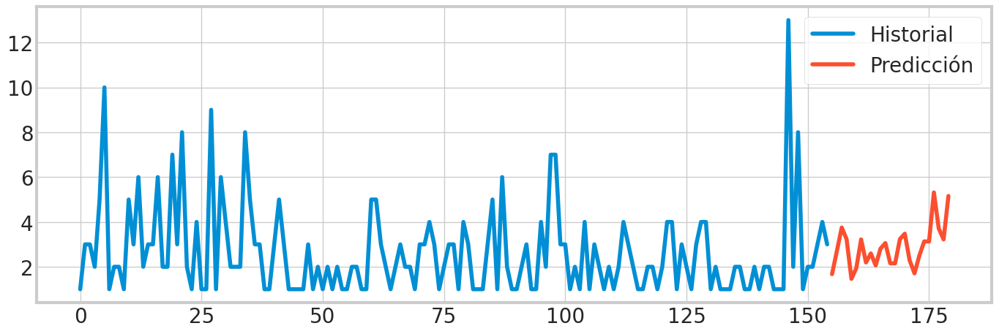

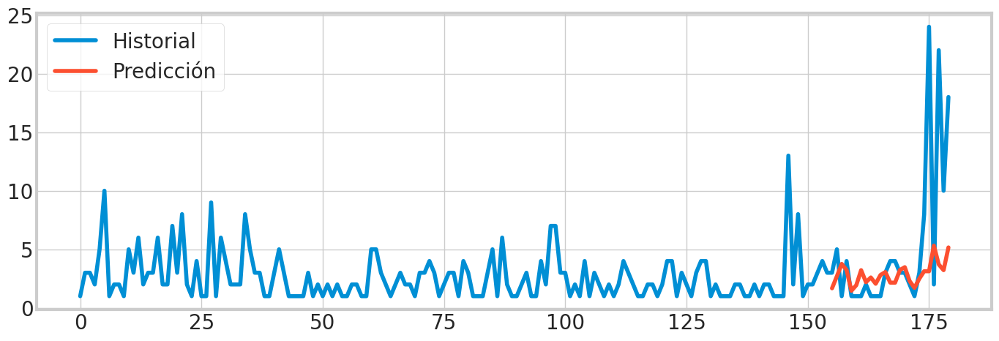

In [535]:
predictions=df.predict_arima((2,0,2), 25)

In [536]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 973
df_result_total = df_result_total.append(df_result)

<ipython-input-536-c959b05ca792>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 6

In [537]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-03-09,3.0,2.865750,1.673173,973
1,2023-03-13,5.0,2.865750,2.698819,973
2,2023-03-14,1.0,3.348892,3.750246,973
3,2023-03-20,4.0,2.482446,3.234559,973
4,2023-04-03,1.0,3.148873,1.462056,973
5,2023-04-04,1.0,2.482446,1.936205,973
6,2023-04-10,1.0,2.482446,3.219856,973
7,2023-04-18,2.0,2.482446,2.194231,973
8,2023-04-19,1.0,2.625421,2.596386,973
9,2023-04-24,1.0,2.482446,2.060327,973


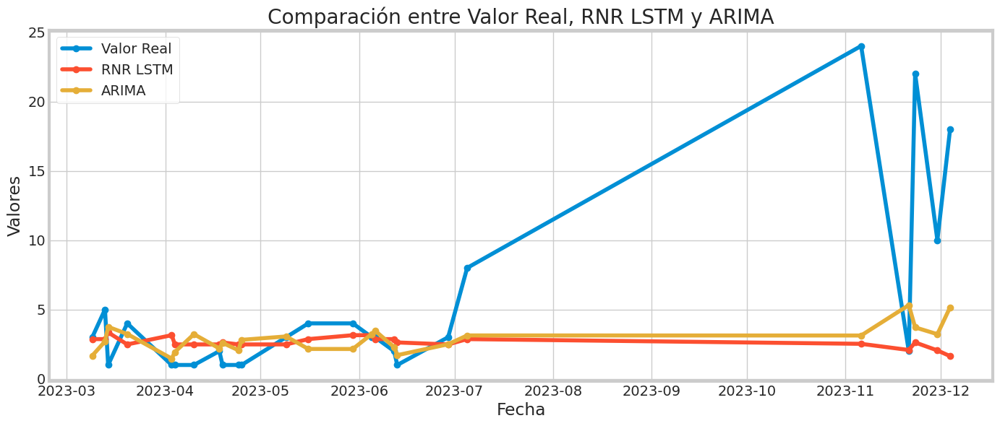

MAE (RNR LSTM): 3.699685125350952
MSE (RNR LSTM): 49.137957878504395
RMSE (RNR LSTM): 7.0098472079286
MAE (ARIMA): 3.5343410929087313
MSE (ARIMA): 42.07878523279337
RMSE (ARIMA): 6.486816263221379


In [538]:

graficar_comparacion(df_result)

# SUB-ART 7 :CINTA DE EMBALAJE TRANSPARENTE DE 48 MM X 100Y 926 (RNR LSTM)

In [539]:
df=dataframe[dataframe['subarticle_id'] == 926]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_96 (LSTM)              (None, 1, 150)            91200     
                                                                 
 dropout_96 (Dropout)        (None, 1, 150)            0         
                                                                 
 lstm_97 (LSTM)              (None, 1, 150)            180600    
                                                                 
 dropout_97 (Dropout)        (None, 1, 150)            0         
                                                                 
 lstm_98 (LSTM)              (None, 150)               180600    
                                                                 
 dropout_98 (Dropout)        (None, 150)               0         
                                                                 
 dense_27 (Dense)            (None, 1)               

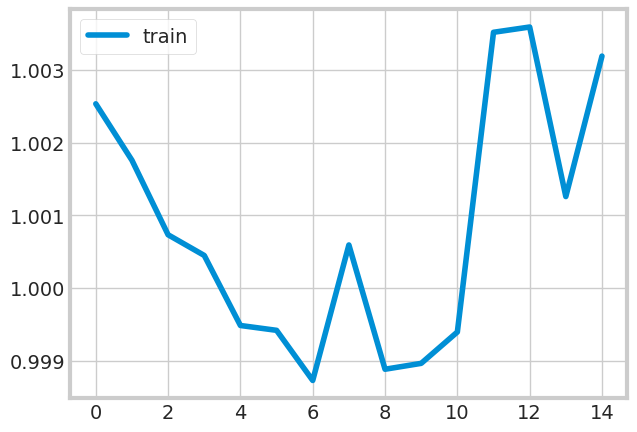

1/1 [==============================] - 2s 2s/step


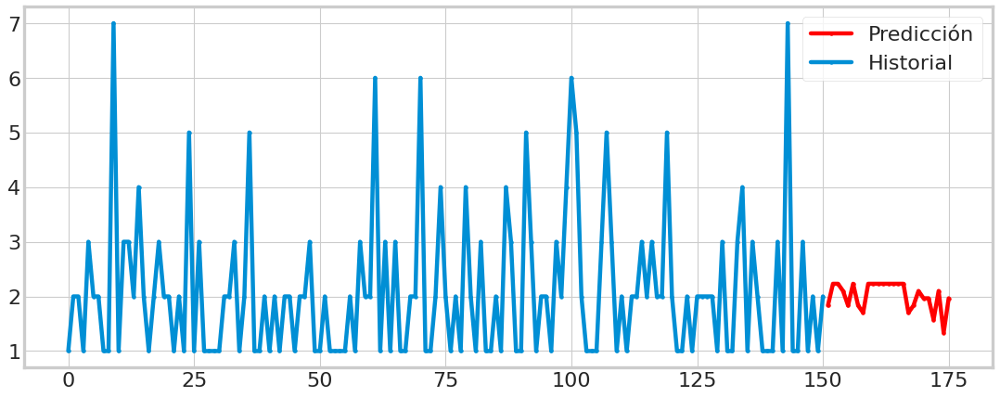

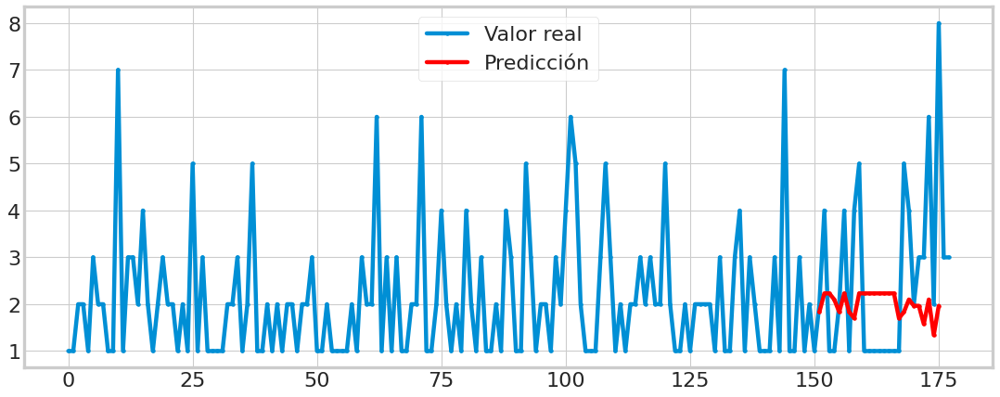

[[-0.18815565]
 [ 0.11586171]
 [ 0.11586171]
 [ 0.01546173]
 [-0.18815565]
 [ 0.11586171]
 [-0.18815565]
 [-0.28825074]
 [ 0.11586171]
 [ 0.11586171]
 [ 0.11586171]
 [ 0.11586171]
 [ 0.11586171]
 [ 0.11586171]
 [ 0.11586171]
 [ 0.11586171]
 [-0.28825074]
 [-0.18815565]
 [ 0.01546173]
 [-0.08639967]
 [-0.08639967]
 [-0.3852606 ]
 [ 0.01546173]
 [-0.5655157 ]
 [-0.08639967]]
25
RMSE:  2.007957567725811
MAPE:  73.03114018440246


In [540]:
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error', 15, 35, False,150,3)

In [541]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-03-13,1.0,1.832366
1,2023-03-14,1.0,2.230786
2,2023-03-16,2.0,2.230786
3,2023-03-20,4.0,2.099210
4,2023-04-03,1.0,1.832366
5,2023-04-13,4.0,2.230786
6,2023-04-18,5.0,1.832366
7,2023-04-19,1.0,1.701190
8,2023-04-24,1.0,2.230786
9,2023-05-05,1.0,2.230786


# SUB-ART 7 :CINTA DE EMBALAJE TRANSPARENTE DE 48 MM X 100Y 926 (ARIMA)

In [542]:
df=dataframe[dataframe['subarticle_id'] == 926]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

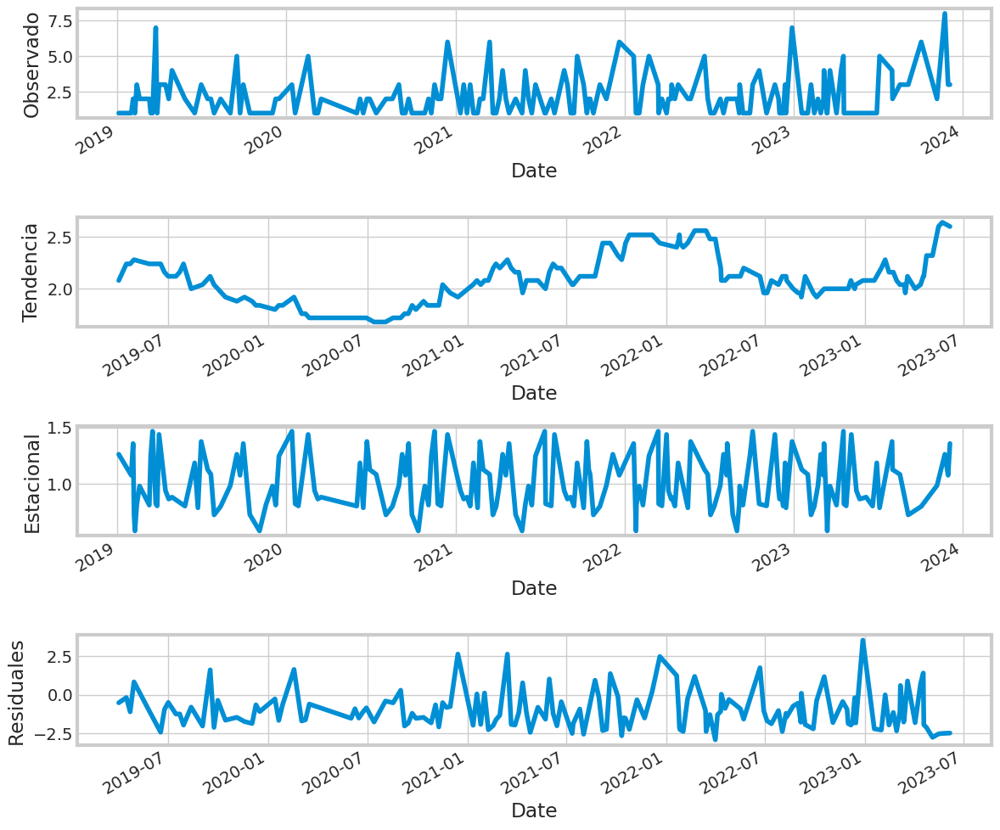

In [543]:
df.seasonal_decompose_plot(25)

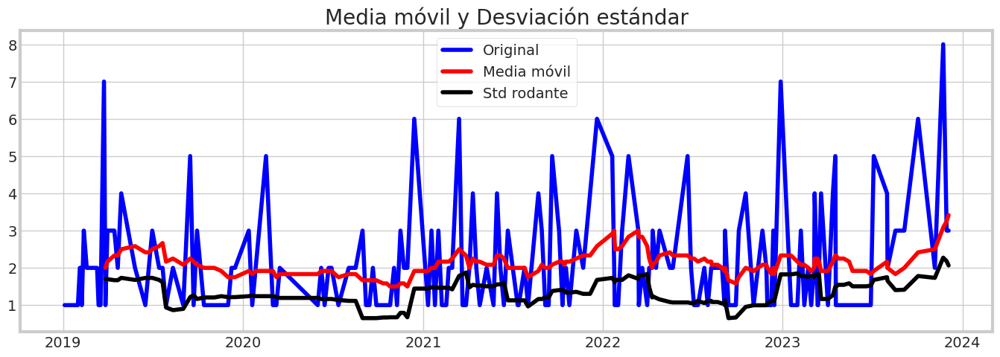

Results of Dickey-Fuller Test:
Test Statistic                -1.330570e+01
p-value                        6.904887e-25
#Lags Used                     0.000000e+00
Number of Observations Used    1.770000e+02
Critical Value (1%)           -3.467845e+00
Critical Value (5%)           -2.878012e+00
Critical Value (10%)          -2.575551e+00
dtype: float64


In [544]:
df.test_stationarity(0)

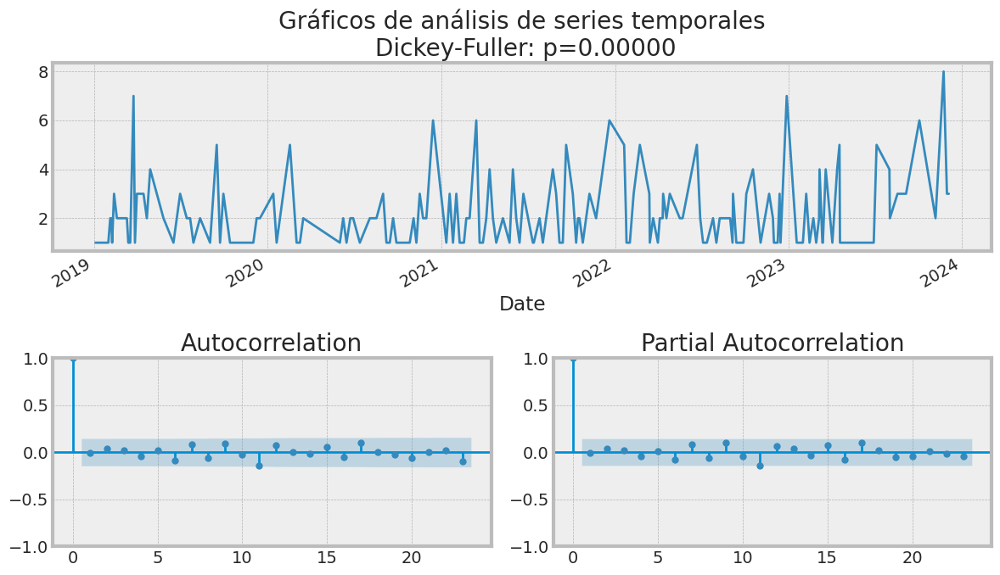

In [545]:
df.tsplot(0)

In [546]:
df.fit_arima((1,0,1))

                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  178
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -314.814
Date:                Wed, 14 Feb 2024   AIC                            637.628
Time:                        21:47:16   BIC                            650.355
Sample:                             0   HQIC                           642.789
                                - 178                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.1631      0.167     12.929      0.000       1.835       2.491
ar.L1          0.5762      4.379      0.132      0.895      -8.007       9.159
ma.L1         -0.5657      4.429     -0.128      0.8

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


predicted = 1.987833, expected = 1.000000
predicted = 2.113030, expected = 1.000000
predicted = 2.201716, expected = 2.000000
predicted = 2.172729, expected = 4.000000
predicted = 1.972420, expected = 1.000000
predicted = 2.108496, expected = 4.000000
predicted = 1.915990, expected = 5.000000
predicted = 1.745913, expected = 1.000000
predicted = 1.929977, expected = 1.000000
predicted = 2.076235, expected = 1.000000
predicted = 2.179745, expected = 1.000000
predicted = 2.248755, expected = 1.000000
predicted = 2.290908, expected = 1.000000
predicted = 2.311618, expected = 1.000000
predicted = 2.314883, expected = 1.000000
predicted = 2.303736, expected = 5.000000
predicted = 2.076590, expected = 4.000000
predicted = 1.948954, expected = 2.000000
predicted = 1.983897, expected = 3.000000
predicted = 1.945154, expected = 3.000000
predicted = 1.919577, expected = 6.000000
predicted = 1.795634, expected = 2.000000
predicted = 1.858698, expected = 8.000000
predicted = 1.991468, expected = 3

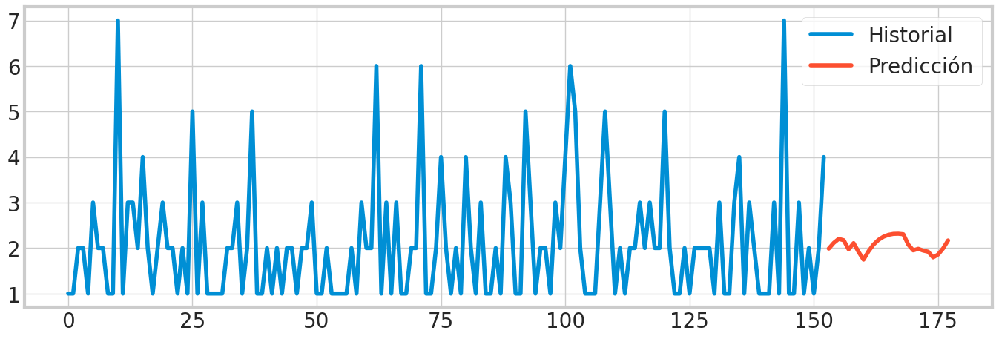

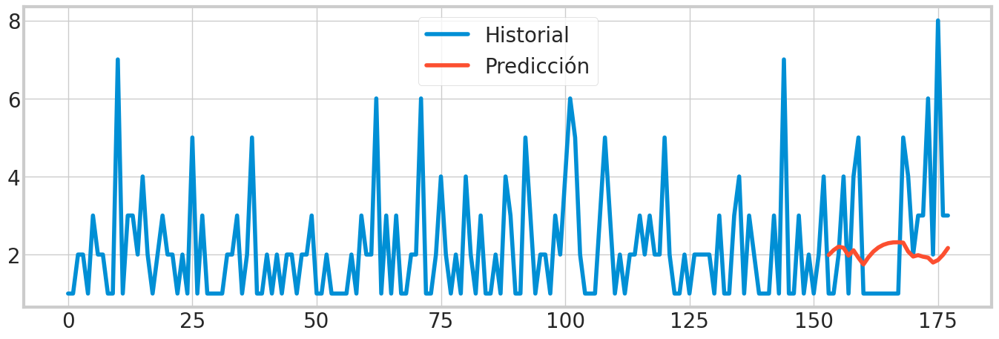

In [547]:
predictions=df.predict_arima((1,0,1), 25)

In [548]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 926
df_result_total = df_result_total.append(df_result)

<ipython-input-548-8d32f07d2f9a>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 7

In [549]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-03-13,1.0,1.832366,1.987833,926
1,2023-03-14,1.0,2.230786,2.113030,926
2,2023-03-16,2.0,2.230786,2.201716,926
3,2023-03-20,4.0,2.099210,2.172729,926
4,2023-04-03,1.0,1.832366,1.972420,926
5,2023-04-13,4.0,2.230786,2.108496,926
6,2023-04-18,5.0,1.832366,1.915990,926
7,2023-04-19,1.0,1.701190,1.745913,926
8,2023-04-24,1.0,2.230786,1.929977,926
9,2023-05-05,1.0,2.230786,2.076235,926


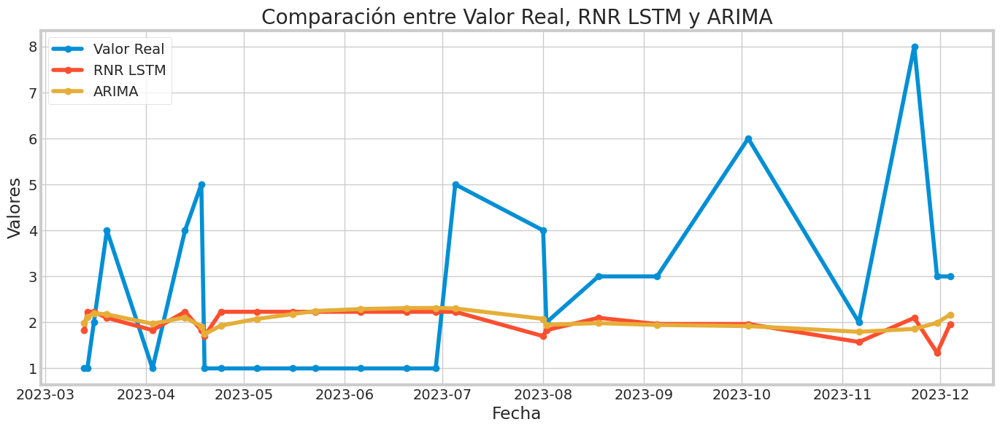

MAE (RNR LSTM): 1.5803530645370483
MSE (RNR LSTM): 4.031893593787355
RMSE (RNR LSTM): 2.007957567725811
MAE (ARIMA): 1.5273802468735307
MSE (ARIMA): 3.9803806219584152
RMSE (ARIMA): 1.9950891263195274


In [550]:
graficar_comparacion(df_result)

# SUB-ART 8 :BOLÍGRAFO DE COLOR AZUL No 0,7 921 (RNR LSTM)


In [551]:
df=dataframe[dataframe['subarticle_id'] == 921]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_99 (LSTM)              (None, 1, 100)            40800     
                                                                 
 dropout_99 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_100 (LSTM)             (None, 1, 100)            80400     
                                                                 
 dropout_100 (Dropout)       (None, 1, 100)            0         
                                                                 
 lstm_101 (LSTM)             (None, 100)               80400     
                                                                 
 dropout_101 (Dropout)       (None, 100)               0         
                                                                 
 dense_28 (Dense)            (None, 1)               

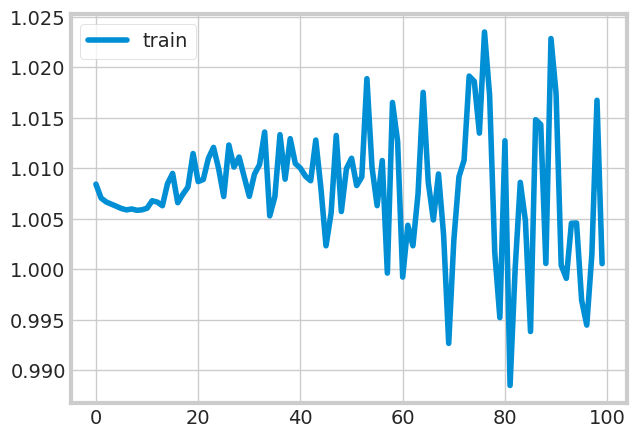

1/1 [==============================] - 2s 2s/step


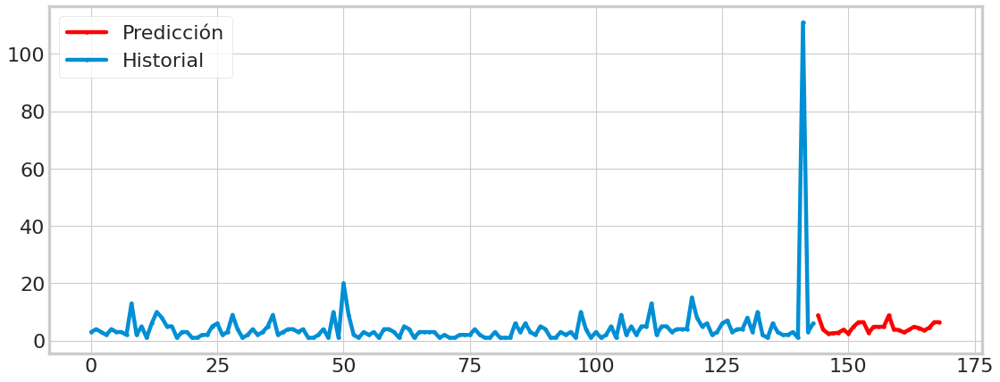

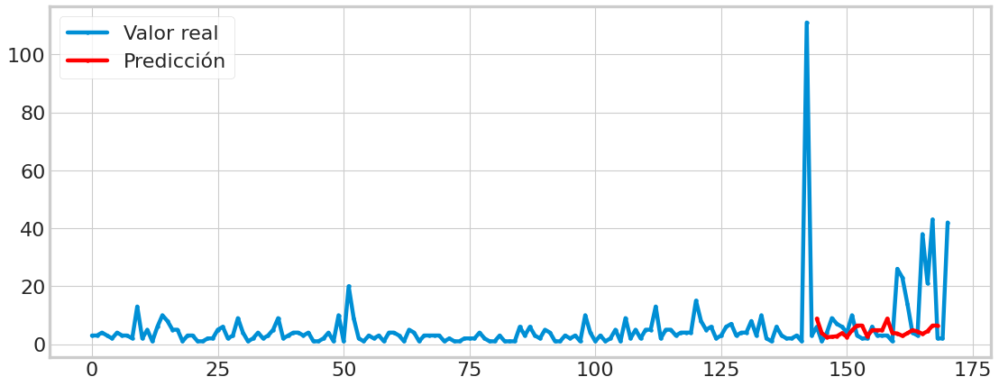

[[ 0.462308  ]
 [-0.07332593]
 [-0.21501723]
 [-0.20541213]
 [-0.1837927 ]
 [-0.07332593]
 [-0.21048911]
 [ 0.0381767 ]
 [ 0.20931561]
 [ 0.20931561]
 [-0.1837927 ]
 [ 0.0381767 ]
 [ 0.0381767 ]
 [ 0.0381767 ]
 [ 0.462308  ]
 [-0.06080825]
 [-0.08258604]
 [-0.17139749]
 [-0.07332593]
 [ 0.0381767 ]
 [-0.00780208]
 [-0.09936301]
 [ 0.00223341]
 [ 0.20931561]
 [ 0.2093156 ]]
25
RMSE:  14.371536641480434
MAPE:  90.43226625950098


In [552]:
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error', 100, 32, False,100,3)

In [553]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-04-25,4.0,8.802856
1,2023-05-02,9.0,3.789564
2,2023-05-09,7.0,2.463398
3,2023-05-16,6.0,2.553297
4,2023-05-23,4.0,2.755646
5,2023-05-30,10.0,3.789564
6,2023-06-05,3.0,2.505779
7,2023-06-06,2.0,4.833179
8,2023-06-09,2.0,6.434962
9,2023-06-12,6.0,6.434962


# SUB-ART 8 :BOLÍGRAFO DE COLOR AZUL No 0,7 921 (ARIMA)

In [554]:
df=dataframe[dataframe['subarticle_id'] == 921]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

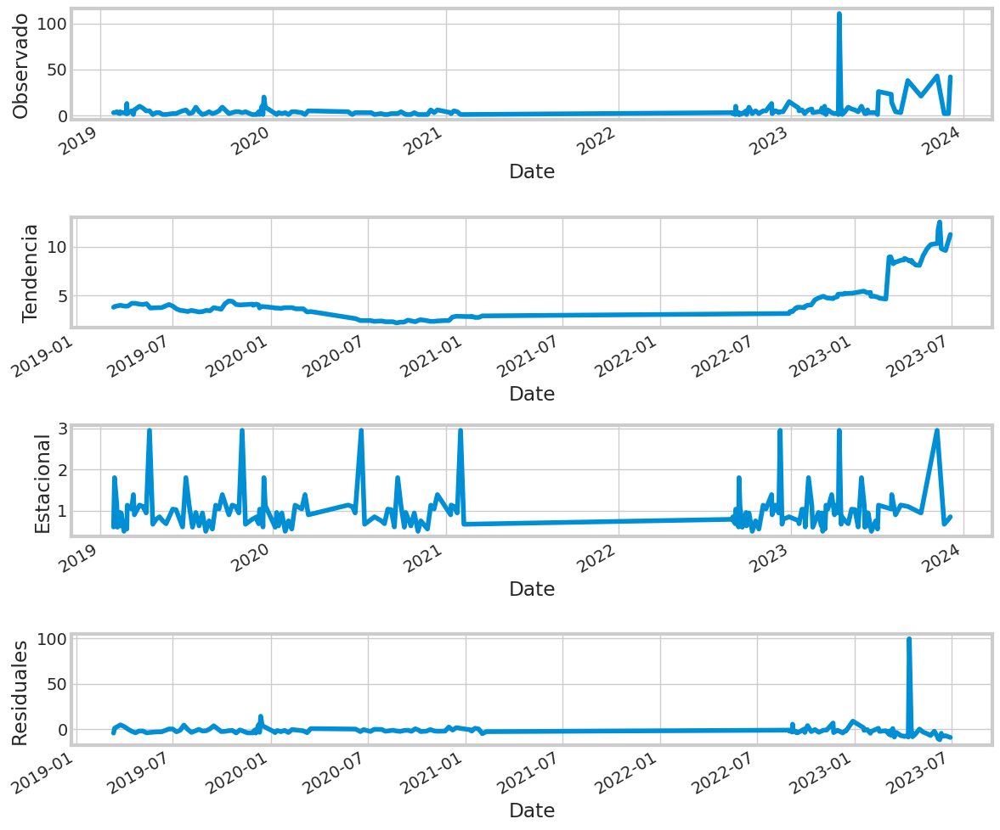

In [555]:
df.seasonal_decompose_plot(25)

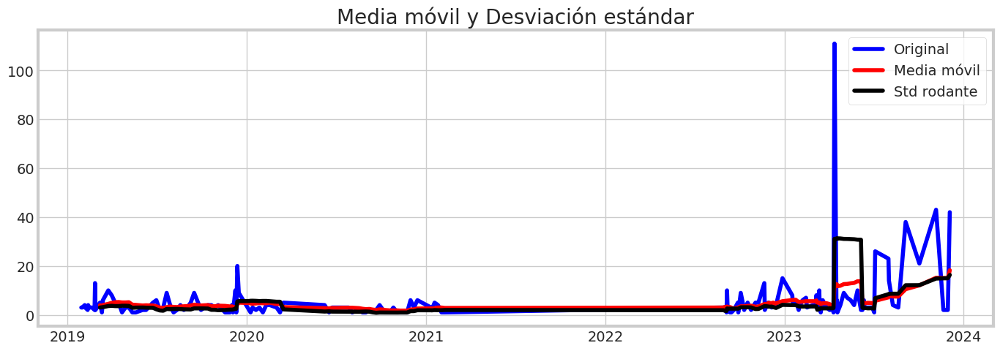

Results of Dickey-Fuller Test:
Test Statistic                -1.173851e+01
p-value                        1.290358e-21
#Lags Used                     0.000000e+00
Number of Observations Used    1.700000e+02
Critical Value (1%)           -3.469413e+00
Critical Value (5%)           -2.878696e+00
Critical Value (10%)          -2.575917e+00
dtype: float64


In [556]:
df.test_stationarity(0)

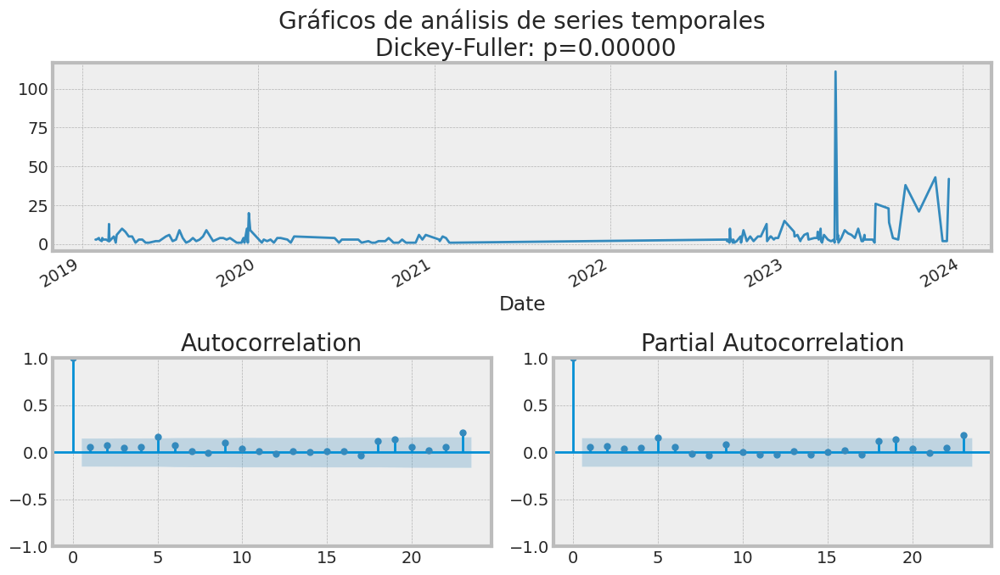

In [557]:
df.tsplot(0)

In [558]:
df.fit_arima((1,0,1))

                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  171
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -636.519
Date:                Wed, 14 Feb 2024   AIC                           1281.038
Time:                        21:47:42   BIC                           1293.605
Sample:                             0   HQIC                          1286.137
                                - 171                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.7421      8.959      0.753      0.452     -10.817      24.301
ar.L1          0.9867      0.077     12.881      0.000       0.837       1.137
ma.L1         -0.9371      0.118     -7.932      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


predicted = 6.346226, expected = 4.000000
predicted = 3.344531, expected = 9.000000
predicted = 4.624277, expected = 7.000000
predicted = 4.232082, expected = 6.000000
predicted = 4.590379, expected = 4.000000
predicted = 4.472530, expected = 10.000000
predicted = 4.372432, expected = 3.000000
predicted = 4.676603, expected = 2.000000
predicted = 4.508344, expected = 2.000000
predicted = 4.577801, expected = 6.000000
predicted = 4.412458, expected = 3.000000
predicted = 4.595637, expected = 3.000000
predicted = 4.475291, expected = 3.000000
predicted = 4.531615, expected = 1.000000
predicted = 4.532966, expected = 26.000000
predicted = 3.754191, expected = 23.000000
predicted = 4.675027, expected = 14.000000
predicted = 4.962610, expected = 4.000000
predicted = 4.785153, expected = 3.000000
predicted = 4.727399, expected = 38.000000
predicted = 4.418897, expected = 21.000000
predicted = 8.423992, expected = 43.000000
predicted = 11.151317, expected = 2.000000
predicted = 10.165057, exp

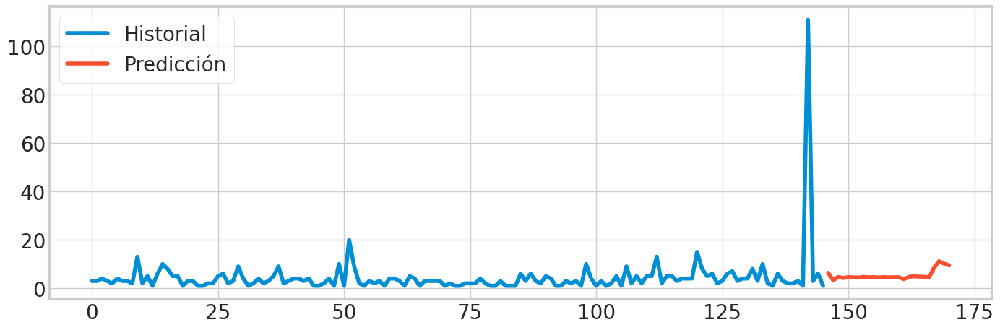

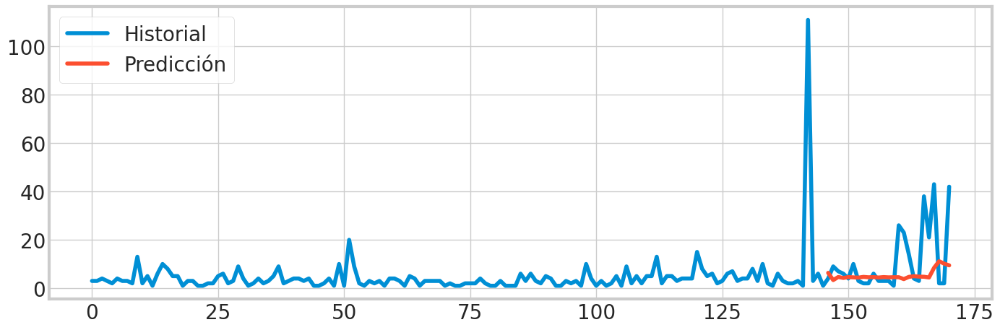

In [559]:
predictions=df.predict_arima((1,0,1), 25)

In [560]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 921
df_result_total = df_result_total.append(df_result)

<ipython-input-560-6b59f8003a5a>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 8

In [561]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-04-25,4.0,8.802856,6.346226,921
1,2023-05-02,9.0,3.789564,3.344531,921
2,2023-05-09,7.0,2.463398,4.624277,921
3,2023-05-16,6.0,2.553297,4.232082,921
4,2023-05-23,4.0,2.755646,4.590379,921
5,2023-05-30,10.0,3.789564,4.472530,921
6,2023-06-05,3.0,2.505779,4.372432,921
7,2023-06-06,2.0,4.833179,4.676603,921
8,2023-06-09,2.0,6.434962,4.508344,921
9,2023-06-12,6.0,6.434962,4.577801,921


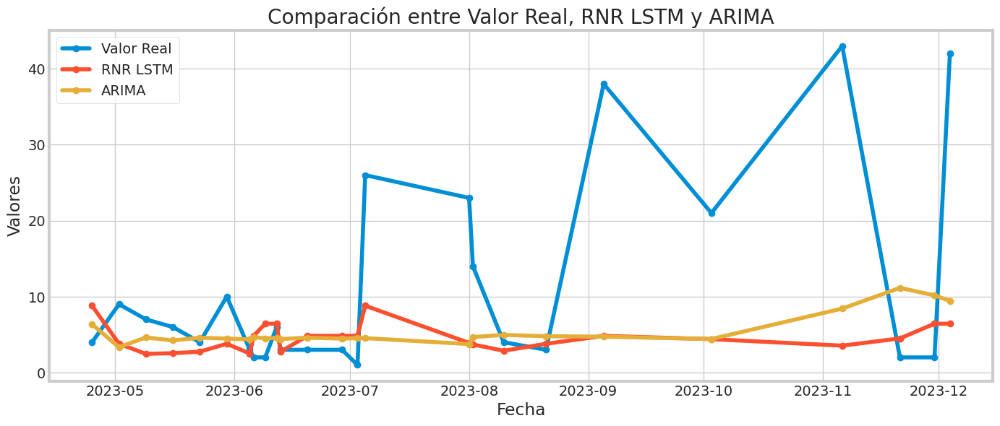

MAE (RNR LSTM): 8.864516496658325
MSE (RNR LSTM): 206.5410654374147
RMSE (RNR LSTM): 14.371536641480434
MAE (ARIMA): 8.854055319748705
MSE (ARIMA): 192.968414134564
RMSE (ARIMA): 13.891307142762484


In [562]:
graficar_comparacion(df_result)

# SUB-ART 9 :CUADERNO DE 100 HOJAS CON ESPIRAL TAMAÑO CARTA 934 (RNR LSTM)

In [563]:
df=dataframe[dataframe['subarticle_id'] == 934]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_102 (LSTM)             (None, 1, 50)             10400     
                                                                 
 dropout_102 (Dropout)       (None, 1, 50)             0         
                                                                 
 lstm_103 (LSTM)             (None, 1, 50)             20200     
                                                                 
 dropout_103 (Dropout)       (None, 1, 50)             0         
                                                                 
 lstm_104 (LSTM)             (None, 1, 50)             20200     
                                                                 
 dropout_104 (Dropout)       (None, 1, 50)             0         
                                                                 
 lstm_105 (LSTM)             (None, 1, 50)           

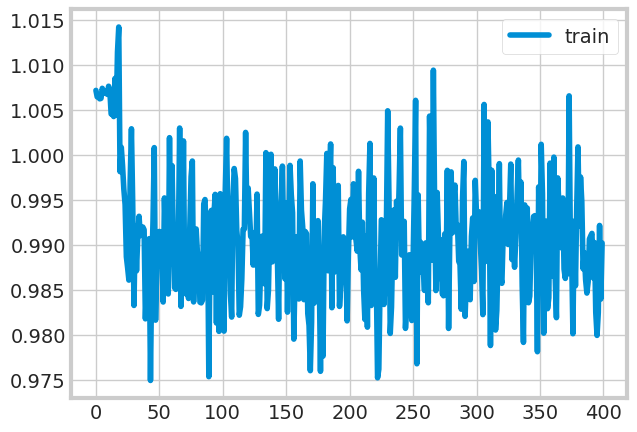

1/1 [==============================] - 2s 2s/step


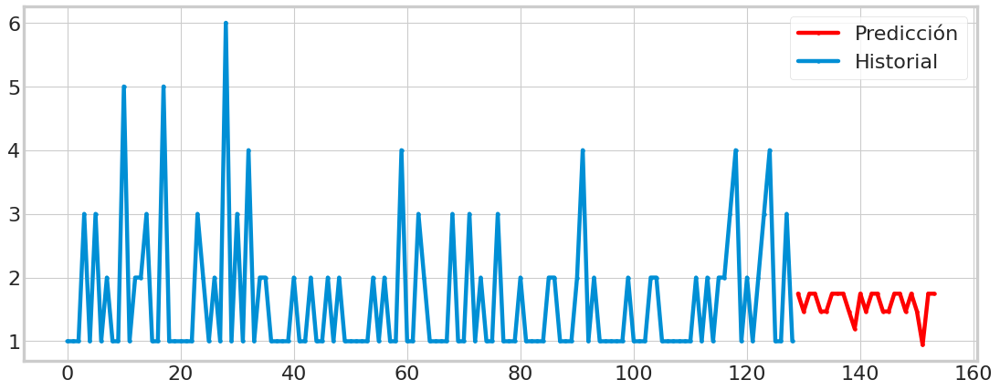

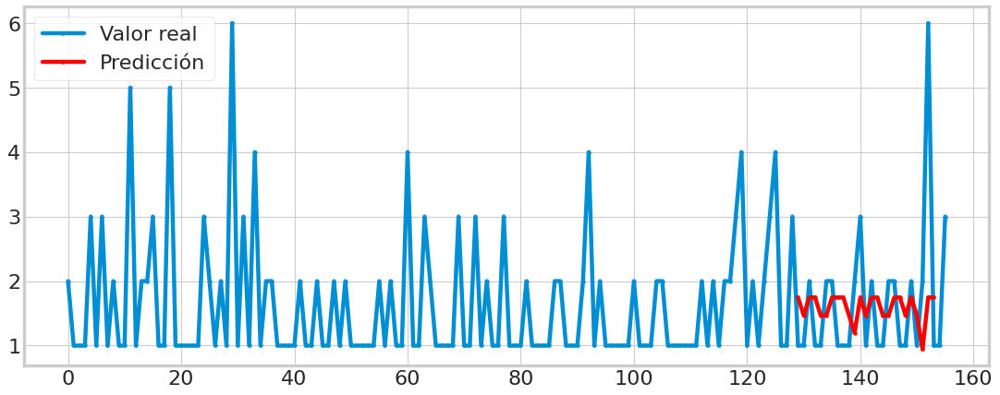

[[ 0.11631741]
 [-0.16385017]
 [ 0.11631741]
 [ 0.11631741]
 [-0.16385017]
 [-0.16385017]
 [ 0.11631741]
 [ 0.11631741]
 [ 0.11631741]
 [-0.16385017]
 [-0.43530196]
 [ 0.11631741]
 [-0.16385017]
 [ 0.11631741]
 [ 0.11631741]
 [-0.16385017]
 [-0.16385017]
 [ 0.11631741]
 [ 0.11631741]
 [-0.16385017]
 [ 0.11631741]
 [-0.16385017]
 [-0.691962  ]
 [ 0.11631741]
 [ 0.11631741]]
25
RMSE:  1.0946015598651946
MAPE:  40.70664755503336


In [564]:
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error', 400, 32, False,50,5)

In [565]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-03-14,2.0,1.746313
1,2023-03-20,1.0,1.468009
2,2023-03-28,1.0,1.746313
3,2023-04-03,2.0,1.746313
4,2023-04-04,2.0,1.468009
5,2023-04-10,1.0,1.468009
6,2023-04-19,1.0,1.746313
7,2023-05-02,1.0,1.746313
8,2023-05-09,2.0,1.746313
9,2023-05-16,3.0,1.468009


# SUB-ART 9 :CUADERNO DE 100 HOJAS CON ESPIRAL TAMAÑO CARTA 934 (ARIMA)

In [566]:
df=dataframe[dataframe['subarticle_id'] == 934]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

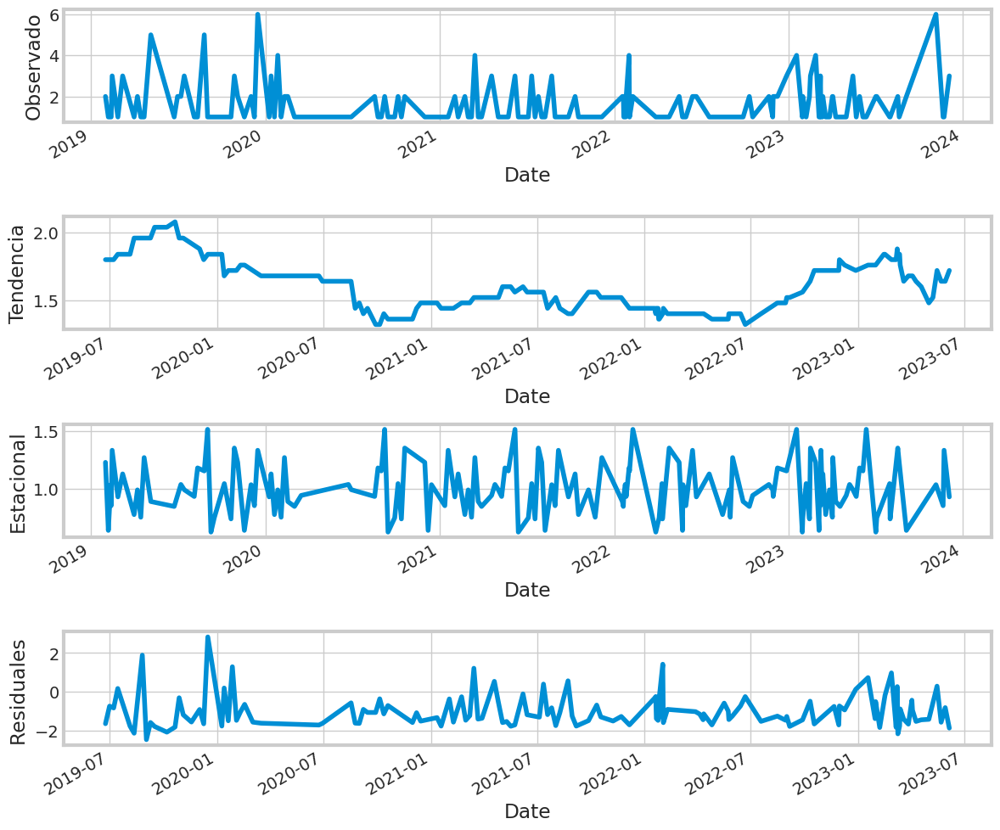

In [567]:
df.seasonal_decompose_plot(25)

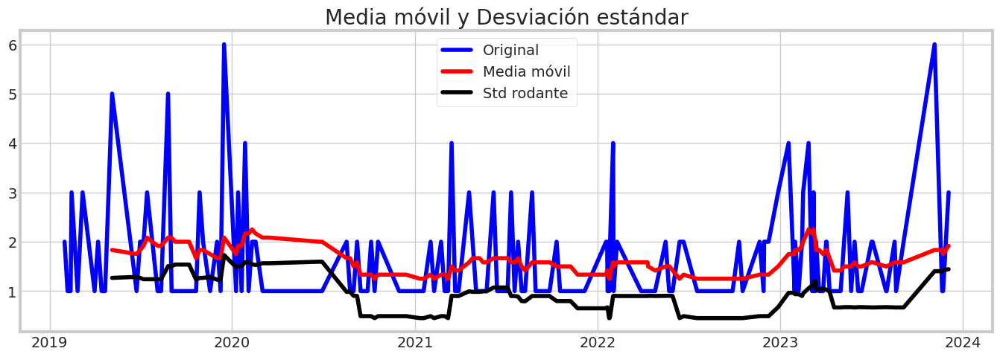

Results of Dickey-Fuller Test:
Test Statistic                -1.432423e+01
p-value                        1.127789e-26
#Lags Used                     0.000000e+00
Number of Observations Used    1.550000e+02
Critical Value (1%)           -3.473259e+00
Critical Value (5%)           -2.880374e+00
Critical Value (10%)          -2.576812e+00
dtype: float64


In [568]:
df.test_stationarity(0)

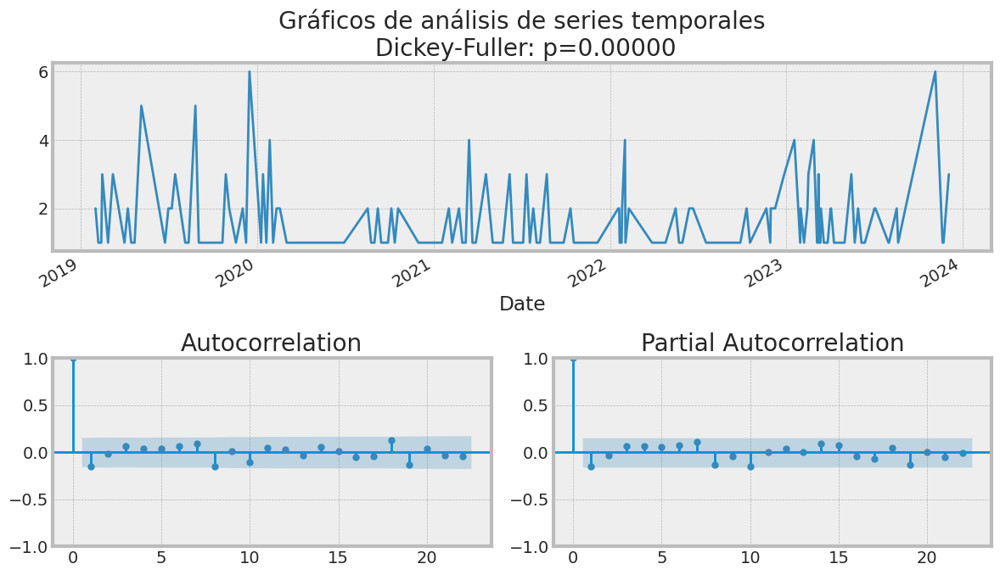

In [569]:
df.tsplot(0)

In [570]:
df.fit_arima((2,0,1))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/u

                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  156
Model:                 ARIMA(2, 0, 1)   Log Likelihood                -220.058
Date:                Wed, 14 Feb 2024   AIC                            450.117
Time:                        21:48:34   BIC                            465.366
Sample:                             0   HQIC                           456.310
                                - 156                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6393      0.112     14.620      0.000       1.420       1.859
ar.L1         -1.0222      0.319     -3.201      0.001      -1.648      -0.396
ar.L2         -0.1693      0.108     -1.562      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


predicted = 1.796648, expected = 2.000000
predicted = 1.584666, expected = 1.000000
predicted = 1.757194, expected = 1.000000
predicted = 1.698286, expected = 2.000000
predicted = 1.508073, expected = 2.000000
predicted = 1.550068, expected = 1.000000
predicted = 1.732369, expected = 1.000000
predicted = 1.684040, expected = 1.000000
predicted = 1.644731, expected = 2.000000
predicted = 1.471129, expected = 3.000000
predicted = 1.379302, expected = 1.000000
predicted = 1.764325, expected = 2.000000
predicted = 1.565222, expected = 1.000000
predicted = 1.738934, expected = 1.000000
predicted = 1.693297, expected = 2.000000
predicted = 1.511058, expected = 2.000000
predicted = 1.545621, expected = 1.000000
predicted = 1.720849, expected = 1.000000
predicted = 1.680647, expected = 2.000000
predicted = 1.503452, expected = 1.000000
predicted = 1.686243, expected = 2.000000
predicted = 1.504116, expected = 6.000000
predicted = 0.963018, expected = 1.000000
predicted = 1.641069, expected = 1

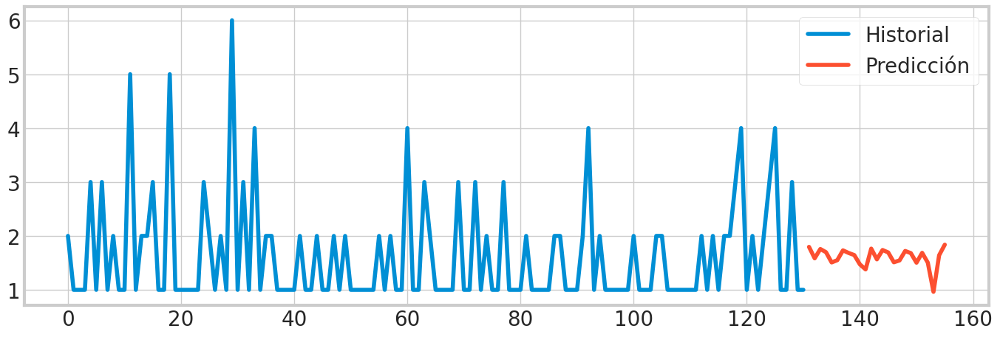

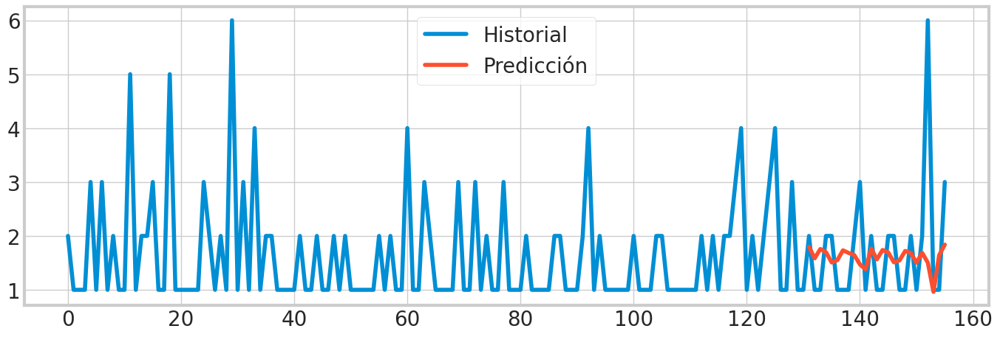

In [571]:
predictions=df.predict_arima((2,0,1), 25)

In [572]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 934
df_result_total = df_result_total.append(df_result)

<ipython-input-572-d4fab7886121>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 9

In [573]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-03-14,2.0,1.746313,1.796648,934
1,2023-03-20,1.0,1.468009,1.584666,934
2,2023-03-28,1.0,1.746313,1.757194,934
3,2023-04-03,2.0,1.746313,1.698286,934
4,2023-04-04,2.0,1.468009,1.508073,934
5,2023-04-10,1.0,1.468009,1.550068,934
6,2023-04-19,1.0,1.746313,1.732369,934
7,2023-05-02,1.0,1.746313,1.684040,934
8,2023-05-09,2.0,1.746313,1.644731,934
9,2023-05-16,3.0,1.468009,1.471129,934


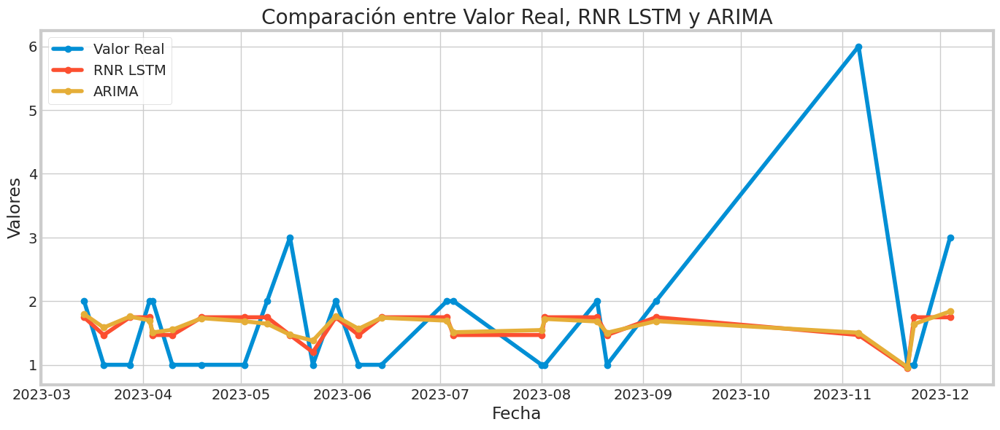

MAE (RNR LSTM): 0.689213421344757
MSE (RNR LSTM): 1.198152574859317
RMSE (RNR LSTM): 1.0946015598651946
MAE (ARIMA): 0.7057379554416081
MSE (ARIMA): 1.1882170750062753
RMSE (ARIMA): 1.090053702808387


In [574]:
graficar_comparacion(df_result)

# SUB-ART 10 :DOBLE CLIP DE 19 MM METALICE (12 PIEZAS) 939 (RNR LSTM)

In [575]:
df=dataframe[dataframe['subarticle_id'] == 939]
df=df[['Date', 'Total']]
df=df.reset_index(drop=True)
df_result = pd.DataFrame()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_107 (LSTM)             (None, 1, 100)            40800     
                                                                 
 dropout_107 (Dropout)       (None, 1, 100)            0         
                                                                 
 lstm_108 (LSTM)             (None, 1, 100)            80400     
                                                                 
 dropout_108 (Dropout)       (None, 1, 100)            0         
                                                                 
 lstm_109 (LSTM)             (None, 100)               80400     
                                                                 
 dropout_109 (Dropout)       (None, 100)               0         
                                                                 
 dense_30 (Dense)            (None, 1)               

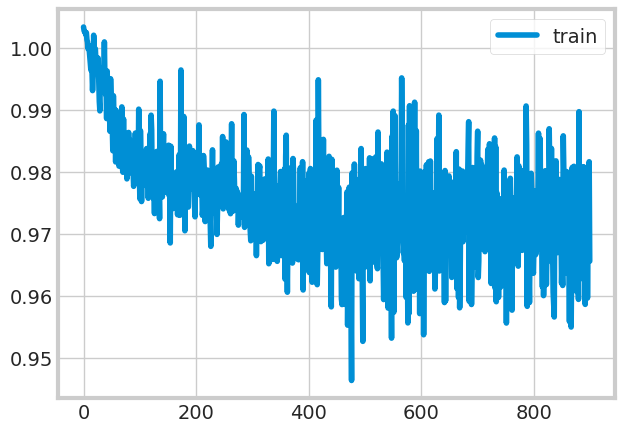

1/1 [==============================] - 1s 1s/step


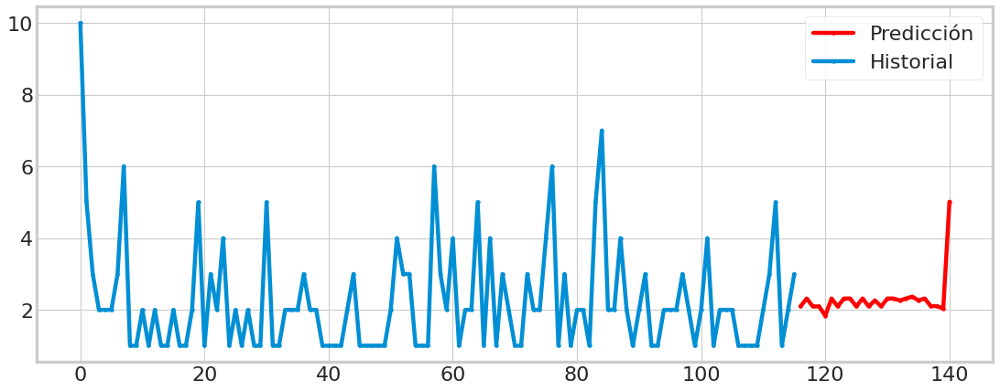

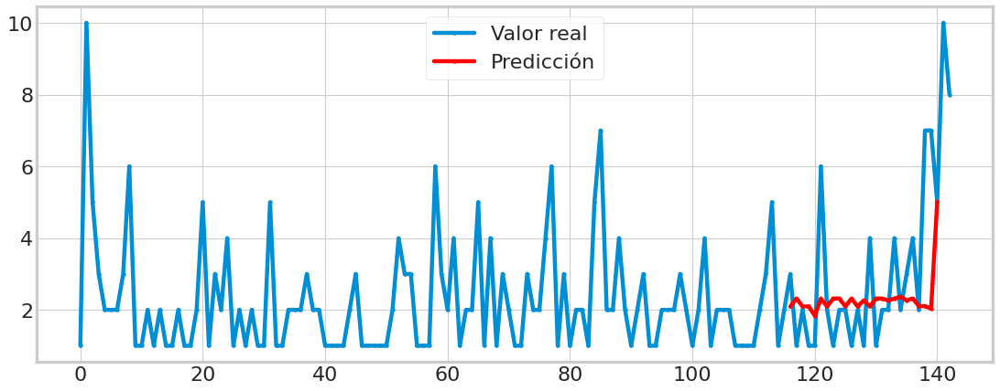

[[-0.08917502]
 [ 0.05579777]
 [-0.08917502]
 [-0.08917502]
 [-0.25894934]
 [ 0.05579777]
 [-0.08917502]
 [ 0.05579777]
 [ 0.05579777]
 [-0.08917502]
 [ 0.05579777]
 [-0.08917502]
 [ 0.02163649]
 [-0.08917502]
 [ 0.05579777]
 [ 0.05579777]
 [ 0.02163649]
 [ 0.05579777]
 [ 0.09004229]
 [ 0.02163649]
 [ 0.05579777]
 [-0.08295762]
 [-0.08295762]
 [-0.12741591]
 [ 1.8227363 ]]
25
RMSE:  2.5425045015306753
MAPE:  55.10065829413278


In [576]:
df = datasetIngestadoRnrLstm(df)
rmse_1, mape_1 = genera_modelo('Total', 26, 1, 0.2, 'adam', 'mean_squared_error', 900, 32, False,100,3)

In [577]:
df_result=df.getdf_resultado()
df_result.head(50)

,Date,Valor_real,RNR LSTM
0,2023-02-07,2.0,2.094610
1,2023-02-14,1.0,2.315966
2,2023-03-20,1.0,2.094610
3,2023-03-28,6.0,2.094610
4,2023-04-10,2.0,1.835385
5,2023-04-13,1.0,2.315966
6,2023-04-18,2.0,2.094610
7,2023-04-25,2.0,2.315966
8,2023-04-27,1.0,2.315966
9,2023-05-09,2.0,2.094610


# SUB-ART 10 :DOBLE CLIP DE 19 MM METALICE (12 PIEZAS) 939 (ARIMA)

In [578]:
df=dataframe[dataframe['subarticle_id'] == 939]
df=df.reset_index(drop=True)
df=df[['Date', 'Total']]
df = datasetIngestadoArima(df)

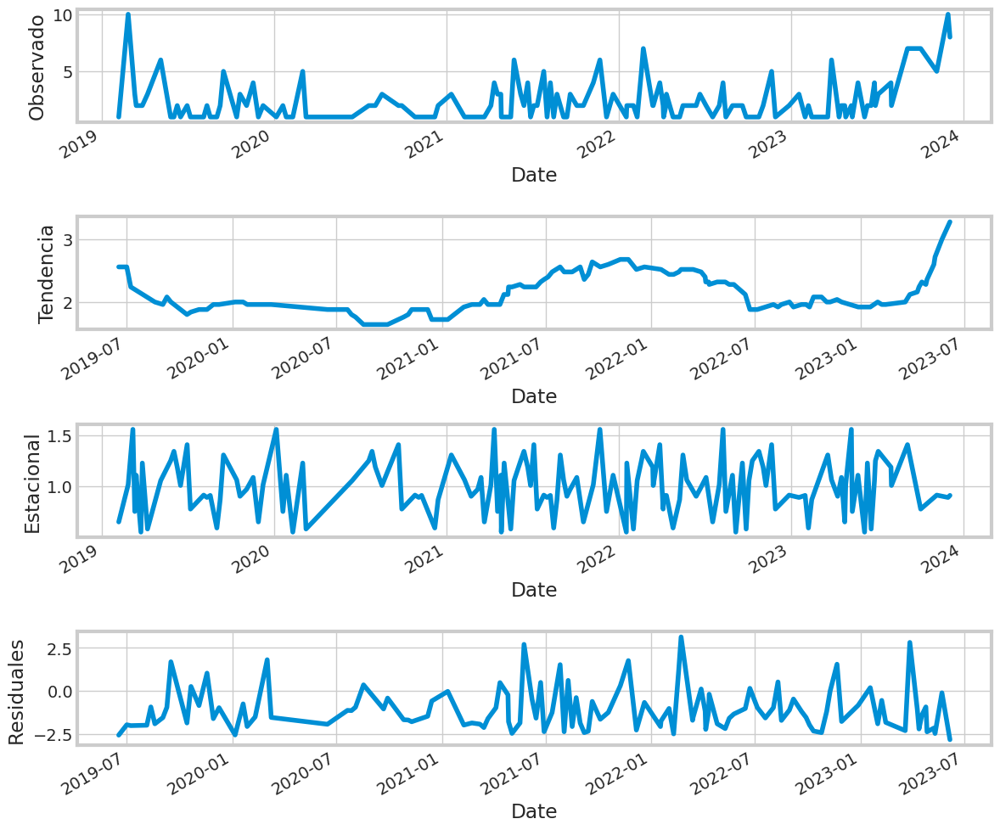

In [579]:
df.seasonal_decompose_plot(25)

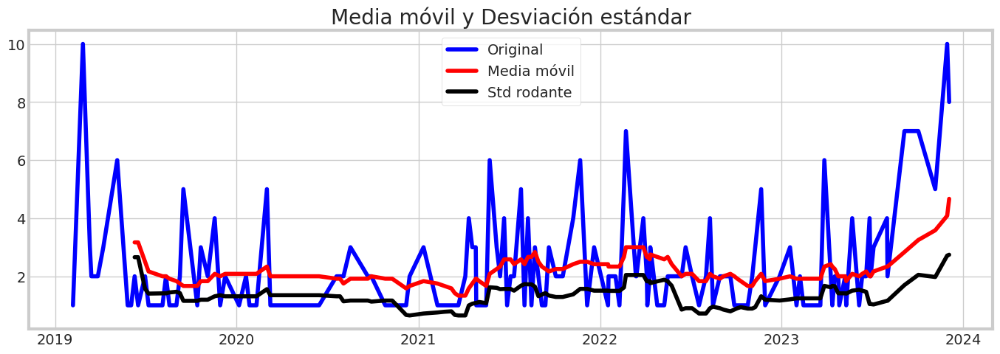

Results of Dickey-Fuller Test:
Test Statistic                  -3.881296
p-value                          0.002177
#Lags Used                       2.000000
Number of Observations Used    140.000000
Critical Value (1%)             -3.477945
Critical Value (5%)             -2.882416
Critical Value (10%)            -2.577902
dtype: float64


In [580]:
df.test_stationarity(0)

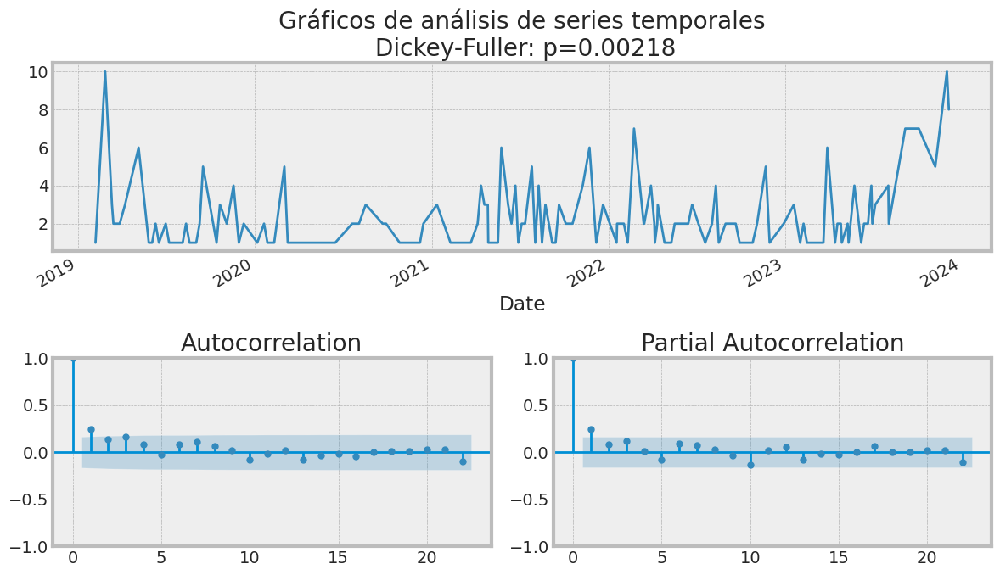

In [581]:
df.tsplot(0)

In [582]:
df.fit_arima((1,0,1))

                               SARIMAX Results                                
Dep. Variable:                  Total   No. Observations:                  143
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -277.038
Date:                Wed, 14 Feb 2024   AIC                            562.076
Time:                        21:50:23   BIC                            573.928
Sample:                             0   HQIC                           566.892
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.7540      0.710      3.881      0.000       1.363       4.145
ar.L1          0.9226      0.081     11.386      0.000       0.764       1.081
ma.L1         -0.7125      0.111     -6.405      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


predicted = 2.109810, expected = 2.000000
predicted = 2.227607, expected = 1.000000
predicted = 2.110793, expected = 1.000000
predicted = 2.120299, expected = 6.000000
predicted = 2.510059, expected = 2.000000
predicted = 2.126363, expected = 1.000000
predicted = 2.182288, expected = 2.000000
predicted = 2.213554, expected = 2.000000
predicted = 2.198400, expected = 1.000000
predicted = 2.124533, expected = 2.000000
predicted = 2.217721, expected = 1.000000
predicted = 2.103326, expected = 4.000000
predicted = 2.346204, expected = 1.000000
predicted = 2.093735, expected = 2.000000
predicted = 2.222027, expected = 2.000000
predicted = 2.175688, expected = 4.000000
predicted = 2.304918, expected = 2.000000
predicted = 2.167551, expected = 3.000000
predicted = 2.259865, expected = 4.000000
predicted = 2.302008, expected = 2.000000
predicted = 2.188289, expected = 7.000000
predicted = 2.463129, expected = 7.000000
predicted = 2.671427, expected = 5.000000
predicted = 2.931257, expected = 1

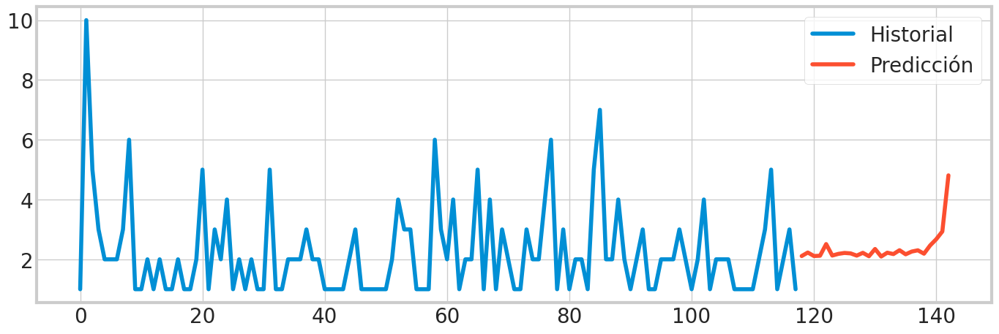

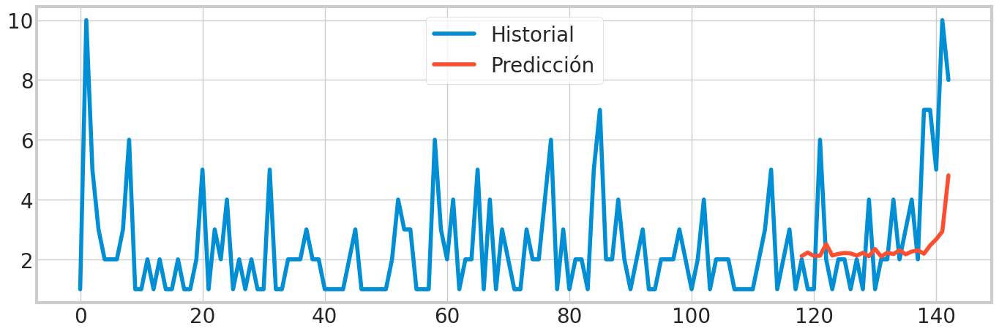

In [583]:
predictions=df.predict_arima((1,0,1), 25)

In [584]:
df_result['ARIMA']=predictions['ARIMA'].values
df_result['ID']= 939
df_result_total = df_result_total.append(df_result)

<ipython-input-584-35e8d4712886>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result_total = df_result_total.append(df_result)


# RESULTADOS SUB-ARTICULO 10

In [585]:
df_result.head(50)

,Date,Valor_real,RNR LSTM,ARIMA,ID
0,2023-02-07,2.0,2.094610,2.109810,939
1,2023-02-14,1.0,2.315966,2.227607,939
2,2023-03-20,1.0,2.094610,2.110793,939
3,2023-03-28,6.0,2.094610,2.120299,939
4,2023-04-10,2.0,1.835385,2.510059,939
5,2023-04-13,1.0,2.315966,2.126363,939
6,2023-04-18,2.0,2.094610,2.182288,939
7,2023-04-25,2.0,2.315966,2.213554,939
8,2023-04-27,1.0,2.315966,2.198400,939
9,2023-05-09,2.0,2.094610,2.124533,939


In [586]:
df_result_total.to_csv('df_result_total.csv', index=False)

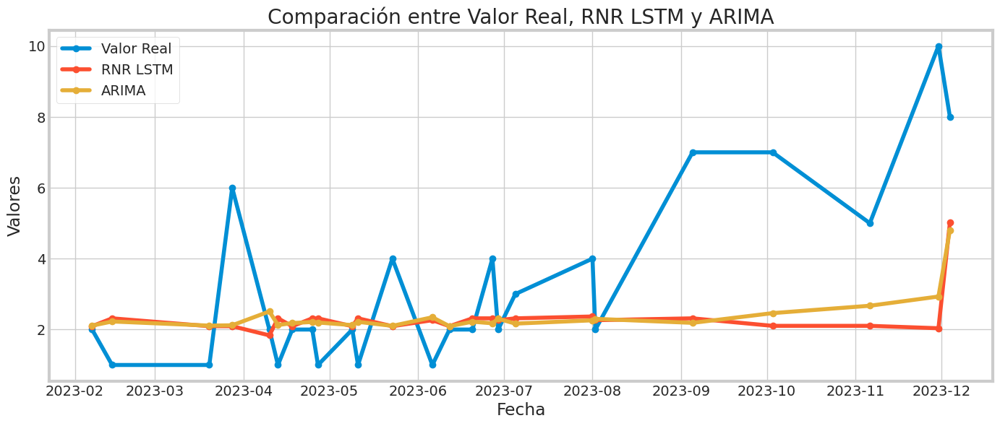

MAE (RNR LSTM): 1.7024484443664551
MSE (RNR LSTM): 6.464329140303748
RMSE (RNR LSTM): 2.5425045015306753
MAE (ARIMA): 1.6560392097568226
MSE (ARIMA): 5.774437811231545
RMSE (ARIMA): 2.4030059948388693


In [587]:
graficar_comparacion(df_result)